# Notebook to compute the LSST's passbands and the impact of the atmospheric parameters on the colors of reference sources 

In this notebook we are going to take the reference spectra from the pysynphot's spectral atlases and make them pass through the LSST's throughput and the simulated atmospheres from the previous notebooks. 

This notebook requires [pysynphot](https://pysynphot.readthedocs.io/en/latest/) 


# Load necessary packages 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import pysynphot as S
from scipy.interpolate import interp1d
from scipy import integrate
from astropy.io import fits
#import quadpy

# allow interactive plots
#%matplotlib widget

In [2]:
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 45238.93416
   waveset: Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True


# Set LSST's parameters 

In [3]:
WLMIN=3400. # Minimum wavelength : PySynPhot works with Angstrom
WLMAX=10600. # Minimum wavelength : PySynPhot works with Angstrom

NBINS=int(WLMAX-WLMIN) # Number of bins between WLMIN and WLMAX
BinWidth=(WLMAX-WLMIN)/float(NBINS) # Bin width in Angstrom
WL=np.linspace(WLMIN,WLMAX,NBINS)   # Array of wavelength in Angstrom
# from key numbers
Reff=642.3/2. # effective radius in cm
Seff= np.pi*Reff**2  # in cm2
print(Seff)
exptime=30.0

324015.4546769212


In [4]:
S.refs.setref(area=Seff, waveset=None) # set by default to 6.4230 m effective aperture 
S.refs.set_default_waveset(minwave=WLMIN, maxwave=WLMAX, num=NBINS, delta=BinWidth, log=False)
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 324015.4546769212
   waveset: Min: 3400.0, Max: 10600.0, Num: None, Delta: 1.0, Log: False


# Define general paths 

In [5]:
outdir_plots0 = 'output_plots/'
if os.path.exists(outdir_plots0)==False:
    os.mkdir(outdir_plots0)
outdir_files = 'output_files/'
if os.path.exists(outdir_files)==False:
    os.mkdir(outdir_files)

# Define paths to spectral atlases 

In [6]:
pysynphot_root_path=os.environ['PYSYN_CDBS']
path_dict = {
    'calspec':os.path.join(pysynphot_root_path,'calspec'),
    'bpgs':os.path.join(pysynphot_root_path,'grid/bpgs'),
    'jacoby':os.path.join(pysynphot_root_path,'grid/jacobi'),
    'pickles':os.path.join(pysynphot_root_path,'grid/pickles/dat_uvk')
}

atlas_dir = 'spectral_atlases/'
file_dict = {
    'calspec':'',
    'bpgs':os.path.join(atlas_dir,'atlas_bpgs.txt'),
    'jacoby':os.path.join(atlas_dir,'atlas_jacoby.txt'),
    'pickles':os.path.join(atlas_dir,'atlas_pickles.txt')
}


# Select a spectral atlas 

Options: 
* calspec (HST calibration spectra): work in progress, need to separate stars from AGNs and other sources 
* bpgs (Bruzual-Persson-Gunn-Stryker): 175 spectra 
* jacobi (Jacoby-Hunter-Christian): 161 spectra 
* pickles (Pickles): 131 spectra 

In [7]:
atlas_name = 'pickles'

atlas_path = path_dict[atlas_name]
atlas_file = file_dict[atlas_name]

# Find the spectra files and information 

In [8]:
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
atlas_seds = pd.read_csv(atlas_file)
atlas_seds

,File,Type,Teff,Name
0,pickles_uk_1.fits,O5V,39810.70,unknown
1,pickles_uk_2.fits,O9V,35481.40,unknown
2,pickles_uk_3.fits,B0V,28183.80,unknown
3,pickles_uk_4.fits,B1V,22387.20,unknown
4,pickles_uk_5.fits,B3V,19054.60,unknown
...,...,...,...,...
126,pickles_uk_127.fits,G8I,4591.98,unknown
127,pickles_uk_128.fits,K2I,4255.98,unknown
128,pickles_uk_129.fits,K3I,NaN,unknown
129,pickles_uk_130.fits,K4I,3990.25,unknown


# Load with pysynphot the spectra from the selected atlas 

In [9]:
sed_list = np.array(atlas_seds['File'])

In [10]:
sed_dict = {}
type_dict = {}
for i,sed in enumerate(sed_list):
    #print('-------')
    #print(sed)
    spec_ = S.FileSpectrum(os.path.join(atlas_path,sed))
    sed_dict[sed[:-5]] = spec_
    type_dict[sed[:-5]] = atlas_seds['Type'][i]

# Define also the spectral types 

In [11]:
spectral_types = ['O','B','A','F','G','K','M']

<img align="center" src = Stellar_Classification_Chart.png width=750 style="padding: 10px"> 

https://upload.wikimedia.org/wikipedia/commons/3/37/Stellar_Classification_Chart.png

# Organise spectra by spectral type 

In [12]:
spec_by_type = {}
for i in range(len(spectral_types)):
    spec_type = spectral_types[i]
    
    type_list_ = []
    spec_by_type[spec_type] = []
    for sed_ in type_dict.keys():
        if spec_type in type_dict[sed_]:
            type_list_.append(type_dict[sed_])
            spec_by_type[spec_type].append(sed_dict[sed_])
    print(spec_type, type_list_)
    print(len(type_list_))
    print('-----------')

O ['O5V', 'O9V', 'O8III']
3
-----------
B ['B0V', 'B1V', 'B3V', 'B57V', 'B8V', 'B9V', 'B2IV', 'B6IV', 'B12III', 'B3III', 'B5III', 'B9III', 'B2II', 'B5II', 'B0I', 'B1I', 'B3I', 'B5I', 'B8I']
19
-----------
A ['A0V', 'A2V', 'A3V', 'A5V', 'A7V', 'A0IV', 'A47IV', 'A0III', 'A3III', 'A5III', 'A7III', 'A0I', 'A2I']
13
-----------
F ['F0V', 'F2V', 'F5V', 'wF5V', 'F6V', 'rF6V', 'F8V', 'wF8V', 'rF8V', 'F02IV', 'F5IV', 'F8IV', 'F0III', 'F2III', 'F5III', 'F0II', 'F2II', 'F0I', 'F5I', 'F8I']
20
-----------
G ['G0V', 'wG0V', 'rG0V', 'G2V', 'G5V', 'wG5V', 'rG5V', 'G8V', 'G0IV', 'G2IV', 'G5IV', 'G8IV', 'G0III', 'G5III', 'wG5III', 'rG5III', 'G8III', 'wG8III', 'G5II', 'G0I', 'G2I', 'G5I', 'G8I']
23
-----------
K ['K0V', 'rK0V', 'K2V', 'K3V', 'K4V', 'K5V', 'K7V', 'K0IV', 'K1IV', 'K3IV', 'K0III', 'wK0III', 'rK0III', 'K1III', 'wK1III', 'rK1III', 'K2III', 'wK2III', 'rK2III', 'K3III', 'wK3III', 'rK3III', 'K4III', 'wK4III', 'rK4III', 'K5III', 'rK5III', 'K01II', 'K34II', 'K2I', 'K3I', 'K4I']
32
-----------
M [

Now we can plot them by spectral type separately 

In [13]:
type_colors = {'O':'b','B':'dodgerblue','A':'cyan','F':'g','G':'gold','K':'r','M':'brown'}

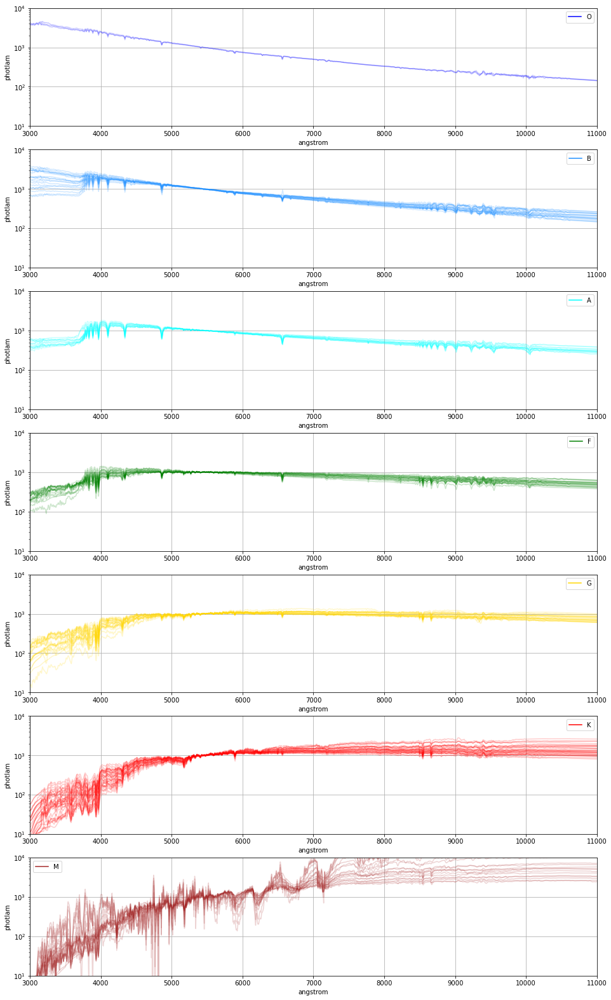

In [14]:
num_rows = len(spectral_types)
fig, axs = plt.subplots(num_rows, 1, figsize=(16,28))

for row,st in enumerate(spectral_types):
    for spec in spec_by_type[st]:
        spec.convert('photlam')
        axs[row].plot(spec.wave,spec.flux,color=type_colors[st],alpha=0.2)
    axs[row].plot([],[],label=st,color=type_colors[st])
    axs[row].grid()
    #axs[row].set_yscale("log")
    axs[row].set_xlabel(spec.waveunits)
    axs[row].set_ylabel(spec.fluxunits)
    axs[row].legend()
    axs[row].set_xlim(3000,11000)
    axs[row].set_ylim(10,10000)
    axs[row].set_yscale("log")
            

# Load LSST's throughput 

https://github.com/lsst/throughputs/tree/main/baseline

In [15]:
throughput_path = 'data/lsst/'
throughput_label = 'hardware_{0}.dat'

In [16]:
filters = ['u','g','r','i','z','Y']
filter_names = {0:'u',1:'g',2:'r',3:'i',4:'z',5:'Y'}
filter_colors = {0:'b',1:'g',2:'r',3:'orange',4:'k',5:'grey'}

Write the throughputs in pysynphot format 

In [17]:
lsst_bp = []
for f in filters:
    throughput_ = np.loadtxt(throughput_path+throughput_label.format(f.lower()))
    wl = throughput_[:,0]*10.
    lsst_bp.append(S.ArrayBandpass(wl, throughput_[:,1] , name=f))


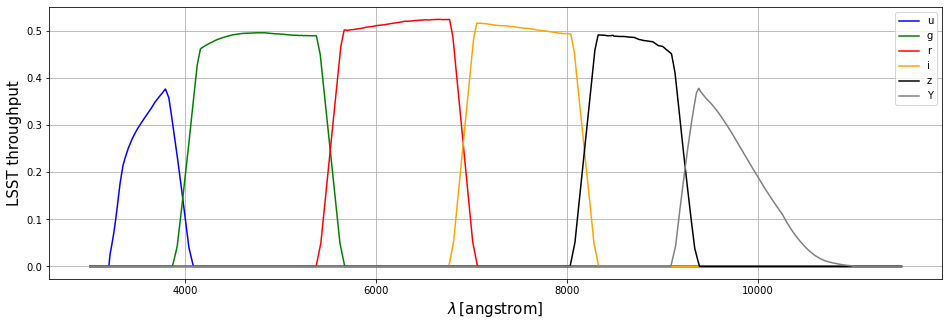

In [18]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

In [19]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [20]:
wl_lsst = lsst_bp[0].wave

# Load simulated transparencies 

Select variable parameter and specify airmass and clouds 

In [21]:
variable_param = 'pwv'
am0 = 1.2
cloud0 = 0.0
pwv0 = 3.0
aero0 = 0.04

Specify which distribution follows the simulated parameter. Options: 
* linear_distribution-discrete: generated following a linear function and with pre-established step (e.g., PWV = 1.0, 2.0, 3.0, ....) 
* linear_distribution-continuous: generated following a linear function and specifying only the value range and number of simulations (e.g., PWV = 1.0, 1.25, 1.5, ....) 
* uniform_distribution: generated following a uniform random distribution (work in progress) 
* specific_distribution: generated following random distributions specific to each parameter (work in progress) 


In [22]:
param_dist = 'linear_distribution-discrete'

In [23]:
outdir_plots_ = os.path.join('output_plots/',param_dist.split('-')[0])
if os.path.exists(outdir_plots_)==False:
    os.mkdir(outdir_plots_)

outdir_plots = os.path.join('output_plots/',param_dist.replace('-','/'))
if os.path.exists(outdir_plots)==False:
    os.mkdir(outdir_plots)

In [24]:
if variable_param=='airmass' or variable_param=='cloud':
    t_file = 'simulated_transparencies_varying_{0}.fits'.format(variable_param)
    t_file_ref = 'simulated_transparencies_varying_{0}_ref.fits'.format(variable_param)
else:
    t_file = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}.fits'.format(variable_param,am0,cloud0)
    t_file_ref = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}_ref.fits'.format(variable_param,am0,cloud0)

t_path = os.path.join('./simulated_transparencies/',param_dist.replace('-','/'))
t_in = os.path.join(t_path,t_file)
t_in_ref = os.path.join(t_path,t_file_ref)
t = fits.open(t_in)
t_ref = fits.open(t_in_ref)

In [25]:
head = t[0].header
data = t[0].data
print(data.shape)
data_ref = t_ref[0].data
print(data_ref.shape)

(10, 956)
(2, 956)


In [26]:
n_atmp = head['ID_RES']
n_sim = head['NTRANSP']
print(n_atmp, n_sim)

5 9


In [27]:
wl_t = data[0][n_atmp:]*10.

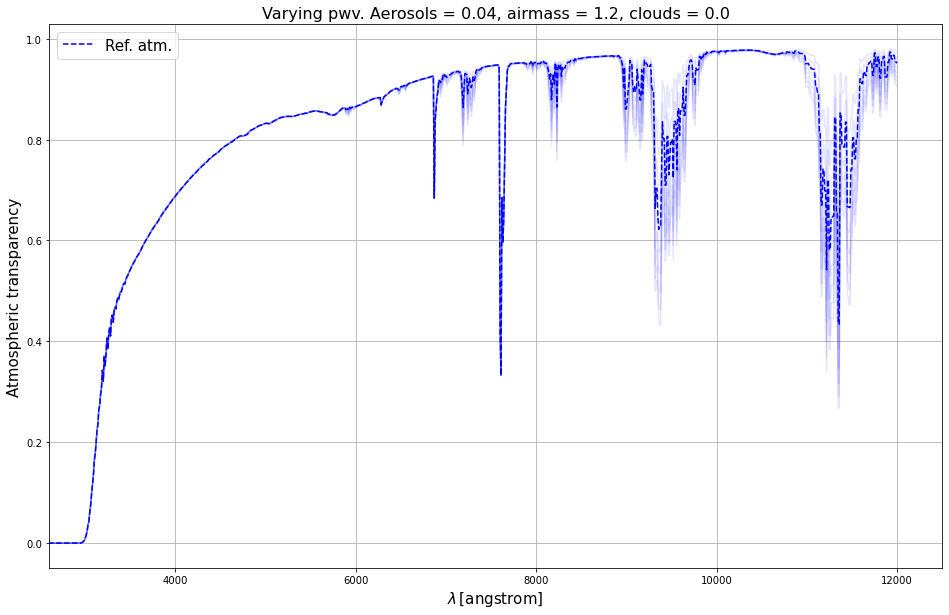

In [28]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for atm_i in range(1,n_sim):
    ax.plot(wl_t,data[atm_i][n_atmp:],color='b',alpha=0.1)
ax.plot(wl_t,data_ref[1][n_atmp:],ls='--',color='b',label='Ref. atm.')
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \,$'+'[angstrom]',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
plt.legend(fontsize=15)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Check range of values of variable parameter 

In [29]:
print(head)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  956                                                  NAXIS2  =                   10                                                  NTRANSP =                    9                                                  ID_AM   =                    4                                                  ID_VAOD =                    1                                                  ID_PWV  =                    0                                                  ID_O3   =                    2                                                  ID_CLD  =                    3                                                  ID_RES  =                    5                                                  END                                     

In [30]:
params_index = {'pwv':0,'aerosol':1,'ozone':2,'cloud':3,'airmass':4}

In [31]:
var_index = params_index[variable_param]

In [32]:
#data[1:,1]
data[1:,var_index]

array([1., 2., 3., 4., 5., 6., 7., 8., 9.])

# Select data for variable parameter of these simulations 

In [33]:
atm_vals = data[1:,var_index]

In [34]:
np.save('output_files/atm_vals_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),atm_vals)

# Convert simulated transparencies into pysynphot format 

In [35]:
atm_transp = []
for i in range(1,n_sim+1):
    finterp_i = interp1d(wl_t,data[i][n_atmp:],bounds_error=False,fill_value=0.)
    atm_interp_i = finterp_i(wl_lsst)
    #atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
    atm_i = S.ArrayBandpass(wl_lsst,atm_interp_i, name='Atm. transp. {0}'.format(i))
    atm_transp.append(atm_i)

In [36]:
finterp_ref = interp1d(wl_t,data_ref[1][n_atmp:],bounds_error=False,fill_value=0.)
atm_interp_ref = finterp_ref(wl_lsst)
#atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
atm_transp_ref = S.ArrayBandpass(wl_lsst,atm_interp_ref, name='Atm. transp. {0}'.format(i))

# Compute total bandpass (atmosphere(s) x LSST throughput) 

In [37]:
total_passband = {}
#for bpname in filters:
#    total_passband[bpname] = []

for index,bp in enumerate(lsst_bp):
    total_passband[filters[index]] = []
    for i in range(n_sim):
        total_pass = bp*atm_transp[i]
        total_passband[bp.name].append(total_pass)

In [38]:
total_passband_ref = {}
for index,bp in enumerate(lsst_bp):
    total_pass = bp*atm_transp_ref
    total_passband_ref[bp.name] = total_pass

In [39]:
print(len(total_passband['u']))
print(total_passband['u'][0])

9
(u * Atm. transp. 1)


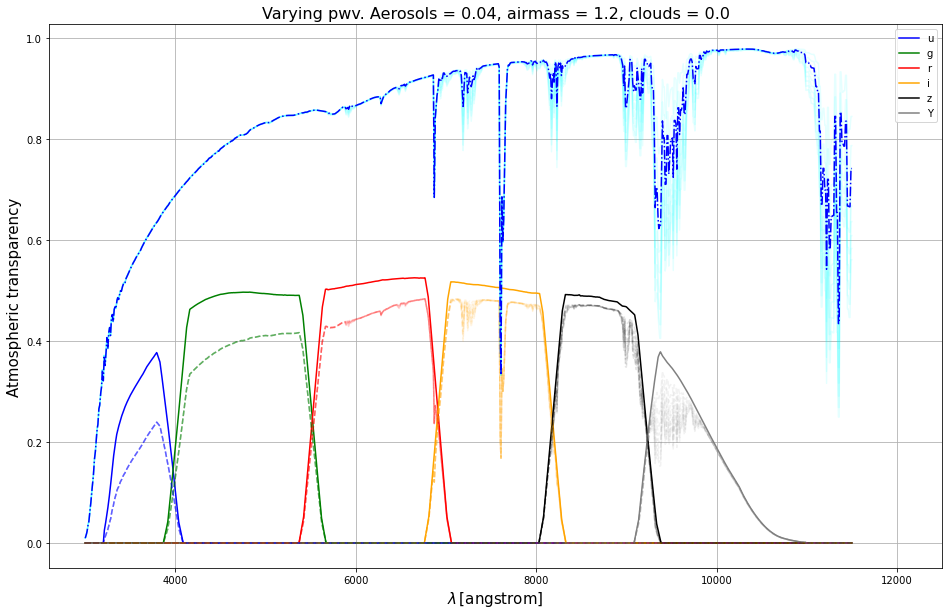

In [40]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for index,bp in enumerate(lsst_bp):
    ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])

for isim in range(n_sim):
    ax.plot(atm_transp[isim].wave,atm_transp[isim].throughput,alpha=0.1,color='cyan')
    for index,bpname in enumerate(filters):
        ax.plot(total_passband[bpname][isim].wave,total_passband[bpname][isim].throughput,ls='--',color=filter_colors[index],alpha=0.1)
ax.plot(atm_transp_ref.wave,atm_transp_ref.throughput,ls='-.',color='b')        
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.legend()
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'total_passbands_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Plot the atmospheric transparencies corresponding to the minimum and maximum atmospheric parameter that we are varying: 

In [41]:
min_val_ = np.min(atm_vals)
max_val_ = np.max(atm_vals)
print(min_val_,max_val_)

1.0 9.0


In [42]:
min_ind_ = np.where(atm_vals==min_val_)[0][0]
max_ind_ = np.where(atm_vals==max_val_)[0][0]

In [43]:
min_transp = data[1+min_ind_,n_atmp:]
max_transp = data[1+max_ind_,n_atmp:]

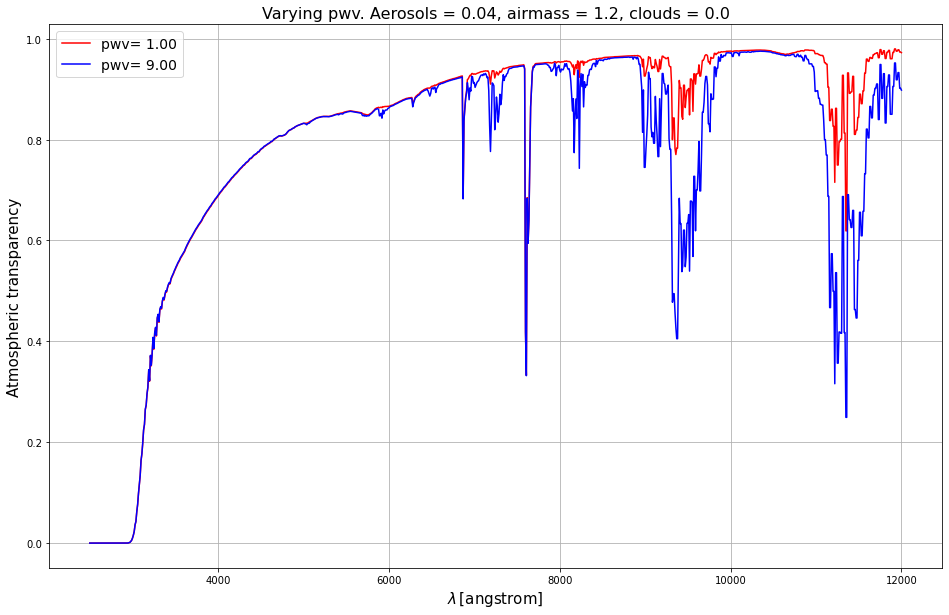

In [44]:
fig=plt.figure(figsize=(16,10))
plt.plot(wl_t,min_transp,color='r',label=variable_param+'= {0:.2f}'.format(min_val_))
plt.plot(wl_t,max_transp,color='b',label=variable_param+'= {0:.2f}'.format(max_val_))
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.grid()
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}_min_max_values.png'.format(variable_param,am0,cloud0)))

# Calculate fluxes through total passbands 

Let's start with one spectrum of a type A star as example 

In [45]:
# Example with one spectrum 
test_type = 'A'
test_spec = 0
example_spec = spec_by_type[test_type][test_spec]

In [46]:
# It seems this galaxy is a small enough place to end up choosing again, just by coincidence, Vega as example star 
vega = S.Vega
vega.convert('photlam')

photlam


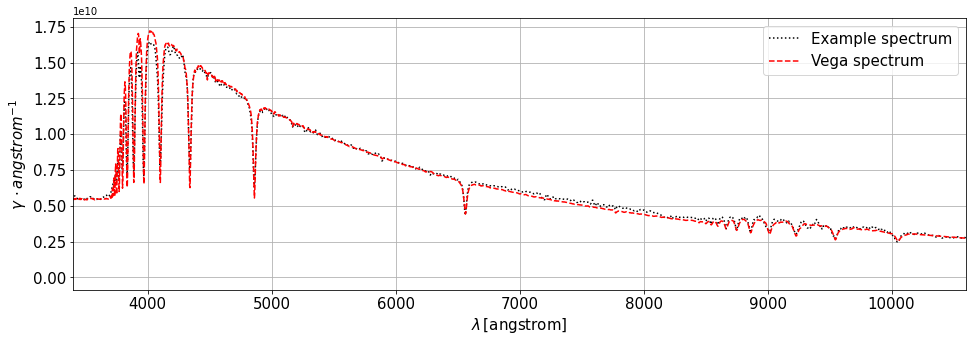

In [47]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0,label='Example spectrum')
plt.plot(vega.wave,vega.flux*Seff*exptime,ls='--',color='r',alpha=1.0,label='Vega spectrum')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(example_spec.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Let's make the example spectrum pass through the atmosphere and through the total passband (atm. x throughput) 

In [48]:
obsatm_dict = {}
for isim in range(n_sim):
    obsatm_dict[isim] = []
    obsatm = S.Observation(example_spec,atm_transp[isim],force='taper')
    obsatm_dict[isim] = obsatm

obstotal_dict = {}
for filter in filters:
    obstotal_dict[filter] = []

#for filter in lsst_bp:
for filter in filters:
    #print(filter.name.upper())
    for i in range(n_sim):
        #total_pass = filter*atm_transp[i]
        #obs = S.Observation(spec,total_pass,force='taper')
        obstotal = S.Observation(example_spec,total_passband[filter][i],force='taper')
        obstotal_dict[filter].append(obstotal)

(Atm. transp. 1) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 2) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 3) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 4) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 5) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 6) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 7) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 8) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 9) does not have a defined

u
g
r
i
z
Y
photlam


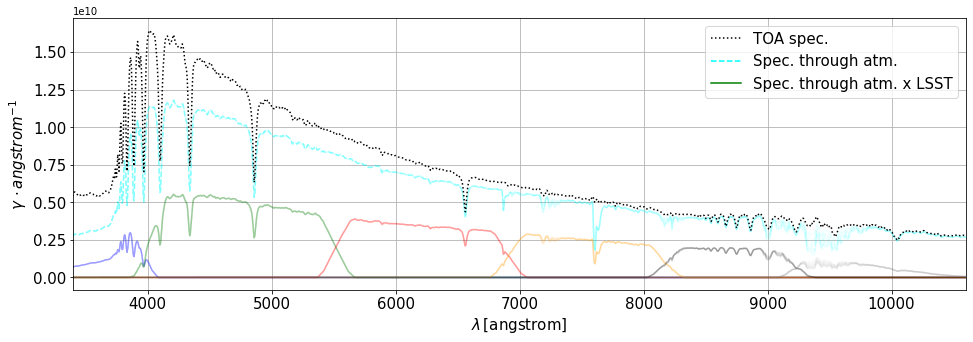

In [49]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for isim in range(n_sim):
    obsatm = obsatm_dict[isim]
    ax.plot(obsatm.binwave,obsatm.binflux*Seff*exptime,ls='--',color='cyan',alpha=0.07)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0)
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls=':',color='k',label='TOA spec.')
plt.plot([],[],ls='--',color='cyan',label='Spec. through atm.')
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Now we look at the same information but restricted to the most extreme atmospheric parameter values:

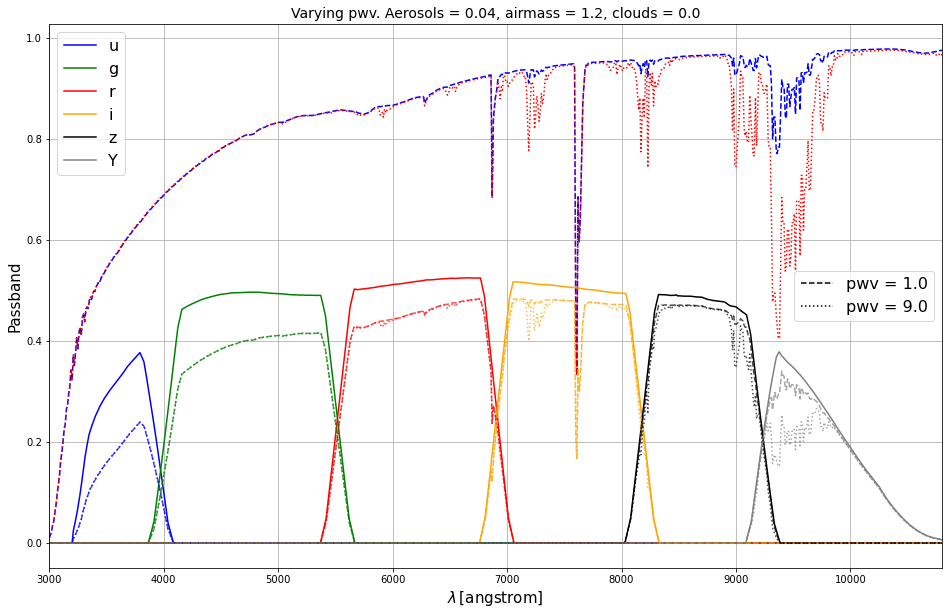

In [50]:
 fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
legend_lines1 = []
for index,bp in enumerate(lsst_bp):
    line_, = ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])
    legend_lines1.append(line_)

ax.plot(atm_transp[min_ind_].wave,atm_transp[min_ind_].throughput,ls='--',alpha=1.0,color='b')
ax.plot(atm_transp[max_ind_].wave,atm_transp[max_ind_].throughput,ls=':',alpha=1.0,color='r')

for index,bpname in enumerate(filters):
    ax.plot(total_passband[bpname][min_ind_].wave,total_passband[bpname][min_ind_].throughput,ls='--',color=filter_colors[index],alpha=0.7)
    ax.plot(total_passband[bpname][max_ind_].wave,total_passband[bpname][max_ind_].throughput,ls=':',color=filter_colors[index],alpha=0.7)        
line1, = plt.plot([],[],ls='--',color='k',label='{0} = {1}'.format(variable_param,min_val_))
line2, = plt.plot([],[],ls=':',color='k',label='{0} = {1}'.format(variable_param,max_val_))
legend_lines2 = [line1,line2]
plt.xlim(3000.,10800.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Passband',fontsize=15)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=14)
legend1 = plt.legend(handles=legend_lines1,fontsize=16,loc="upper left")
plt.gca().add_artist(legend1)
plt.legend(handles=legend_lines2,fontsize=16,loc="center right")
plt.savefig(os.path.join(outdir_plots,'total_passbands_min_max_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

u
g
r
i
z
Y
photlam


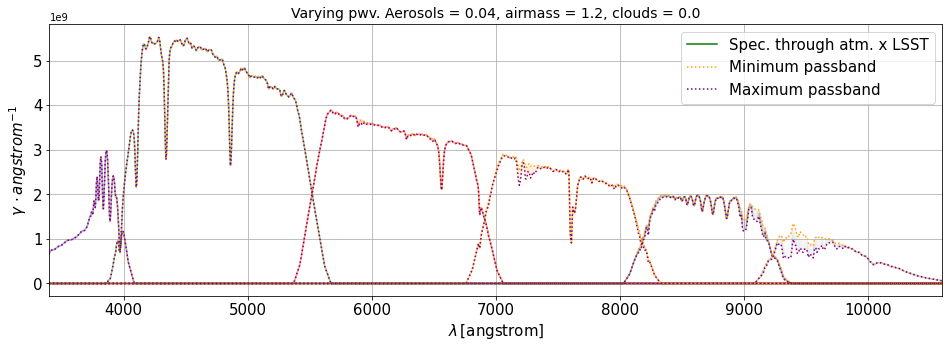

In [51]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
    ax.plot(obstotal_dict[filter][min_ind_].binwave,obstotal_dict[filter][min_ind_].binflux*Seff*exptime,ls=':',color='orange')
    ax.plot(obstotal_dict[filter][max_ind_].binwave,obstotal_dict[filter][max_ind_].binflux*Seff*exptime,ls=':',color='purple')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.plot([],[],ls=':',color='orange',label='Minimum passband')
plt.plot([],[],ls=':',color='purple',label='Maximum passband')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=14)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_min_max_total_passband_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))
print(spec.fluxunits)

This was an example of how the spectrum looks like when passing only through the atmosphere and through the total passbands. For our calibration purposes, what we actually want is to have the spectra passing through either only the troughput (as if the telescope was on space) and through the total passband (ground-based telescope). Now let's pass all spectra through the throughput and through the atmosphere x throughput 

In [52]:
# Spectra through atm x throughput 
obs_dict = {}
#for sed_ in list(sed_dict.keys()):
for st in spectral_types:
    print(st)
    obs_dict_ = {}
    for si,spec in enumerate(spec_by_type[st]):
        filter_dict_ = {}
        for filter in filters:
            filter_dict_[filter] = []
            for i in range(n_sim):
                obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
                filter_dict_[filter].append(obs_spec)
        obs_dict_[si] = filter_dict_ 
    obs_dict[st] = obs_dict_


O
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [53]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(obs_dict[test_type].keys()))
#print(len(obs_dict[example_spec].keys()))
print(len(obs_dict[test_type][test_spec].keys()))
print(len(obs_dict[test_type][test_spec]['u']))
print(n_sim)

131
7
13
6
9
9


In [54]:
# Spectra only through throughput (as if telescope was in space) 
obs_dict_t = {}
for st in spectral_types:
    print(st)
    obs_dict_t_ = {}
    for si,spec in enumerate(spec_by_type[test_type]):
        filter_dict_ = {}
        for filter in lsst_bp:
            obs_spec_t = S.Observation(spec,filter,force='taper')
            filter_dict_[filter.name] = obs_spec_t
        obs_dict_t_[si] = filter_dict_ 
    obs_dict_t[st] = obs_dict_t_
    

O
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset 

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
B
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset 

In [55]:
print(len(sed_dict.keys()))
print(len(obs_dict_t.keys()))
print(len(obs_dict_t[test_type].keys()))
print(len(obs_dict_t[test_type][test_spec].keys()))

131
7
13
6


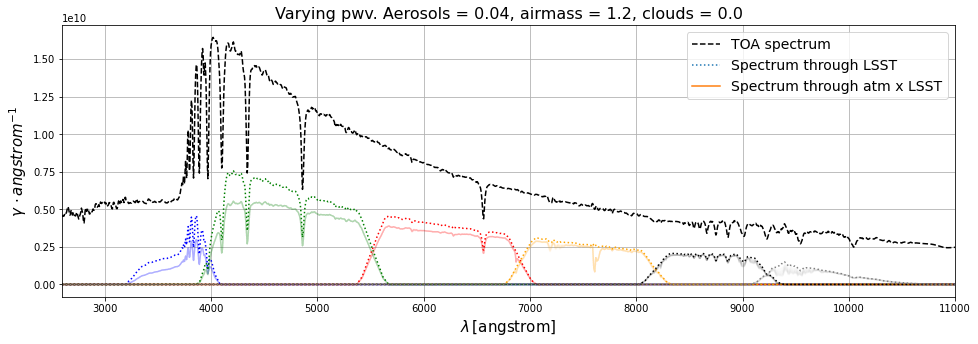

In [56]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
spec_by_type[test_type][test_spec].convert('photlam')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(obs_dict_t[test_type][test_spec][filter].wave,obs_dict_t[test_type][test_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = obs_dict[test_type][test_spec][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Calculate magnitudes with our own function 

Physical constants 

In [57]:
c_light = S.units.C #speed of light [Angstrom /s] 
print(c_light)
h_planck = S.units.H #Planck's constant [erg*s] 
print(h_planck)

2.99792458e+18
6.6262e-27


In [58]:
# Reference flux value for an AB source in erg / s / cm2 / Hz 
f_ref = 3.63*10**(-20)

In [59]:
# Pivot wavelength [cm] 
wl_piv = 5.4929*10**(-5)

In [60]:
C = f_ref/(h_planck*wl_piv*10**8.)
print(C)

997.3334660532323


Definition of functions 

In [61]:
# The SED of an AB source (that is, constant flux in frequency units) expressed in photons / s / cm^2 / Angstrom 
def ABnphot(wl):
    #return 997.2*5500./wl
    return C*wl_piv*10**8./wl

We check that this function actually creates a spectrum with the properties of an AB source, that is, a flat spectrum in fnu units (erg/s/cm2/Hz) 

Text(0, 0.5, 'Flux [Jy]')

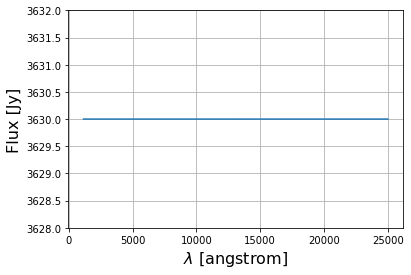

In [62]:
checkab = ABnphot(example_spec.wave)
checkab_ = S.ArraySpectrum(example_spec.wave, checkab, name='Flat AB spectrum')
#plt.plot(checkab_.wave,checkab_.flux)
checkab_.convert('fnu')
plt.plot(checkab_.wave,checkab_.flux*10**23.)
plt.ylim(3.628*10.**3,3.632*10**3.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel('Flux [Jy]',fontsize=16)

Now, we define our function to compute the AB magnitudes: 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu}^E(\lambda) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} \frac{A}{B} \, . $$ 
Now, we want to compute the error for the AB magnitudes. The denominator is constant for a given $S_{throughput}(\lambda)$, so we assume it does not contribute to the error. Then, we can approximate $A$ as 
$$A \approx \sum_i F_{\nu}^E(\lambda_i) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda_i) \frac{\Delta \lambda_i}{h \lambda_i} = \sum_i n_i \cdot S_{passband}(\lambda_i) \, , $$ 
where $n_i$ is the number of photo-electrons received within a given bin of wavelength, $\Delta \lambda_i$. Then, we can assume that $n_i$ is a Poisson random variable, so 
$$\sigma^2_{n_i} = n_i . $$ 
Taking this into account, we can write the error of $A$ as 
$$\sigma^2_A = \sum_i \left( \frac{\partial A}{\partial n_i} \right)^2 \sigma^2_{n_i} = \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, , $$ 
therefore, 
$$\sigma_A = \sqrt{n_i} \, . $$
Finally, the error on $m_{AB}$ is given by 
$$\sigma^2_{m_{AB}} = \left( \frac{\partial m_{AB}}{\partial A} \right)^2 \sigma^2_A = \left( \frac{-2.5}{A \log 10} \right)^2 \cdot \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, . $$ 


In [63]:
def myAB(spec,passband,filter,return_error=False,renormalize=None):
    f_units = str(spec.fluxunits)
    if f_units!='fnu':
        print('ATTENTION: converting flux units to fnu')
        spec.convert('fnu')
        
    observation = S.Observation(spec,passband,force='taper')
    print('Observation units = ', observation.fluxunits)
    nan_mask = np.isnan(observation.flux)
    
    obs_wave_ = observation.wave[~nan_mask]
    obs_flux_ = observation.flux[~nan_mask]
    wave_min = np.min(observation.wave[~nan_mask])
    wave_max = np.max(observation.wave[~nan_mask])
    
    if renormalize!=None:
        renorm = np.power(10.,-1.*renormalize/2.5)
    else:
        renorm = 1.0
    
    num = np.trapz(obs_flux_*renorm/obs_wave_,x=obs_wave_)*Seff*exptime/h_planck
    
    if return_error:
        finterp_pb = interp1d(passband.wave,passband.throughput,bounds_error=False,fill_value=0.)
        pb_interp = finterp_pb(spec.wave)
        
        delta_lambda = list(np.diff(spec.wave))
        delta_lambda.append(spec.wave[-1]-spec.wave[-2])
        delta_lambda = np.array(delta_lambda)
        assert len(delta_lambda)==len(spec.wave)
        
        assert str(spec.fluxunits)=='fnu'
        n_i = spec.flux*renorm*delta_lambda*Seff*exptime/(spec.wave*h_planck)
        print('n_i = ', n_i)
        print('Number of collected photoelectrons = {0:.2e}'.format(np.sum(n_i*pb_interp)))
        err2_num = np.sum(n_i*np.array(pb_interp)**2.)
    
    spec.convert(f_units)
    
    print('Numerator = {0:.2e}'.format(num))
    if return_error:
        print('Variance of the numerator = {0:.2e}'.format(err2_num))
    
    flatsp_nphot = ABnphot(spec.wave)
    flatsp_ = S.ArraySpectrum(spec.wave, flatsp_nphot, name='Flat AB spectrum')
    
    flatsp_.convert('fnu')
    ab_obs = S.Observation(flatsp_,filter,force='taper')
    print('AB observation units = ', ab_obs.fluxunits)
    
    ab_wave_ = ab_obs.wave[~nan_mask]
    ab_flux_ = ab_obs.flux[~nan_mask]
    
    den = np.trapz(ab_flux_/ab_wave_,x=ab_wave_)*Seff*exptime/h_planck
    
    print('Denominator = {0:.2e}'.format(den))
    mab = -2.5*np.log10(num/den)
    print('AB magnitude = ', mab)
    print('---------')
    
    if return_error:
        err2_mab = (2.5**2./np.log(10.)**2.)*err2_num/num**2.
        err_mab = np.sqrt(err2_mab)
        
        return mab,err_mab
    else:
        return mab

In [64]:
# This function gives the flux of an AB source in photons / s / cm^2 / Angstrom 
flatsp_nphot = ABnphot(example_spec.wave)

In [65]:
#Let's write this in pysynphot format (note that the result will be in photlam units, then we use ABnphot as input)
flatsp = S.ArraySpectrum(example_spec.wave, flatsp_nphot, name='Flat AB spectrum')

Now we check that the AB magnitudes are zero for the flat AB spectrum (they have to be through any filter, by definition) 

In [66]:
for filter in lsst_bp:
    myAB(flatsp,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+12
(r) does not have a defined binset in the w

We check the same for the total passband. Note that, given the definition of AB magnitudes that we have implemented, the denominator only considers the throughput of the telescope, even when the spectra pass through the total passband, since the "reference" we want to compare to is when there is no effect of the atmosphere, but in any case the light passes through the telescope, so we consider the telescope's throughput to be the reference (i.e. as if it had a transmission = 1) with respect to which the flux is attenuated. Therefore, the following AB magnitudes of a flat AB spectrum should be different from (greater than) zero  

In [67]:
for fi,filter in enumerate(filters):
    myAB(flatsp,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907842494301049
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2490206415575848
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Make the flat spectrum pass through the throughputs and total passbands 

In [68]:
flat_dict_t = {}
for fi,filter in enumerate(filters):
    flat_spec_t_ = S.Observation(flatsp,lsst_bp[fi],force='taper')
    flat_dict_t[filter] = flat_spec_t_

flat_dict = {}
for fi,filter in enumerate(filters):
    flat_dict[filter] = []
    for i in range(n_sim):
        flat_spec_ = S.Observation(flatsp,total_passband[filter][i],force='taper')
        flat_dict[filter].append(flat_spec_)

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum wi

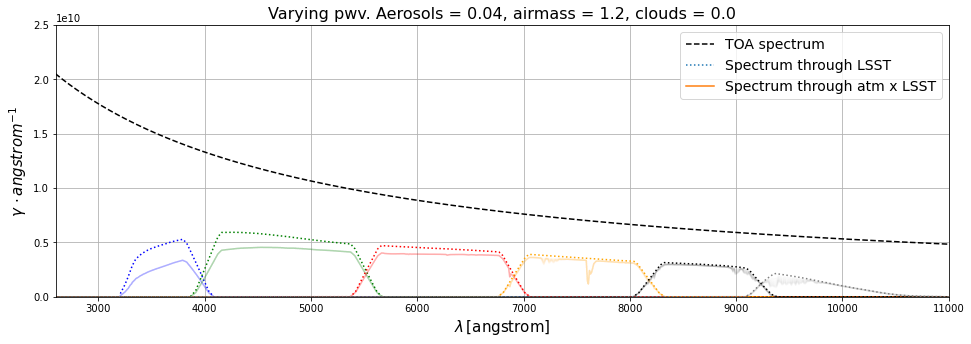

In [69]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
if str(flatsp.fluxunits)!='photlam':
    flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(flat_dict_t[filter].wave,flat_dict_t[filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = flat_dict[filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.ylim(0.,2.5e10)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'flat_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now, let's see the AB magnitudes of the example spectrum with myAB function. To better understand it, we can compare the AB spectrum and the example spectrum (Vega) flux amplitudes in each range of wavelengths (see plot below) 

photlam


Text(0, 0.5, '$\\gamma / angstrom$')

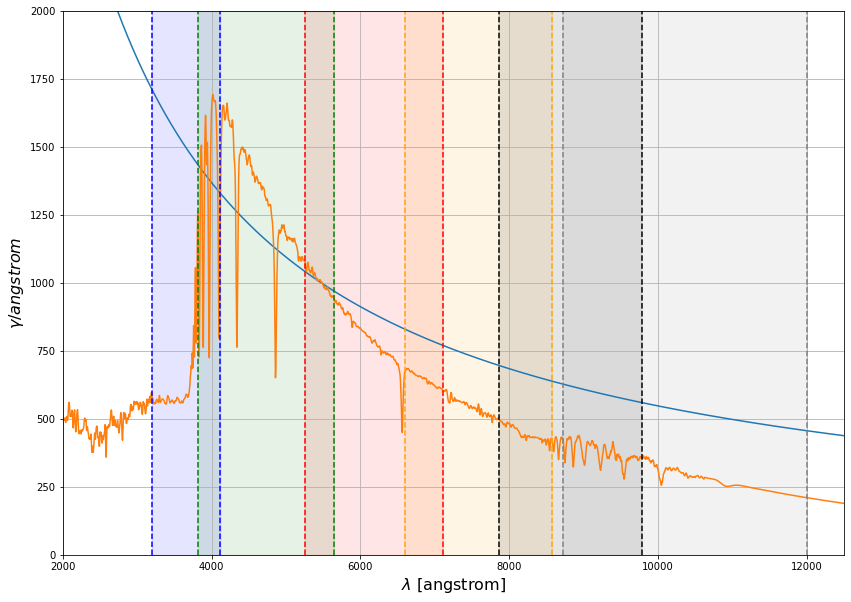

In [70]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*2000.,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*2000.,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*2000.,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*2000.,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*2000.,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*2000.,color=filter_colors[5],alpha=0.1)

plt.xlim(2000.,12500.)
plt.ylim(0.,2000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)

In [71]:
for filter in lsst_bp:
    myAB(example_spec,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.59e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7222408197036627
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.09224087927554477
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not 

In [72]:
for fi,filter in enumerate(filters):
    myAB(example_spec,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.59e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2700717573625688
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.15895508931776064
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obs

# Calculate magnitudes and colours

We compute the magnitudes for the spectra of each spectral type for each atmosphere 

In [73]:
calc_mag_err = True

In [74]:
# Magnitudes of spectra passing only through throughput. We define this in case we want to use the TOA observations 
# as reference, instead of a given atmosphere 
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_,mag_ab_err_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index],return_error=True)
            mag_dict_[filters[index]] = mag_ab_
            print(mag_ab_err_)
            print('#############')
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.35e+12
Numerator = 6.35e+12
Variance of the numerator = 1.83e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.782974805695664
---------
2.3107160827722158e-07
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.10e+13
Numerator = 1.10e+13
Variance of the numerator = 5.03e+1

Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 4.90e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.2908701229895349
---------
2.2364703145795426e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 2.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.24718493616003281
---------
3.397729062865149e-07
#############
ATTENTION: converting flux units to

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.00e+13
Numerator = 1.00e+13
Variance of the numerator = 4.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.2137593769665922
---------
2.3224051064069375e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude 

Denominator = 4.55e+12
AB magnitude =  0.3893783846781446
---------
4.17952472668155e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.90e+12
Numerator = 1.90e+12
Variance of the numerator = 8.41e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5223410905487663
---------
5.226009977446123e-07
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Nu

Number of collected photoelectrons = 2.41e+12
Numerator = 2.41e+12
Variance of the numerator = 6.91e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.2679657747346097
---------
3.7408266441761244e-07
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 9.59e+12
Numerator = 9.59e+12
Variance of the numerator = 4.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.16686901589266892
---------
2.3765343687346187e-07
#############
ATTENTION: converting flux units t

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 5.01e+12
Numerator = 5.01e+12
Variance of the numerator = 2.41e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.22407212292522352
---------
3.361137222929731e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.91e+12
Numerator = 2.91e+12
Variance of the numerator = 1.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 9.44e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.062115422822667576
---------
3.226079028637788e-07
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 9.54e+12
Numerator = 9.54e+12
Variance of the numerator = 4.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.21e+12
Numerator = 5.21e+12
Variance of the numerator = 2.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1827956827799154
---------
3.301753677760263e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude = 

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.93e+12
Numerator = 8.93e+12
Variance of the numerator = 4.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.08960856098214849
---------
2.4632134001049213e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.38e+12
Numerator = 5.38e+12
Variance of the numerator = 2.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+12
Numerator = 1.04e+12
Variance of the numerator = 2.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.49573573525133946
---------
5.422987245689613e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.44e+12
Numerator = 1.44e+12
Variance of the numerator = 4.08e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =

Denominator = 4.55e+12
AB magnitude =  0.3398135341202235
---------
4.0859594887398867e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 2.00e+12
Numerator = 2.00e+12
Variance of the numerator = 8.82e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.46888559657996925
---------
5.095634512478281e-07
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 5.78e+12
Numerator = 5.78e+12
Variance of the numerator = 2.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.06980045589987552
---------
3.135549743445544e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.85e+12
Numerator = 3.85e+12
Variance of the numerator = 1.81e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.12e+12
Numerator = 1.12e+12
Variance of the numerator = 2.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.41616029135927046
---------
5.241637264971431e-07
#############
F
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.18e+12
Numerator = 1.18e+12
Variance of the numerator = 3.40e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.05e+12
Numerator = 5.05e+12
Variance of the numerator = 2.38e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.11362105936816347
---------
3.3152802043414724e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 3.34e+12
Numerator = 3.34e+12
Variance of the numerator = 1.47e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 3.27e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10298995878503642
---------
2.900393072593929e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.45e+12
Numerator = 5.45e+12
Variance of the numerator = 2.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.63e+12
Numerator = 6.63e+12
Variance of the numerator = 3.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23398321950457007
---------
2.87149046635716e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.73e+12
Numerator = 6.73e+12
Variance of the numerator = 3.25e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 3.54e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0122481997935906
---------
5.314998565513211e-07
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 8.23e+12
Numerator = 8.23e+12
Variance of the numerator = 3.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude = 

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.015130442160196848
---------
4.133399366443636e-07
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.62e+12
Numerator = 1.62e+12
Variance of the numerator = 4.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude 

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 3.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2587714387525763
---------
2.9052192062934036e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 3.41e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =

Number of collected photoelectrons = 4.10e+12
Numerator = 4.10e+12
Variance of the numerator = 1.81e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3106212510159944
---------
3.559064645614531e-07
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 2.14e+12
Numerator = 2.14e+12
Variance of the numerator = 5.59e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2844199760903722
---------
3.7907036852048727e-07
#############
ATTENTION: converting flux units to

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 7.02e+12
Numerator = 7.02e+12
Variance of the numerator = 3.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14207504526462517
---------
2.850046094379475e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.92e+12
Numerator = 5.92e+12
Variance of the numerator = 2.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 6.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3727339108867733
---------
3.6377327615014755e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.23e+11
Numerator = 4.23e+11
Variance of the numerator = 1.22e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude 

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.77e+12
Numerator = 7.77e+12
Variance of the numerator = 3.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.252095457191778
---------
2.7108126636980606e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.14e+12
Numerator = 7.14e+12
Variance of the numerator = 3.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4892099

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.52e+12
Numerator = 5.52e+12
Variance of the numerator = 2.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.43252365608485643
---------
3.1483649866461983e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.50e+12
Numerator = 7.50e+12
Variance of the numerator = 3.64e+12
(r) does not have a defined binset in t

Number of collected photoelectrons = 6.84e+12
Numerator = 6.84e+12
Variance of the numerator = 3.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.44135161123050237
---------
2.8519079388560523e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.89e+12
Numerator = 4.89e+12
Variance of the numerator = 2.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5023893908633708
---------
3.256221466333105e-07
#############
ATTENTION: converting flux units t

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 2.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5549719689483923
---------
3.32883155446651e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.88e+12
Numerator = 8.88e+12
Variance of the numerator = 4.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 7.95e+12
Numerator = 7.95e+12
Variance of the numerator = 3.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2762093927045305
---------
2.6819553893305665e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 7.33e+12
Numerator = 7.33e+12
Variance of the numerator = 3.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude 

Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 3.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5349900710964693
---------
2.7316174729745296e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.54e+12
Numerator = 5.54e+12
Variance of the numerator = 2.44e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.63653342832904
---------
3.064900952237174e-07
#############
ATTENTION: converting flux units to fnu
(Y)

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 8.71e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7899998199618254
---------
2.970468948547004e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.94e+11
Numerator = 2.94e+11
Variance of the numerator = 8.47e+10
(u) does not have a defined binset in th

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 5.14e+12
Numerator = 5.14e+12
Variance of the numerator = 2.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5097062917730212
---------
3.2623687831794747e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 8.06e+12
Numerator = 8.06e+12
Variance of the numerator = 3.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 8.68e+12
Numerator = 8.68e+12
Variance of the numerator = 4.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7005587903243935
---------
2.5313495854084613e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 6.82e+12
Numerator = 6.82e+12
Variance of the numerator = 3.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 1.21e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.1456981976905776
---------
2.5229147539262253e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 1.21e+11
Numerator = 1.21e+11
Variance of the numerator = 3.40e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude 

Denominator = 6.16e+12
AB magnitude =  -0.34459740416657647
---------
2.599423203785007e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 8.20e+12
Numerator = 8.20e+12
Variance of the numerator = 3.87e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6389596095228598
---------
2.6051672351161725e-07
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+0

Denominator = 1.65e+12
AB magnitude =  -1.2201967222842878
---------
2.4294928229017144e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.31e+10
Numerator = 7.31e+10
Variance of the numerator = 2.11e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.064880047971454
---------
2.1599315496496813e-06
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.05e+12
Numerator = 4.05e+12
Variance of the numerator = 1.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.767762288656285
---------
3.6582039312321404e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 5.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.91e+13
Numerator = 2.91e+13
Variance of the numerator = 7.49e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.11685279125769
---------
1.0216175999841535e-07
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.94e+10
Numerator = 9.94e+10
Variance of the numerator = 2.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 1.93e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7364594283720607
---------
3.6130062916791395e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 9.56e+12
Numerator = 9.56e+12
Variance of the numerator = 4.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =

Number of collected photoelectrons = 9.48e+12
Numerator = 9.48e+12
Variance of the numerator = 4.52e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4675838328766313
---------
2.4352373512157283e-07
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.26e+13
Numerator = 2.27e+13
Variance of the numerator = 1.06e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.742035782380435
---------
1.5607616866973297e-07
#############
ATTENTION: converting flux units to

Denominator = 4.55e+12
AB magnitude =  -2.9296968125265637
---------
8.850834618219337e-08
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 1.57e+14
Numerator = 1.57e+14
Variance of the numerator = 6.73e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.265385443538165
---------
5.6858824252843136e-08
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.79e+12
Numerator = 3.79e+12
Variance of the numerator = 1.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8411385737865735
---------
3.7866859147476113e-07
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 5.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =

In [75]:
print(len(obs_dict.keys()))
print(len(mag_dict_t.keys()))
print(len(mag_dict_t[test_type].keys()))
print(len(mag_dict_t[test_type][test_spec].keys()))
print(mag_dict_t[test_type][test_spec]['u'])

7
7
13
6
0.7222408197036627


We check the distribution of the magnitudes from TOA: 

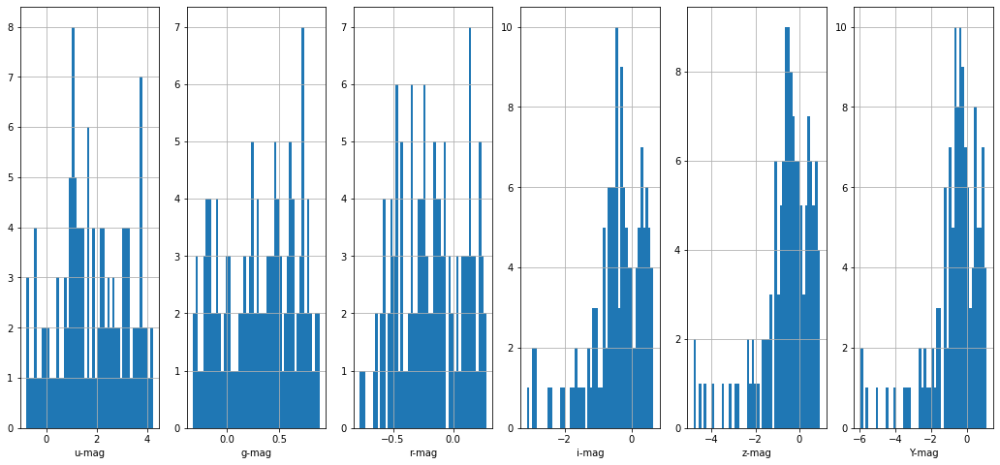

In [76]:
fig_rows = 1
fig_cols = 6
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(18,8))

for col,filter in enumerate(filters):
    mags_ = []
    for spec_type in spectral_types:
        for si in range(len(mag_dict_t[spec_type])):
            mags_.append(mag_dict_t[spec_type][si][filter])
    mags_ = np.array(mags_)
    axs[col].hist(mags_,bins=50)
    axs[col].grid()
    axs[col].set_xlabel('{0}-mag'.format(filter))

We see that the magnitudes are too brillant, so we can add magnitudes to make them fainter: 

In [77]:
add_mag = 22.

In [78]:
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_,mag_ab_err_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index],renormalize=add_mag,return_error=True)
            mag_dict_[filters[index]] = mag_ab_
            print(mag_ab_err_)
            print('#############')
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.01e+04
Numerator = 1.01e+04
Variance of the numerator = 2.90e+03
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  21.217025194304338
---------
0.0058042563753865
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.75e+04
Numerator = 1.75e+04
Variance of the numerator = 7.98e+03
(g

n_i =  [1.85880049e+03 2.06481039e+03 1.77939679e+03 ... 1.38178733e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.76e+03
Numerator = 7.76e+03
Variance of the numerator = 3.73e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.249173382072158
---------
0.008541343088002263
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85880049e+03 2.06481039e+03 1.77939679e+03 ... 1.38178733e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.13e+03
Numerator = 4.13e+03
Variance of the numerator = 1.95e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  

Denominator = 1.65e+12
AB magnitude =  22.737190677198246
---------
0.015324381816913342
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Number of collected photoelectrons = 3.56e+03
Numerator = 3.56e+03
Variance of the numerator = 1.02e+03
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.345097400058528
---------
0.009729585959571395
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Num

Number of collected photoelectrons = 4.93e+03
Numerator = 4.93e+03
Variance of the numerator = 2.32e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.41290239755535
---------
0.010610944577546593
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.02197248e+02 2.00123650e+02 1.60103569e+02 ... 3.23253820e-01
 2.81140457e-01 4.01222766e-02]
Number of collected photoelectrons = 2.95e+03
Numerator = 2.95e+03
Variance of the numerator = 1.30e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.546806011576397
---------
0.013277623765076036
#############
ATTENTION: converting flux units to fnu
(

n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 3.08e+03
Numerator = 3.08e+03
Variance of the numerator = 8.79e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.504315583185868
---------
0.01046344395757197
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 1.49e+04
Numerator = 1.49e+04
Variance of the numerator = 6.86e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.853424064389092
---------
0.006029

n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 4.44e+03
Numerator = 4.44e+03
Variance of the numerator = 2.09e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.52715306645114
---------
0.011189571702863174
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 2.40e+03
Numerator = 2.40e+03
Variance of the numerator = 1.06e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  2

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.10812285836536
---------
0.00882275717920793
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected photoelectrons = 1.41e+04
Numerator = 1.41e+04
Variance of the numerator = 6.50e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.910391439017857
---------
0.006187312317636138
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu

Numerator = 5.73e+03
Variance of the numerator = 2.70e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.24946102155357
---------
0.009840917288406225
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected photoelectrons = 3.48e+03
Numerator = 3.48e+03
Variance of the numerator = 1.54e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.36764156217263
---------
0.012220497897256684
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of t

Denominator = 3.09e+12
AB magnitude =  22.85243441499439
---------
0.01233245246288321
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 1.37e+04
Numerator = 1.37e+04
Variance of the numerator = 6.35e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.941420129174016
---------
0.006291926785033997
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 8.91e+03
Numerator

n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 3.81e+03
Numerator = 3.81e+03
Variance of the numerator = 1.68e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.268554390091985
---------
0.011676738144658652
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 1.98e+03
Numerator = 1.98e+03
Variance of the numerator = 5.20e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.3009161475052
---------
0.012510850069691418
##

n_i =  [0.31531011 0.37334318 0.28050923 ... 3.62343946 3.16769771 0.4524604 ]
Number of collected photoelectrons = 9.87e+03
Numerator = 9.87e+03
Variance of the numerator = 4.76e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.98831345658748
---------
0.00759273595496811
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.31531011 0.37334318 0.28050923 ... 3.62343946 3.16769771 0.4524604 ]
Number of collected photoelectrons = 7.20e+03
Numerator = 7.20e+03
Variance of the numerator = 3.40e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.00200183640886
---------
0.008784859354660066
###

Numerator = 2.70e+03
Variance of the numerator = 6.99e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.965356583046866
---------
0.01064802528007756
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected photoelectrons = 1.66e+03
Numerator = 1.66e+03
Variance of the numerator = 4.84e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.17289372496581
---------
0.014369321812835161
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of t

0.007285458005093078
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 8.64e+03
Numerator = 8.64e+03
Variance of the numerator = 4.07e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.80494113200031
---------
0.00802484351808275
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 5.74e+03
Numerator = 5.74e+03
Variance of the numerator = 2.53e+03
(z) does not have a

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 1.05e+04
Numerator = 1.05e+04
Variance of the numerator = 4.87e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.23398321950457
---------
0.0072128579406516725
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 1.07e+04
Numerator = 1.07e+04
Variance of the numerator = 5.15e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be

AB magnitude =  22.167771742904534
---------
0.006990320507527446
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 1.05e+04
Numerator = 1.05e+04
Variance of the numerator = 5.05e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.92568065621051
---------
0.007382305607146806
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 8.02e+03
Numerator = 8.02e+03
Variance o

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 9.48e+03
Numerator = 9.48e+03
Variance of the numerator = 4.57e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.032253669903827
---------
0.00774360690378609
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 6.78e+03
Numerator = 6.78e+03
Variance of the numerator = 3.20e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be 

Denominator = 8.22e+12
AB magnitude =  22.24914868069329
---------
0.007263937555233662
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 5.28e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.878696547081177
---------
0.007225063007013354
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 9.14e+03
Numerato

n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 1.00e+04
Numerator = 1.00e+04
Variance of the numerator = 4.63e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.287362043579037
---------
0.007391692960444539
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 1.12e+04
Numerator = 1.12e+04
Variance of the numerator = 5.42e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.84991424989611
---------
0.007132

n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 9.70e+03
Numerator = 9.70e+03
Variance of the numerator = 4.50e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.320441323870938
---------
0.007508493820608354
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 1.15e+04
Numerator = 1.15e+04
Variance of the numerator = 5.55e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.825615970837994
---------
0.007056382804093856


n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 1.05e+03
Numerator = 1.05e+03
Variance of the numerator = 3.03e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.67199146128996
---------
0.01801403043801676
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 9.87e+03
Numerator = 9.87e+03
Variance of the numerator = 4.58e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.301536273279986
---------
0.007445104542399957
##

n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 1.08e+03
Numerator = 1.08e+03
Variance of the numerator = 3.13e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.64106251659361
---------
0.017777891703185132
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 9.83e+03
Numerator = 9.83e+03
Variance of the numerator = 4.55e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.30572904031736
---------
0.007453169967145001
##

n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number of collected photoelectrons = 6.68e+02
Numerator = 6.68e+02
Variance of the numerator = 1.92e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.162665731326882
---------
0.02251734737263192
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number of collected photoelectrons = 8.82e+03
Numerator = 8.82e+03
Variance of the numerator = 4.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.42362028814979
---------
0.0078759

Denominator = 3.09e+12
AB magnitude =  24.14984848583854
---------
0.02242264769264466
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 8.72e+03
Numerator = 8.72e+03
Variance of the numerator = 4.05e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.435323090809675
---------
0.00791696121538515
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 1.20e+04
Numerator 

n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 8.05e+03
Numerator = 8.05e+03
Variance of the numerator = 3.73e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.52283084356531
---------
0.008242748283299897
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 1.24e+04
Numerator = 1.24e+04
Variance of the numerator = 5.99e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.744835759421317
---------
0.006801299067812735
#

Denominator = 3.09e+12
AB magnitude =  24.115322009266308
---------
0.02203008605713168
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 9.02e+03
Numerator = 9.02e+03
Variance of the numerator = 4.19e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.398553338362564
---------
0.00778521982546855
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 1.22e+04
Numerator

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 7.81e+03
Numerator = 7.81e+03
Variance of the numerator = 3.62e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.554971968948397
---------
0.008361646814445378
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 1.41e+04
Numerator = 1.41e+04
Variance of the numerator = 6.82e+03
(r) does not have a defined binset in the wavecat table. The waveset of the sp

Denominator = 3.09e+12
AB magnitude =  24.36657261516489
---------
0.02480251265321886
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 8.51e+03
Numerator = 8.51e+03
Variance of the numerator = 3.95e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.462510928573636
---------
0.008019066293131268
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 1.26e+04
Numerator

n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected photoelectrons = 4.84e+02
Numerator = 4.84e+02
Variance of the numerator = 1.39e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.51137979759187
---------
0.02641931461012368
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected photoelectrons = 8.55e+03
Numerator = 8.55e+03
Variance of the numerator = 3.97e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.457179125488068
---------
0.008004351625730747
##

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 8.17e+03
Numerator = 8.17e+03
Variance of the numerator = 3.80e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.506017505193853
---------
0.008184721493596107
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 1.29e+04
Numerator = 1.29e+04
Variance of the numerator = 6.25e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be

n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 7.85e+03
Numerator = 7.85e+03
Variance of the numerator = 3.64e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.54985209468943
---------
0.008345561720393522
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 1.33e+04
Numerator = 1.33e+04
Variance of the numerator = 6.45e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.663643667517547
---------
0.006552

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.59964429376395
---------
0.008541714339738523
#############
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 4.65607458 0.         0.        ]
Number of collected photoelectrons = 1.37e+04
Numerator = 1.37e+04
Variance of the numerator = 6.63e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.633753815466264
---------
0.006463704345058282
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fn

n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected photoelectrons = 1.45e+04
Numerator = 1.45e+04
Variance of the numerator = 7.02e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.5719920692179
---------
0.006283368566412748
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected photoelectrons = 1.57e+04
Numerator = 1.57e+04
Variance of the numerator = 7.41e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.153087183213827
---------
0.005937621971289433
##

Number of collected photoelectrons = 1.51e+04
Numerator = 1.51e+04
Variance of the numerator = 7.30e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.529224585221733
---------
0.006157991683192566
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 1.85e+04
Numerator = 1.85e+04
Variance of the numerator = 8.73e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.976056288391103
---------
0.005476261936170086
#############
ATTENTION: converting flux units to fnu
(z) does not have 

Number of collected photoelectrons = 1.44e+04
Numerator = 1.44e+04
Variance of the numerator = 6.99e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.576081410725333
---------
0.0062938308730856865
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Number of collected photoelectrons = 1.56e+04
Numerator = 1.56e+04
Variance of the numerator = 7.39e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.15994565545337
---------
0.005965502414095196
#############
ATTENTION: converting flux units to fnu
(z) does not have 

n_i =  [0.         0.         0.         ... 6.34242423 0.         0.        ]
Number of collected photoelectrons = 1.58e+04
Numerator = 1.58e+04
Variance of the numerator = 7.66e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.476834319460252
---------
0.006010039225317945
#############
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 6.34242423 0.         0.        ]
Number of collected photoelectrons = 2.00e+04
Numerator = 2.00e+04
Variance of the numerator = 9.44e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.891368075335578
---------
0.005267069447904241


(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 2.69e+04
Numerator = 2.69e+04
Variance of the numerator = 1.27e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.569589291127464
---------
0.004546296832858313
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 2.71e+04
Numerator = 2.71e+04
Variance of the numerator = 1.19e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be u

Number of collected photoelectrons = 5.03e+04
Numerator = 5.03e+04
Variance of the numerator = 2.37e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  19.89227015892809
---------
0.003323117039067329
#############
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.59888374]
Number of collected photoelectrons = 6.09e+04
Numerator = 6.09e+04
Variance of the numerator = 2.66e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.26120008662028
---------
0.0029093637998350284
#############
ATTENTION: converting flux units to fnu
(Y) does not 

n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 1.84e+04
Numerator = 1.84e+04
Variance of the numerator = 8.12e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.55876437821633
---------
0.005312360517410097
#############
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 1.15e+04
Numerator = 1.15e+04
Variance of the numerator = 2.92e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.394644356466905
---------
0.005124

n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 1.99e+04
Numerator = 1.99e+04
Variance of the numerator = 5.07e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.792712308312073
---------
0.0038779433174527004
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]
Number of collected photoelectrons = 1.90e+02
Numerator = 1.90e+02
Variance of the numerator = 5.57e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.52846539532959
------

Denominator = 1.65e+12
AB magnitude =  17.984471360222788
---------
0.0016654731333050651
#############
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 6.77e+02
Numerator = 6.77e+02
Variance of the numerator = 2.02e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.148308056462525
---------
0.022799604161000575
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collec

n_i =  [    0.             0.             0.         ... 10612.43290815
 10956.13960099  8471.58057315]
Number of collected photoelectrons = 1.31e+03
Numerator = 1.31e+03
Variance of the numerator = 4.03e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.42848202621752
---------
0.01659700272126088
#############
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [    0.             0.             0.         ... 10612.43290815
 10956.13960099  8471.58057315]
Number of collected photoelectrons = 8.28e+03
Numerator = 8.28e+03
Variance of the numerator = 3.78e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22

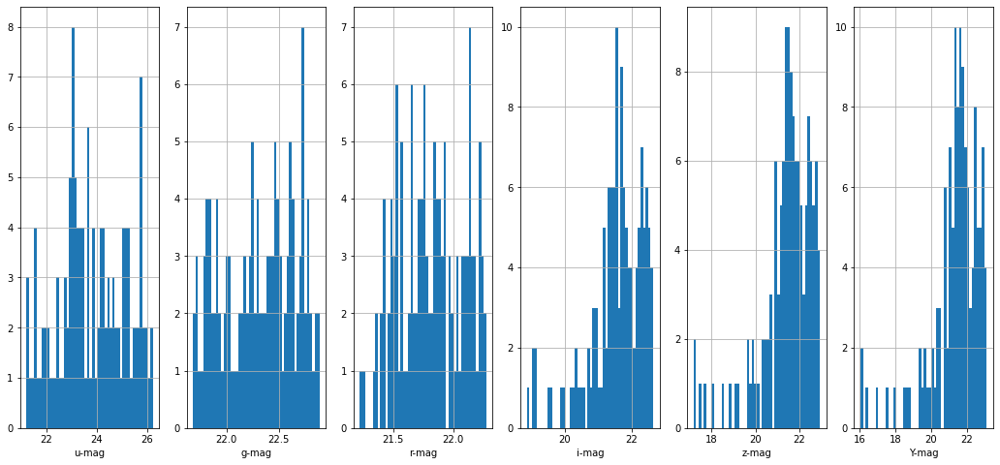

In [79]:
fig_rows = 1
fig_cols = 6
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(18,8))

for col,filter in enumerate(filters):
    mags_ = []
    for spec_type in spectral_types:
        for si in range(len(mag_dict_t[spec_type])):
            mags_.append(mag_dict_t[spec_type][si][filter])
    mags_ = np.array(mags_)
    axs[col].hist(mags_,bins=50)
    axs[col].grid()
    axs[col].set_xlabel('{0}-mag'.format(filter))

We confirm that the resulting magnitudes are shifted to a values around 25. Let's do the same for the spectra through atmosphere x throughput

In [80]:
# Magnitudes of spectra passing through atm x throughput 
mag_dict = {}
mag_dict_ref = {}
mag_err_dict = {}
mag_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    mag_dict_st = {}
    mag_dict_ref_st = {}
    mag_err_dict_st = {}
    mag_err_dict_ref_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        mag_dict_ = {}
        mag_dict_ref_ = {}
        mag_err_dict_ = {}
        mag_err_dict_ref_ = {}
        for fi,filter in enumerate(filters):
            mag_dict_[filter] = []
            mag_err_dict_[filter] = []
            for i in range(n_sim):
                #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
                if calc_mag_err:
                    mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True,renormalize=add_mag)
                    mag_err_dict_[filter].append(mag_ab_err_)
                    print(mag_ab_err_)
                    print('###########')
                else:
                    mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],renormalize=add_mag)
                mag_dict_[filter].append(mag_ab_)
                
            #mag_dict[sed_] = mag_dict_
            
            if calc_mag_err:
                mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True,renormalize=add_mag)
                mag_err_dict_ref_[filter] = mag_ab_err_
                print(mag_ab_err_)
                print('###########')
            else:
                mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],renormalize=add_mag)
            mag_dict_ref_[filter] = mag_ab_
        mag_dict_st[si] = mag_dict_
        mag_dict_ref_st[si] = mag_dict_ref_
        mag_err_dict_st[si] = mag_err_dict_
        mag_err_dict_ref_st[si] = mag_err_dict_ref_
    mag_dict[st] = mag_dict_st
    mag_dict_ref[st] = mag_dict_ref_st
    mag_err_dict[st] = mag_err_dict_st
    mag_err_dict_ref[st] = mag_err_dict_ref_st
        

O
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.80e+03
Numerator = 5.80e+03
Variance of the numerator = 1.00e+03
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  21.814930436072032
---------
0.005923926805137897
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.80e+03
Numerator = 5.80e+03
V

n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.78e+03
Numerator = 6.78e+03
Variance of the numerator = 2.87e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.39581348375602
---------
0.008579939670610959
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.78e+03
Numerator = 6.78e+03
Variance of the numerator = 2.87e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12


n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.95e+03
Numerator = 1.95e+03
Variance of the numerator = 8.15e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.996635755994753
---------
0.015895279295051516
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.35696580e+02 1.52576182e+02 1.29529407e+02 ... 1.06760813e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+03
Numerator = 1.94e+03
Variance of the numerator = 8.09e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12

n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.36e+03
Numerator = 5.36e+03
Variance of the numerator = 9.29e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  21.901344434791014
---------
0.006173275010509289
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.36e+03
Numerator = 5.36e+03
Variance of the numerator = 9.30e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12

n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.63e+03
Numerator = 6.63e+03
Variance of the numerator = 2.80e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.41954299057052
---------
0.00865920620988797
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.63e+03
Numerator = 6.63e+03
Variance of the numerator = 2.80e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
A

n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+03
Numerator = 1.94e+03
Variance of the numerator = 8.17e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.999682965941997
---------
0.015951166776020473
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.92419732e+03 2.01628257e+03 1.62740407e+03 ... 1.14575149e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.51e+02
Numerator = 8.51e+02
Variance of the numerator = 2.03e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12

n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 1.34e+04
Numerator = 1.34e+04
Variance of the numerator = 4.87e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.969242440736814
---------
0.005655196377063328
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 1.34e+04
Numerator = 1.34e+04
Variance of the numerator = 4.87e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12

n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 3.67e+03
Numerator = 3.67e+03
Variance of the numerator = 1.60e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.733649008518263
---------
0.011822232566159024
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 3.66e+03
Numerator = 3.66e+03
Variance of the numerator = 1.59e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12

n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 7.77e+02
Numerator = 7.77e+02
Variance of the numerator = 1.58e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.31565069704679
---------
0.01755492528025112
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.68750413e+02 5.16362299e+02 4.37506534e+02 ... 2.10636885e-01
 1.83092923e-01 2.61271838e-02]
Number of collected photoelectrons = 7.64e+02
Numerator = 7.64e+02
Variance of the numerator = 1.52e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
A

Number of collected photoelectrons = 1.35e+04
Numerator = 1.35e+04
Variance of the numerator = 4.90e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.964041261572657
---------
0.005642566738386191
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85880049e+03 2.06481039e+03 1.77939679e+03 ... 1.38178733e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.35e+04
Numerator = 1.35e+04
Variance of the numerator = 4.90e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.96403546399013
---------
0.005642542902844169
###########
ATTENTION: converting flux

n_i =  [1.85880049e+03 2.06481039e+03 1.77939679e+03 ... 1.38178733e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.79e+03
Numerator = 3.79e+03
Variance of the numerator = 1.65e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.698814320433186
---------
0.011645327080563024
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85880049e+03 2.06481039e+03 1.77939679e+03 ... 1.38178733e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.09e+03
Numerator = 2.09e+03
Variance of the numerator = 8.85e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12

n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 4.29e+03
Numerator = 4.29e+03
Variance of the numerator = 7.40e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.14352163251798
---------
0.006888739314971643
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 4.29e+03
Numerator = 4.29e+03
Variance of the numerator = 7.40e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12


n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 7.02e+03
Numerator = 7.02e+03
Variance of the numerator = 2.97e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.35817738861384
---------
0.008434795357108877
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 7.02e+03
Numerator = 7.02e+03
Variance of the numerator = 2.97e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12


n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 2.26e+03
Numerator = 2.26e+03
Variance of the numerator = 9.44e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.834800978165273
---------
0.01473274101997508
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.79772739e+03 1.75603858e+03 1.27685341e+03 ... 7.09946025e-01
 6.20309665e-01 8.85944290e-02]
Number of collected photoelectrons = 2.25e+03
Numerator = 2.25e+03
Variance of the numerator = 9.37e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12


Number of collected photoelectrons = 3.38e+03
Numerator = 3.38e+03
Variance of the numerator = 5.89e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.40250009325902
---------
0.007801337727829592
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.95981638e+02 8.10962789e+02 6.32562684e+02 ... 1.38265885e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.38e+03
Numerator = 3.38e+03
Variance of the numerator = 5.89e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.402388571277406
---------
0.0078013235182068505
###########
ATTENTION: converting flu

n_i =  [7.95981638e+02 8.10962789e+02 6.32562684e+02 ... 1.38265885e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.08e+03
Numerator = 7.08e+03
Variance of the numerator = 3.00e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.34952603011218
---------
0.008403557684200017
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.95981638e+02 8.10962789e+02 6.32562684e+02 ... 1.38265885e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+03
Numerator = 4.30e+03
Variance of the numerator = 1.88e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12


Number of collected photoelectrons = 1.08e+03
Numerator = 1.08e+03
Variance of the numerator = 2.47e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.95606764051672
---------
0.015761634054930952
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.95981638e+02 8.10962789e+02 6.32562684e+02 ... 1.38265885e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.05e+03
Numerator = 1.05e+03
Variance of the numerator = 2.32e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.984356069780198
---------
0.01568558778076694
###########
ATTENTION: converting flux 

n_i =  [2.53936653e+02 2.68709441e+02 2.20946276e+02 ... 1.15708282e+00
 1.01132744e+00 1.44449641e-01]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 4.46e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.075946050154755
---------
0.0059665332509898404
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.53936653e+02 2.68709441e+02 2.20946276e+02 ... 1.15708282e+00
 1.01132744e+00 1.44449641e-01]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 4.46e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+1

n_i =  [2.53936653e+02 2.68709441e+02 2.20946276e+02 ... 1.15708282e+00
 1.01132744e+00 1.44449641e-01]
Number of collected photoelectrons = 4.49e+03
Numerator = 4.49e+03
Variance of the numerator = 1.95e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.514541406215226
---------
0.010666946038853263
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.53936653e+02 2.68709441e+02 2.20946276e+02 ... 1.15708282e+00
 1.01132744e+00 1.44449641e-01]
Number of collected photoelectrons = 4.48e+03
Numerator = 4.48e+03
Variance of the numerator = 1.94e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.98486523931439
---------
0.01477637211890486
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.53936653e+02 2.68709441e+02 2.20946276e+02 ... 1.15708282e+00
 1.01132744e+00 1.44449641e-01]
Number of collected photoelectrons = 1.04e+03
Numerator = 1.04e+03
Variance of the numerator = 1.99e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.00092193171111
---------
0.014759022751647713
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of t

n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Number of collected photoelectrons = 1.19e+04
Numerator = 1.19e+04
Variance of the numerator = 4.36e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.098715500047582
---------
0.006027508067436671
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Number of collected photoelectrons = 7.50e+03
Numerator = 7.50e+03
Variance of the numerator = 3.18e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12

n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Number of collected photoelectrons = 2.87e+03
Numerator = 2.87e+03
Variance of the numerator = 1.21e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.57638903930453
---------
0.013158246006976895
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.85058749e+01 9.94426931e+01 7.71296053e+01 ... 6.96782026e-01
 6.07780774e-01 8.67795648e-02]
Number of collected photoelectrons = 2.86e+03
Numerator = 2.86e+03
Variance of the numerator = 1.20e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12


n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number of collected photoelectrons = 1.89e+03
Numerator = 1.89e+03
Variance of the numerator = 3.31e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.03552086013021
---------
0.010480808232927923
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number of collected photoelectrons = 1.89e+03
Numerator = 1.89e+03
Variance of the numerator = 3.31e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.03550194230947
--

Denominator = 6.16e+12
AB magnitude =  22.27480089751709
---------
0.008126111247028821
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number of collected photoelectrons = 7.58e+03
Numerator = 7.58e+03
Variance of the numerator = 3.22e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.275470043963974
---------
0.008126231817497219
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number

n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number of collected photoelectrons = 2.81e+03
Numerator = 2.81e+03
Variance of the numerator = 1.16e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.59869732748845
---------
0.013152294845410112
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [11.10919024 16.67425535 14.60717716 ...  1.52057717  1.32900971
  0.18982206]
Number of collected photoelectrons = 2.90e+03
Numerator = 2.90e+03
Variance of the numerator = 1.22e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.566972094031147
-

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 1.33e+04
Numerator = 1.33e+04
Variance of the numerator = 4.86e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  21.976356027301026
---------
0.005682333105964442
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 1.33e+04
Numerator = 1.33e+04
Variance of the numerator = 4.86e+03
(g) do

n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 3.96e+03
Numerator = 3.96e+03
Variance of the numerator = 1.72e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.65184880907959
---------
0.011385243300578657
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 3.95e+03
Numerator = 3.95e+03
Variance of the numerator = 1.72e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12


n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 8.93e+02
Numerator = 8.93e+02
Variance of the numerator = 1.82e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.164632863733555
---------
0.016372920116435787
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.18421243e+03 1.17226111e+03 8.91110577e+02 ... 5.86781168e-01
 5.12312640e-01 7.31599566e-02]
Number of collected photoelectrons = 8.78e+02
Numerator = 8.78e+02
Variance of the numerator = 1.75e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12

Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.42e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.08725151513069
---------
0.006002083899718587
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.02197248e+02 2.00123650e+02 1.60103569e+02 ... 3.23253820e-01
 2.81140457e-01 4.01222766e-02]
Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.42e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.08725033735086
---------
0.006002062279668392
###########
ATTENTION: converting flux 

Number of collected photoelectrons = 4.53e+03
Numerator = 4.53e+03
Variance of the numerator = 1.98e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.5060627972464
---------
0.010658241995138722
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.02197248e+02 2.00123650e+02 1.60103569e+02 ... 3.23253820e-01
 2.81140457e-01 4.01222766e-02]
Number of collected photoelectrons = 2.83e+03
Numerator = 2.83e+03
Variance of the numerator = 1.20e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.59416248624443
---------
0.013295515015313317
###########
ATTENTION: converting flux u

n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1.20070508e+00 1.71516527e-01]
Number of collected photoelectrons = 4.44e+03
Numerator = 4.44e+03
Variance of the numerator = 7.71e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.106837452123152
---------
0.006797622095067616
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1.20070508e+00 1.71516527e-01]
Number of collected photoelectrons = 4.44e+03
Numerator = 4.44e+03
Variance of the numerator = 7.71e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12

n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1.20070508e+00 1.71516527e-01]
Number of collected photoelectrons = 6.91e+03
Numerator = 6.91e+03
Variance of the numerator = 2.92e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.375449023283103
---------
0.008497876621993467
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1.20070508e+00 1.71516527e-01]
Number of collected photoelectrons = 6.91e+03
Numerator = 6.91e+03
Variance of the numerator = 2.92e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12

Denominator = 3.08e+12
AB magnitude =  22.856625704450423
---------
0.01485671571513988
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1.20070508e+00 1.71516527e-01]
Number of collected photoelectrons = 2.21e+03
Numerator = 2.21e+03
Variance of the numerator = 9.14e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.862494520916194
---------
0.014869138227208594
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.84672290e+02 9.21018222e+02 7.29595991e+02 ... 1.37285421e+00
 1

n_i =  [4.60686540e+02 4.81896906e+02 3.85404925e+02 ... 8.73854433e-01
 7.63503086e-01 1.09045184e-01]
Number of collected photoelectrons = 3.33e+03
Numerator = 3.33e+03
Variance of the numerator = 5.79e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.41861172654464
---------
0.007848110846156322
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.60686540e+02 4.81896906e+02 3.85404925e+02 ... 8.73854433e-01
 7.63503086e-01 1.09045184e-01]
Number of collected photoelectrons = 1.26e+04
Numerator = 1.26e+04
Variance of the numerator = 4.61e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12


Denominator = 4.55e+12
AB magnitude =  22.575255130512012
---------
0.011017649638058678
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.60686540e+02 4.81896906e+02 3.85404925e+02 ... 8.73854433e-01
 7.63503086e-01 1.09045184e-01]
Number of collected photoelectrons = 4.24e+03
Numerator = 4.24e+03
Variance of the numerator = 1.85e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.577967599674228
---------
0.011019124390189474
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.60686540e+02 4.81896906e+02 3.85404925e+02 ... 8.73854433e-01
 

Numerator = 1.01e+03
Variance of the numerator = 2.17e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.027533262364663
---------
0.015775218169454555
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.60686540e+02 4.81896906e+02 3.85404925e+02 ... 8.73854433e-01
 7.63503086e-01 1.09045184e-01]
Number of collected photoelectrons = 9.93e+02
Numerator = 9.93e+02
Variance of the numerator = 2.07e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.049509187212
---------
0.015730568662988526
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not ha

n_i =  [2.57074100e+02 2.62156894e+02 2.04619804e+02 ... 1.12471831e+00
 9.83022456e-01 1.40406290e-01]
Number of collected photoelectrons = 1.23e+04
Numerator = 1.23e+04
Variance of the numerator = 4.53e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.06021004803138
---------
0.005929167618037163
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57074100e+02 2.62156894e+02 2.04619804e+02 ... 1.12471831e+00
 9.83022456e-01 1.40406290e-01]
Number of collected photoelectrons = 1.23e+04
Numerator = 1.23e+04
Variance of the numerator = 4.53e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12


n_i =  [2.57074100e+02 2.62156894e+02 2.04619804e+02 ... 1.12471831e+00
 9.83022456e-01 1.40406290e-01]
Number of collected photoelectrons = 4.41e+03
Numerator = 4.41e+03
Variance of the numerator = 1.90e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.533713464031464
---------
0.01073570719478859
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57074100e+02 2.62156894e+02 2.04619804e+02 ... 1.12471831e+00
 9.83022456e-01 1.40406290e-01]
Number of collected photoelectrons = 4.40e+03
Numerator = 4.40e+03
Variance of the numerator = 1.90e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12


n_i =  [2.57074100e+02 2.62156894e+02 2.04619804e+02 ... 1.12471831e+00
 9.83022456e-01 1.40406290e-01]
Number of collected photoelectrons = 1.18e+03
Numerator = 1.18e+03
Variance of the numerator = 2.60e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.862636245431066
---------
0.01483348341100688
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 1.86e+03
Numerator = 1.86e+03
Variance of the numerator = 3.26e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23

n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 7.48e+03
Numerator = 7.48e+03
Variance of the numerator = 3.18e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.28904671035924
---------
0.008180766793030106
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 7.48e+03
Numerator = 7.48e+03
Variance of the numerator = 3.18e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.28936866731842
--

Number of collected photoelectrons = 2.82e+03
Numerator = 2.82e+03
Variance of the numerator = 1.18e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.59628833478849
---------
0.013222474435639531
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [40.84382721 44.29240363 38.17949535 ...  0.95169743  0.83108673
  0.11868822]
Number of collected photoelectrons = 2.81e+03
Numerator = 2.81e+03
Variance of the numerator = 1.17e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.601672922918198
---------
0.013235052226963442
###########
ATTENTION: converting flux units to fnu
((z 

Number of collected photoelectrons = 3.96e+03
Numerator = 3.96e+03
Variance of the numerator = 6.88e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.229528603944484
---------
0.007188034312243774
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.01805462e+02 2.18493849e+02 1.85487493e+02 ... 1.61708720e+00
 1.41420792e+00 2.02012207e-01]
Number of collected photoelectrons = 3.97e+03
Numerator = 3.97e+03
Variance of the numerator = 6.90e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.227612076892807
---------
0.007187762583103904
###########
ATTENTION: converting flu

((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.01805462e+02 2.18493849e+02 1.85487493e+02 ... 1.61708720e+00
 1.41420792e+00 2.02012207e-01]
Number of collected photoelectrons = 7.00e+03
Numerator = 7.00e+03
Variance of the numerator = 2.97e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.361580666289854
---------
0.008450151874316482
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.01805462e+02 2.18493849e+02 1.85487493e+02 ... 1.61708720e+00
 1.41420792e+00 2.02012207e-01]
Number of collected photoelectrons = 4.09e+03
Numerator = 4.09e+03
Variance of the numerator = 1.79e+03
(i) do

Denominator = 1.65e+12
AB magnitude =  22.998020635208345
---------
0.01642760456104616
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.01805462e+02 2.18493849e+02 1.85487493e+02 ... 1.61708720e+00
 1.41420792e+00 2.02012207e-01]
Number of collected photoelectrons = 1.01e+03
Numerator = 1.01e+03
Variance of the numerator = 2.30e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.03235704280923
---------
0.016315266416061364
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.01805462e+02 2.18493849e+02 1.85487493e+02 ... 1.61708720e+00
 1.

n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.39e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.092623642975425
---------
0.00601125027364971
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.39e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.09264166346147
--

n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 4.31e+03
Numerator = 4.31e+03
Variance of the numerator = 1.87e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.55839460912975
---------
0.010886478321808628
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 4.30e+03
Numerator = 4.30e+03
Variance of the numerator = 1.86e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.56131421407307
--

n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 9.84e+02
Numerator = 9.84e+02
Variance of the numerator = 1.91e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.060302124211923
---------
0.015270791595383392
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [72.16154613 88.50841717 85.73928182 ...  2.18396123  1.91002925
  0.27283862]
Number of collected photoelectrons = 9.69e+02
Numerator = 9.69e+02
Variance of the numerator = 1.85e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.07609915169727
-

n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 1.26e+04
Numerator = 1.26e+04
Variance of the numerator = 4.62e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.034256541338696
---------
0.0058461427707976864
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 6.93e+03
Numerator = 6.93e+03
Variance of the numerator = 2.94e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+1

n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 2.27e+03
Numerator = 2.27e+03
Variance of the numerator = 9.52e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.832731536639148
---------
0.014769025688658155
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.01897858e+02 9.03969204e+02 6.83561169e+02 ... 1.33047277e+00
 1.16366242e+00 1.66224522e-01]
Number of collected photoelectrons = 2.26e+03
Numerator = 2.26e+03
Variance of the numerator = 9.44e+02
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12

Number of collected photoelectrons = 4.17e+03
Numerator = 4.17e+03
Variance of the numerator = 7.25e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.174006618864105
---------
0.007010274365802056
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.32292997e+02 7.33572900e+02 5.52654032e+02 ... 1.55708356e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.17e+03
Numerator = 4.17e+03
Variance of the numerator = 7.25e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.17381822293948
---------
0.007010248540221296
###########
ATTENTION: converting flux

n_i =  [7.32292997e+02 7.33572900e+02 5.52654032e+02 ... 1.55708356e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.24e+03
Numerator = 7.24e+03
Variance of the numerator = 3.07e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.325143714288753
---------
0.008306099168834192
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.32292997e+02 7.33572900e+02 5.52654032e+02 ... 1.55708356e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.23e+03
Numerator = 7.23e+03
Variance of the numerator = 3.06e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12

Denominator = 3.08e+12
AB magnitude =  22.796017769907397
---------
0.014524478301686928
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.32292997e+02 7.33572900e+02 5.52654032e+02 ... 1.55708356e-01
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.05e+03
Numerator = 1.05e+03
Variance of the numerator = 2.50e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.99090595310455
---------
0.016383013801077276
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.32292997e+02 7.33572900e+02 5.52654032e+02 ... 1.55708356e-01
 0

n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.39e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.088400175315947
---------
0.005991270380748828
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 1.20e+04
Numerator = 1.20e+04
Variance of the numerator = 4.39e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.0884

n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 4.41e+03
Numerator = 4.41e+03
Variance of the numerator = 1.92e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.53442441947497
---------
0.010788262754771584
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 4.40e+03
Numerator = 4.40e+03
Variance of the numerator = 1.91e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.53700

n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 1.00e+03
Numerator = 1.00e+03
Variance of the numerator = 2.00e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.038507712079802
---------
0.015290751337632748
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [116.61140549 134.08831437 126.50716585 ...   1.69289841   1.48026894
   0.21144271]
Number of collected photoelectrons = 9.87e+02
Numerator = 9.87e+02
Variance of the numerator = 1.92e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  23.0570

Denominator = 8.22e+12
AB magnitude =  22.133148819415453
---------
0.006133549613584086
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 94.12187031 106.99921846  97.61620938 ...   1.70900121   1.49413118
   0.21341793]
Number of collected photoelectrons = 1.15e+04
Numerator = 1.15e+04
Variance of the numerator = 4.24e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.13358242318904
---------
0.0061339823813862755
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 94.12187031 106.99921846  97.61620938 ...   1.70900121   1.49413118
   0.213

Numerator = 3.00e+03
Variance of the numerator = 1.27e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.530673623154456
---------
0.012913911147120986
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 94.12187031 106.99921846  97.61620938 ...   1.70900121   1.49413118
   0.21341793]
Number of collected photoelectrons = 2.98e+03
Numerator = 2.98e+03
Variance of the numerator = 1.26e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.537334054735958
---------
0.01292730163306149
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defin

Denominator = 3.09e+12
AB magnitude =  22.6768054585272
---------
0.008939338577870725
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected photoelectrons = 2.62e+03
Numerator = 2.62e+03
Variance of the numerator = 4.67e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.67679019932494
---------
0.00893933733995929
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected pho

Denominator = 6.16e+12
AB magnitude =  22.287101379438052
---------
0.008169660438451541
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected photoelectrons = 7.49e+03
Numerator = 7.49e+03
Variance of the numerator = 3.18e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.287772927329087
---------
0.00816978688048879
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected 

Denominator = 3.08e+12
AB magnitude =  22.50777085147785
---------
0.012619449662288685
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected photoelectrons = 3.15e+03
Numerator = 3.15e+03
Variance of the numerator = 1.33e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.47668627923348
---------
0.012552986507767873
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.40044369 3.68334128 2.12678652 ... 0.30252482 0.         0.        ]
Number of collected p

n_i =  [2.16013841 3.00894272 2.06508821 ... 2.35213516 2.35766925 1.7678808 ]
Number of collected photoelectrons = 1.13e+04
Numerator = 1.13e+04
Variance of the numerator = 4.15e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.158975978578592
---------
0.006218745048955004
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.16013841 3.00894272 2.06508821 ... 2.35213516 2.35766925 1.7678808 ]
Number of collected photoelectrons = 1.13e+04
Numerator = 1.13e+04
Variance of the numerator = 4.15e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.158996531361517
---------
0.00

Number of collected photoelectrons = 4.89e+03
Numerator = 4.89e+03
Variance of the numerator = 2.13e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.421782113492274
---------
0.010248455644964518
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.16013841 3.00894272 2.06508821 ... 2.35213516 2.35766925 1.7678808 ]
Number of collected photoelectrons = 4.88e+03
Numerator = 4.88e+03
Variance of the numerator = 2.12e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.424323846556007
---------
0.010249947081739545
###########
ATTENTION: converting flux units to fnu
((i * Atm.

Number of collected photoelectrons = 1.32e+03
Numerator = 1.32e+03
Variance of the numerator = 2.67e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.74393162250053
---------
0.013483435688179153
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.16013841 3.00894272 2.06508821 ... 2.35213516 2.35766925 1.7678808 ]
Number of collected photoelectrons = 1.29e+03
Numerator = 1.29e+03
Variance of the numerator = 2.57e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.76257085261041
---------
0.01345862094048993
###########
ATTENTION: converting flux units to fnu
((Y * Atm. tr

n_i =  [0.63273076 1.13151506 0.68942572 ... 0.2655276  0.         0.        ]
Number of collected photoelectrons = 1.11e+04
Numerator = 1.11e+04
Variance of the numerator = 4.11e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.169788717609023
---------
0.00625021889193243
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.63273076 1.13151506 0.68942572 ... 0.2655276  0.         0.        ]
Number of collected photoelectrons = 1.11e+04
Numerator = 1.11e+04
Variance of the numerator = 4.11e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.170203034899703
---------
0.006

n_i =  [0.63273076 1.13151506 0.68942572 ... 0.2655276  0.         0.        ]
Number of collected photoelectrons = 3.17e+03
Numerator = 3.17e+03
Variance of the numerator = 1.34e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.468948019679132
---------
0.012521940290364153
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.63273076 1.13151506 0.68942572 ... 0.2655276  0.         0.        ]
Number of collected photoelectrons = 3.15e+03
Numerator = 3.15e+03
Variance of the numerator = 1.33e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.47512235483333
---------
0.012

Denominator = 3.09e+12
AB magnitude =  23.37703780548987
---------
0.012215933176361266
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected photoelectrons = 1.38e+03
Numerator = 1.38e+03
Variance of the numerator = 2.40e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.37701905437994
---------
0.01221593280291136
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected ph

Denominator = 6.16e+12
AB magnitude =  22.237286935827942
---------
0.007982598880648315
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected photoelectrons = 7.84e+03
Numerator = 7.84e+03
Variance of the numerator = 3.32e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.238639421863546
---------
0.00798268204627537
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected 

AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.427906005002868
---------
0.012261476584851248
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0.        ]
Number of collected photoelectrons = 1.58e+03
Numerator = 1.58e+03
Variance of the numerator = 3.74e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.542719346553362
---------
0.013251775192032748
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06191684 0.45421332 0.55819113 ... 0.25926349 0.         0. 

n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 1.04e+04
Numerator = 1.04e+04
Variance of the numerator = 3.83e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.249667899289562
---------
0.0064925028356106786
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 1.04e+04
Numerator = 1.04e+04
Variance of the numerator = 3.83e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.24968886125627
---------
0.00

n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 5.45e+03
Numerator = 5.45e+03
Variance of the numerator = 2.36e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.304340187016667
---------
0.00967554302044638
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 5.43e+03
Numerator = 5.43e+03
Variance of the numerator = 2.34e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.308110489782763
---------
0.009

n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 1.54e+03
Numerator = 1.54e+03
Variance of the numerator = 2.94e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.573629193455783
---------
0.01208807351462395
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.02003642 0.19081678 0.4436254  ... 2.67380328 2.33740429 0.33386365]
Number of collected photoelectrons = 1.72e+03
Numerator = 1.72e+03
Variance of the numerator = 3.77e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.45387701881947
---------
0.0122

Denominator = 6.16e+12
AB magnitude =  22.177764298444288
---------
0.007782851196700779
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.01025127 0.06709185 0.04375673 ... 2.350095   2.05339097 0.29327076]
Number of collected photoelectrons = 8.29e+03
Numerator = 8.29e+03
Variance of the numerator = 3.53e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.178090658809268
---------
0.007783020629693107
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.01025127 0.06709185 0.04375673 ... 2.350095   2.05339097 0.29327076]
Number of collected

n_i =  [0.01025127 0.06709185 0.04375673 ... 2.350095   2.05339097 0.29327076]
Number of collected photoelectrons = 3.84e+03
Numerator = 3.84e+03
Variance of the numerator = 1.60e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.261815629492094
---------
0.011331493590087087
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.01025127 0.06709185 0.04375673 ... 2.350095   2.05339097 0.29327076]
Number of collected photoelectrons = 3.82e+03
Numerator = 3.82e+03
Variance of the numerator = 1.59e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.267245700460883
---------
0.01

Denominator = 3.09e+12
AB magnitude =  23.21159387935355
---------
0.011297474618987719
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected photoelectrons = 1.60e+03
Numerator = 1.60e+03
Variance of the numerator = 2.79e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.21096444426637
---------
0.011297433772694218
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected p

n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected photoelectrons = 7.57e+03
Numerator = 7.57e+03
Variance of the numerator = 3.20e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.276770411723362
---------
0.008121488332744575
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected photoelectrons = 7.59e+03
Numerator = 7.59e+03
Variance of the numerator = 3.22e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.273315065040702
---------
0.00

0.013764521385010452
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected photoelectrons = 1.44e+03
Numerator = 1.44e+03
Variance of the numerator = 3.28e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.64791176658334
---------
0.013669990710594661
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.23370139 1.71160198 2.10581516 ... 1.69081182 1.47791216 0.21109416]
Number of collected photoelectrons = 1.40e+03
Numerator = 1.40e+03
Variance of the numer

n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 4.05e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.190890465437118
---------
0.006319864757400624
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 4.05e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.19091029111924
---------
0.006

Denominator = 4.55e+12
AB magnitude =  22.34944948084571
---------
0.009888623157470756
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 5.22e+03
Numerator = 5.22e+03
Variance of the numerator = 2.26e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.35237790016136
---------
0.009890160145083352
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected p

0.012542646412395256
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 1.44e+03
Numerator = 1.44e+03
Variance of the numerator = 2.74e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.64982452645861
---------
0.012527339791215814
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18205049 0.17784879 0.11147301 ... 3.09721598 2.70822593 0.38684639]
Number of collected photoelectrons = 1.60e+03
Numerator = 1.60e+03
Variance of the numer

Denominator = 8.22e+12
AB magnitude =  22.172953200652334
---------
0.0062598351166067035
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [17.01549685 16.62106015 11.70844436 ...  1.29660209  1.13264298
  0.16176198]
Number of collected photoelectrons = 7.67e+03
Numerator = 7.67e+03
Variance of the numerator = 3.26e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.26194671707935
---------
0.008080138326836961
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [17.01549685 16.62106015 11.70844436 ...  1.29660209  1.13264298
  0.16176198]
Numbe

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [17.01549685 16.62106015 11.70844436 ...  1.29660209  1.13264298
  0.16176198]
Number of collected photoelectrons = 3.01e+03
Numerator = 3.01e+03
Variance of the numerator = 1.26e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.524215983995614
---------
0.012793743152631187
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [17.01549685 16.62106015 11.70844436 ...  1.29660209  1.13264298
  0.16176198]
Number of collected photoelectrons = 3.00e+03
Numerator = 3.00e+03
Variance of the numerator = 1.25e+03
(z) does not have a defined binset in the 

Denominator = 3.09e+12
AB magnitude =  23.45970343933233
---------
0.012744323296655402
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected photoelectrons = 1.28e+03
Numerator = 1.28e+03
Variance of the numerator = 2.25e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.45907864301578
---------
0.01274429188175697
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected ph

Denominator = 6.16e+12
AB magnitude =  22.229183971024725
---------
0.00795295254489554
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected photoelectrons = 7.90e+03
Numerator = 7.90e+03
Variance of the numerator = 3.35e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.22955649320123
---------
0.007953103348152038
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected p

Denominator = 1.65e+12
AB magnitude =  22.515644276432013
---------
0.013141323118821203
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected photoelectrons = 1.57e+03
Numerator = 1.57e+03
Variance of the numerator = 3.58e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.55001285457243
---------
0.013050188511080082
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04368933 0.30923964 0.32631039 ... 0.28540425 0.         0.        ]
Number of collected 

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 1.03e+04
Numerator = 1.03e+04
Variance of the numerator = 3.81e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.257873596448434
---------
0.006522166972783725
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 1.03e+04
Numerator = 1.03e+04
Variance of the numerator = 3.81e+03
(g) does not have a defined binset in the wavecat table.

Numerator = 5.55e+03
Variance of the numerator = 2.41e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.28490898284534
---------
0.009600102374721852
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 5.53e+03
Numerator = 5.54e+03
Variance of the numerator = 2.40e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.287848201207083
---------
0.009601578245193896
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in 

n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 1.58e+03
Numerator = 1.58e+03
Variance of the numerator = 3.07e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.5477177758586
---------
0.012054360833728859
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.29400801 0.23187829 0.04475573 ... 2.61307392 2.28426757 0.32627211]
Number of collected photoelectrons = 1.55e+03
Numerator = 1.55e+03
Variance of the numerator = 2.97e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.563671465138437
---------
0.0120

n_i =  [0.81222312 0.78541671 0.39448025 ... 0.44400416 0.         0.        ]
Number of collected photoelectrons = 8.36e+03
Numerator = 8.36e+03
Variance of the numerator = 3.56e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.168874580259114
---------
0.007752642647742463
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.81222312 0.78541671 0.39448025 ... 0.44400416 0.         0.        ]
Number of collected photoelectrons = 8.35e+03
Numerator = 8.35e+03
Variance of the numerator = 3.56e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.1692006899232
---------
0.0077

Denominator = 3.08e+12
AB magnitude =  22.24420594516519
---------
0.011259224568940265
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.81222312 0.78541671 0.39448025 ... 0.44400416 0.         0.        ]
Number of collected photoelectrons = 3.88e+03
Numerator = 3.88e+03
Variance of the numerator = 1.62e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.2500518476568
---------
0.011270247789673171
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.81222312 0.78541671 0.39448025 ... 0.44400416 0.         0.        ]
Number of collected ph

n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected photoelectrons = 1.97e+03
Numerator = 1.97e+03
Variance of the numerator = 3.56e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.987403915287217
---------
0.010386410329159384
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected photoelectrons = 1.97e+03
Numerator = 1.97e+03
Variance of the numerator = 3.56e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  22.986774716190347
---------
0.01

((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected photoelectrons = 7.72e+03
Numerator = 7.72e+03
Variance of the numerator = 3.27e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.255698490841638
---------
0.008047770963879822
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected photoelectrons = 7.74e+03
Numerator = 7.74e+03
Variance of the numerator = 3.29e+03
(r) does not have a defined binset in the wavecat table.

Denominator = 3.08e+12
AB magnitude =  22.40834578679376
---------
0.012165982880759143
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected photoelectrons = 1.60e+03
Numerator = 1.60e+03
Variance of the numerator = 3.81e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.529308058442492
---------
0.013211006218224387
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.55914197 6.44257786 3.42586074 ... 1.8287956  1.59818992 0.22826538]
Number of collected 

Denominator = 8.22e+12
AB magnitude =  22.229688439851177
---------
0.0064273892012413755
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected photoelectrons = 1.05e+04
Numerator = 1.05e+04
Variance of the numerator = 3.90e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.22970949151248
---------
0.006427380336463442
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected

Denominator = 4.55e+12
AB magnitude =  22.32588313054313
---------
0.009785166681606835
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected photoelectrons = 5.33e+03
Numerator = 5.33e+03
Variance of the numerator = 2.31e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.32879473558219
---------
0.00978666438715227
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected ph

n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected photoelectrons = 1.42e+03
Numerator = 1.42e+03
Variance of the numerator = 2.76e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.66013526201757
---------
0.012682091197109956
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06936622 0.41802678 0.53666565 ... 2.38852834 2.08778602 0.29820204]
Number of collected photoelectrons = 1.40e+03
Numerator = 1.40e+03
Variance of the numerator = 2.67e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.67590268915146
---------
0.0126

Number of collected photoelectrons = 9.54e+03
Numerator = 9.54e+03
Variance of the numerator = 3.55e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.338396495832484
---------
0.006779566431459307
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.31531011 0.37334318 0.28050923 ... 3.62343946 3.16769771 0.4524604 ]
Number of collected photoelectrons = 8.70e+03
Numerator = 8.70e+03
Variance of the numerator = 3.71e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.125535492042697
---------
0.007602186251412538
###########
ATTENTION: converting flux units to fnu
((r * Atm.

Number of collected photoelectrons = 4.32e+03
Numerator = 4.32e+03
Variance of the numerator = 1.82e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.133468070557388
---------
0.010721832262246416
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.31531011 0.37334318 0.28050923 ... 3.62343946 3.16769771 0.4524604 ]
Number of collected photoelectrons = 4.29e+03
Numerator = 4.29e+03
Variance of the numerator = 1.80e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.139684564021728
---------
0.010732515904627482
###########
ATTENTION: converting flux units to fnu
((z * Atm.

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.640064315575007
---------
0.013905661276476246
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.05121155 0.14807105 0.13693215 ... 0.50766932 0.         0.        ]
Number of collected photoelectrons = 1.08e+03
Numerator = 1.08e+03
Variance of the numerator = 1.92e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.64004521420259
---------
0.01390566000548173
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.05121155 0.14807105 0.13693215 ... 0.50766932 0.         0.        ]
Number of collected photoelectrons = 8.90e+03
Numerator = 8.90e+03
Variance of the numerator = 3.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.100586705209206
---------
0.007513091014847908
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.05121155 0.14807105 0.13693215 ... 0.50766932 0.         0.        ]
Number of collected photoelectrons = 8.89e+03
Numerator = 8.89e+03
Variance of the numerator = 3.78e+03
(r) does not have a defined binset in the wavecat table.

n_i =  [0.05121155 0.14807105 0.13693215 ... 0.50766932 0.         0.        ]
Number of collected photoelectrons = 4.72e+03
Numerator = 4.72e+03
Variance of the numerator = 1.95e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.03604966891437
---------
0.010137437214117046
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.05121155 0.14807105 0.13693215 ... 0.50766932 0.         0.        ]
Number of collected photoelectrons = 4.87e+03
Numerator = 4.87e+03
Variance of the numerator = 2.04e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.003903063789934
---------
0.010

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected photoelectrons = 8.79e+03
Numerator = 8.79e+03
Variance of the numerator = 3.28e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.427236713960834
---------
0.007078196063725501
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected photoelectrons = 8.79e+03
Numerator = 8.79e+03
Variance of the numerator = 3.28e+03
(g) does not have a defined binset in the wavecat table.

n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected photoelectrons = 7.20e+03
Numerator = 7.20e+03
Variance of the numerator = 3.13e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.00165185312706
---------
0.008434762747058708
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected photoelectrons = 7.19e+03
Numerator = 7.19e+03
Variance of the numerator = 3.12e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.004293286615933
---------
0.008

Denominator = 1.65e+12
AB magnitude =  22.15364218945124
---------
0.010132006881440662
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected photoelectrons = 2.23e+03
Numerator = 2.23e+03
Variance of the numerator = 4.31e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.17194110060604
---------
0.010115899171966704
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04028055 0.03492229 0.02469755 ... 0.80105608 0.         0.        ]
Number of collected p

n_i =  [0.10213579 0.26631504 0.22584454 ... 5.39616784 4.71824727 0.67395554]
Number of collected photoelectrons = 8.80e+03
Numerator = 8.80e+03
Variance of the numerator = 3.28e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.42634817719445
---------
0.007069784437517365
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10213579 0.26631504 0.22584454 ... 5.39616784 4.71824727 0.67395554]
Number of collected photoelectrons = 8.79e+03
Numerator = 8.79e+03
Variance of the numerator = 3.28e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.42659064390345
---------
0.0070

Denominator = 3.08e+12
AB magnitude =  21.961054336957908
---------
0.00992604331131782
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10213579 0.26631504 0.22584454 ... 5.39616784 4.71824727 0.67395554]
Number of collected photoelectrons = 5.03e+03
Numerator = 5.03e+03
Variance of the numerator = 2.12e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.967655941012808
---------
0.009936206698793987
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10213579 0.26631504 0.22584454 ... 5.39616784 4.71824727 0.67395554]
Number of collected 

Denominator = 3.09e+12
AB magnitude =  23.737242416974325
---------
0.01452103551000792
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected photoelectrons = 9.88e+02
Numerator = 9.88e+02
Variance of the numerator = 1.75e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.737223165826855
---------
0.014521033848824319
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected 

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.05327887456641
---------
0.007356109020048213
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected photoelectrons = 9.29e+03
Numerator = 9.29e+03
Variance of the numerator = 3.96e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.053964553095806
---------
0.00735627066473366
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected photoelectrons = 5.21e+03
Numerator = 5.21e+03
Variance of the numerator = 2.15e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.929765480015053
---------
0.009663943389863865
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18668374 0.10217615 0.01319366 ... 0.91020678 0.         0.        ]
Number of collected photoelectrons = 5.19e+03
Numerator = 5.19e+03
Variance of the numerator = 2.14e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.934142755413568
---------
0.00

Numerator = 9.14e+02
Variance of the numerator = 1.63e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.822228461811015
---------
0.015165741573590257
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04778824 0.04429318 0.02648746 ... 4.8310006  4.22158128 0.6029492 ]
Number of collected photoelectrons = 8.55e+03
Numerator = 8.55e+03
Variance of the numerator = 3.20e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.457499295332767
---------
0.007181809907037508
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in

n_i =  [0.04778824 0.04429318 0.02648746 ... 4.8310006  4.22158128 0.6029492 ]
Number of collected photoelectrons = 7.97e+03
Numerator = 7.97e+03
Variance of the numerator = 3.49e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.891608137474904
---------
0.00804165380691288
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04778824 0.04429318 0.02648746 ... 4.8310006  4.22158128 0.6029492 ]
Number of collected photoelectrons = 7.95e+03
Numerator = 7.95e+03
Variance of the numerator = 3.47e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.894326525439986
---------
0.008

n_i =  [0.04778824 0.04429318 0.02648746 ... 4.8310006  4.22158128 0.6029492 ]
Number of collected photoelectrons = 2.81e+03
Numerator = 2.81e+03
Variance of the numerator = 5.90e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.92141545963701
---------
0.00939002112465963
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04778824 0.04429318 0.02648746 ... 4.8310006  4.22158128 0.6029492 ]
Number of collected photoelectrons = 2.75e+03
Numerator = 2.75e+03
Variance of the numerator = 5.64e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.94201667696328
---------
0.00936

((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04824001 0.04471191 0.02673785 ... 0.95045601 0.         0.        ]
Number of collected photoelectrons = 8.41e+03
Numerator = 8.41e+03
Variance of the numerator = 3.14e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.475586532877756
---------
0.007242530798674963
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04824001 0.04471191 0.02673785 ... 0.95045601 0.         0.        ]
Number of collected photoelectrons = 8.41e+03
Numerator = 8.41e+03
Variance of the numerator = 3.15e+03
(g) does not have a defined binset in the wavecat table.

Denominator = 4.55e+12
AB magnitude =  21.904102143855763
---------
0.008034053792027191
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04824001 0.04471191 0.02673785 ... 0.95045601 0.         0.        ]
Number of collected photoelectrons = 7.86e+03
Numerator = 7.86e+03
Variance of the numerator = 3.39e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.906459762756178
---------
0.008035495676700796
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04824001 0.04471191 0.02673785 ... 0.95045601 0.         0.        ]
Number of collected

n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 9.42e+02
Numerator = 9.42e+02
Variance of the numerator = 1.67e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.789366837785238
---------
0.014897492326545797
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 9.42e+02
Numerator = 9.42e+02
Variance of the numerator = 1.67e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.789356089466324
---------
0.01

n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 9.47e+03
Numerator = 9.47e+03
Variance of the numerator = 4.04e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.033618321306527
---------
0.007294573884976871
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 9.46e+03
Numerator = 9.46e+03
Variance of the numerator = 4.04e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.033949446220916
---------
0.00

Denominator = 3.08e+12
AB magnitude =  21.896546046178912
---------
0.009563011348277898
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected photoelectrons = 5.35e+03
Numerator = 5.35e+03
Variance of the numerator = 2.22e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.90177902162512
---------
0.009571728205734547
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.18897102 0.10342804 0.01335531 ... 7.15689973 6.25807504 0.89391112]
Number of collected 

Number of collected photoelectrons = 8.19e+02
Numerator = 8.19e+02
Variance of the numerator = 1.45e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.94068374083052
---------
0.015974345112217275
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04070887 0.0377268  0.02255678 ... 6.77991294 5.92692265 0.8465704 ]
Number of collected photoelectrons = 8.19e+02
Numerator = 8.19e+02
Variance of the numerator = 1.45e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.94057388928974
---------
0.015974329147039525
###########
ATTENTION: converting flux units to fnu
((u * Atm. t

Denominator = 4.55e+12
AB magnitude =  21.815064343782808
---------
0.007778447352846812
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04070887 0.0377268  0.02255678 ... 6.77991294 5.92692265 0.8465704 ]
Number of collected photoelectrons = 8.53e+03
Numerator = 8.53e+03
Variance of the numerator = 3.74e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.81784755965443
---------
0.007779689122423133
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04070887 0.0377268  0.02255678 ... 6.77991294 5.92692265 0.8465704 ]
Number of collected 

Number of collected photoelectrons = 2.86e+03
Numerator = 2.86e+03
Variance of the numerator = 6.04e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.901003386268158
---------
0.009326735591749178
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04070887 0.0377268  0.02255678 ... 6.77991294 5.92692265 0.8465704 ]
Number of collected photoelectrons = 2.81e+03
Numerator = 2.81e+03
Variance of the numerator = 5.77e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.922156393719547
---------
0.009298136846660674
###########
ATTENTION: converting flux units to fnu
((Y * Atm.

n_i =  [0.36722415 0.45365998 0.35158958 ... 4.43087006 3.87460068 0.55345567]
Number of collected photoelectrons = 9.35e+03
Numerator = 9.35e+03
Variance of the numerator = 3.48e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.36034009335203
---------
0.006851921337214132
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.36722415 0.45365998 0.35158958 ... 4.43087006 3.87460068 0.55345567]
Number of collected photoelectrons = 9.35e+03
Numerator = 9.35e+03
Variance of the numerator = 3.48e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.360265095092608
---------
0.006

Denominator = 4.55e+12
AB magnitude =  22.0799415426405
---------
0.008712642779565384
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.36722415 0.45365998 0.35158958 ... 4.43087006 3.87460068 0.55345567]
Number of collected photoelectrons = 6.69e+03
Numerator = 6.69e+03
Variance of the numerator = 2.88e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.082311239236052
---------
0.008714117928851229
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.36722415 0.45365998 0.35158958 ... 4.43087006 3.87460068 0.55345567]
Number of collected p

n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected photoelectrons = 1.05e+03
Numerator = 1.05e+03
Variance of the numerator = 1.85e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.672477920232158
---------
0.014082916015514127
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected photoelectrons = 1.05e+03
Numerator = 1.05e+03
Variance of the numerator = 1.85e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.672467232376704
---------
0.01

n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected photoelectrons = 9.14e+03
Numerator = 9.14e+03
Variance of the numerator = 3.90e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.071881813618962
---------
0.007421939285978389
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected photoelectrons = 9.14e+03
Numerator = 9.14e+03
Variance of the numerator = 3.90e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.0722116707306
---------
0.0074

Denominator = 3.08e+12
AB magnitude =  21.99824703558317
---------
0.010010897367433644
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected photoelectrons = 4.87e+03
Numerator = 4.87e+03
Variance of the numerator = 2.02e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.00347097568477
---------
0.010019773025771167
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06866836 0.06843388 0.00943107 ... 0.78108034 0.         0.        ]
Number of collected p

n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 8.32e+02
Numerator = 8.32e+02
Variance of the numerator = 1.47e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.924626679126092
---------
0.015823650188541212
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 8.29e+02
Numerator = 8.29e+02
Variance of the numerator = 1.46e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.927464191484063
---------
0.01

Denominator = 4.55e+12
AB magnitude =  21.900287058503057
---------
0.008086698410893746
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 7.89e+03
Numerator = 7.89e+03
Variance of the numerator = 3.45e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.903094510290604
---------
0.008088003972505428
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected

Denominator = 1.65e+12
AB magnitude =  21.982328188364278
---------
0.009695521285836112
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected photoelectrons = 2.60e+03
Numerator = 2.60e+03
Variance of the numerator = 5.37e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.003605656418003
---------
0.009666218563714721
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.03186906 0.         0.        ]
Number of collected

n_i =  [1.6592963  1.06119198 0.30785725 ... 2.7664306  2.41717182 0.34522689]
Number of collected photoelectrons = 9.75e+03
Numerator = 9.75e+03
Variance of the numerator = 3.63e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.314313533186912
---------
0.006704599781564846
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.6592963  1.06119198 0.30785725 ... 2.7664306  2.41717182 0.34522689]
Number of collected photoelectrons = 9.75e+03
Numerator = 9.75e+03
Variance of the numerator = 3.63e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.314232736694166
---------
0.00

n_i =  [1.6592963  1.06119198 0.30785725 ... 2.7664306  2.41717182 0.34522689]
Number of collected photoelectrons = 6.15e+03
Numerator = 6.15e+03
Variance of the numerator = 2.65e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.174240456170384
---------
0.009098068867464042
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.6592963  1.06119198 0.30785725 ... 2.7664306  2.41717182 0.34522689]
Number of collected photoelectrons = 6.13e+03
Numerator = 6.13e+03
Variance of the numerator = 2.64e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.17659818016708
---------
0.009

n_i =  [1.6592963  1.06119198 0.30785725 ... 2.7664306  2.41717182 0.34522689]
Number of collected photoelectrons = 2.11e+03
Numerator = 2.11e+03
Variance of the numerator = 4.61e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.233367155643403
---------
0.011069328204874074
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.9102828  3.41837911 0.48826487]
Number of collected photoelectrons = 1.02e+03
Numerator = 1.02e+03
Variance of the numerator = 1.83e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.698694217489145
---------
0.01

n_i =  [0.         0.         0.         ... 3.9102828  3.41837911 0.48826487]
Number of collected photoelectrons = 9.11e+03
Numerator = 9.11e+03
Variance of the numerator = 3.89e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.07573221561899
---------
0.007435970023320787
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.9102828  3.41837911 0.48826487]
Number of collected photoelectrons = 9.10e+03
Numerator = 9.10e+03
Variance of the numerator = 3.89e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.076062122654776
---------
0.007

Number of collected photoelectrons = 4.82e+03
Numerator = 4.82e+03
Variance of the numerator = 2.03e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.014894872253453
---------
0.010152384914660927
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.9102828  3.41837911 0.48826487]
Number of collected photoelectrons = 4.79e+03
Numerator = 4.79e+03
Variance of the numerator = 2.01e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  22.021130751211807
---------
0.010162590277865289
###########
ATTENTION: converting flux units to fnu
((z * Atm.

n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 9.84e+02
Numerator = 9.84e+02
Variance of the numerator = 1.75e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.74190730634512
---------
0.014603250365003765
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 9.84e+02
Numerator = 9.84e+02
Variance of the numerator = 1.75e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.741892260873993
---------
0.014

n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 9.21e+03
Numerator = 9.21e+03
Variance of the numerator = 3.93e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.063350640378125
---------
0.007391972789726541
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 9.21e+03
Numerator = 9.21e+03
Variance of the numerator = 3.93e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.06379103169173
---------
0.007

n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 4.94e+03
Numerator = 4.94e+03
Variance of the numerator = 2.05e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.986869154535515
---------
0.009931933385345941
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.20878517 0.08262155 0.0070456  ... 3.81025501 3.32879895 0.47541966]
Number of collected photoelectrons = 4.92e+03
Numerator = 4.92e+03
Variance of the numerator = 2.03e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.99296787713241
---------
0.009

n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 1.20e+03
Numerator = 1.20e+03
Variance of the numerator = 2.17e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.5302338983821
---------
0.013380143366829331
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 1.19e+03
Numerator = 1.19e+03
Variance of the numerator = 2.16e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.532905689217092
---------
0.0133

n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 8.14e+03
Numerator = 8.14e+03
Variance of the numerator = 3.45e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.198082142453583
---------
0.007843502882943847
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 8.16e+03
Numerator = 8.16e+03
Variance of the numerator = 3.48e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.194591139685947
---------
0.00

n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 1.93e+03
Numerator = 1.93e+03
Variance of the numerator = 4.55e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.328168138135766
---------
0.011997663955949514
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.36568112 2.94239035 0.42028064]
Number of collected photoelectrons = 1.87e+03
Numerator = 1.87e+03
Variance of the numerator = 4.22e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.361557904868548
---------
0.01

n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 9.36e+03
Numerator = 9.36e+03
Variance of the numerator = 3.48e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.358811326321305
---------
0.006846177299177
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 9.36e+03
Numerator = 9.36e+03
Variance of the numerator = 3.48e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.358834767530112
---------
0.00684

n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 6.47e+03
Numerator = 6.47e+03
Variance of the numerator = 2.82e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.117811395305303
---------
0.008907980356059862
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 6.46e+03
Numerator = 6.46e+03
Variance of the numerator = 2.81e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.12032289129544
---------
0.008

n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 2.20e+03
Numerator = 2.20e+03
Variance of the numerator = 4.80e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.185671823238465
---------
0.010811365917811632
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.65978633 2.32356643 0.33184982]
Number of collected photoelectrons = 2.15e+03
Numerator = 2.15e+03
Variance of the numerator = 4.56e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.209403251525067
---------
0.01

n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 1.01e+04
Numerator = 1.01e+04
Variance of the numerator = 3.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.275306847363098
---------
0.006575925600568088
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 1.01e+04
Numerator = 1.01e+04
Variance of the numerator = 3.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.27532879844114
---------
0.006

n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 6.20e+03
Numerator = 6.20e+03
Variance of the numerator = 2.70e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.163940485942067
---------
0.009101385937502633
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 6.19e+03
Numerator = 6.19e+03
Variance of the numerator = 2.69e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.166471140007836
---------
0.00

n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 1.98e+03
Numerator = 1.98e+03
Variance of the numerator = 4.11e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.29933051991617
---------
0.011106701890623216
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.15301289 0.18642122 0.15498359 ... 0.52084401 0.         0.        ]
Number of collected photoelectrons = 1.95e+03
Numerator = 1.95e+03
Variance of the numerator = 3.95e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.319060420180705
---------
0.011

n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 9.84e+03
Numerator = 9.84e+03
Variance of the numerator = 3.67e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.30477684869701
---------
0.006680602836624438
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 9.84e+03
Numerator = 9.84e+03
Variance of the numerator = 3.67e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.304696302683823
---------
0.006

n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 6.59e+03
Numerator = 6.59e+03
Variance of the numerator = 2.86e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.097616816256497
---------
0.008805687794356764
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 6.58e+03
Numerator = 6.58e+03
Variance of the numerator = 2.85e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  22.100513807592925
---------
0.00

n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 2.17e+03
Numerator = 2.17e+03
Variance of the numerator = 4.47e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.203376950602127
---------
0.010602158069389307
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.10340896 0.07892813 0.02999088 ... 0.57197888 0.         0.        ]
Number of collected photoelectrons = 2.13e+03
Numerator = 2.13e+03
Variance of the numerator = 4.29e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.222906312186677
---------
0.01

n_i =  [0.00000000e+00 0.00000000e+00 2.27824266e-05 ... 5.83913263e+00
 5.10479134e+00 7.29149098e-01]
Number of collected photoelectrons = 8.23e+03
Numerator = 8.23e+03
Variance of the numerator = 3.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.49898037515433
---------
0.007329846082837623
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 2.27824266e-05 ... 5.83913263e+00
 5.10479134e+00 7.29149098e-01]
Number of collected photoelectrons = 8.23e+03
Numerator = 8.23e+03
Variance of the numerator = 3.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12


n_i =  [0.00000000e+00 0.00000000e+00 2.27824266e-05 ... 5.83913263e+00
 5.10479134e+00 7.29149098e-01]
Number of collected photoelectrons = 7.32e+03
Numerator = 7.32e+03
Variance of the numerator = 3.17e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.984584021227064
---------
0.008349783010027178
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 2.27824266e-05 ... 5.83913263e+00
 5.10479134e+00 7.29149098e-01]
Number of collected photoelectrons = 7.29e+03
Numerator = 7.29e+03
Variance of the numerator = 3.15e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12

Number of collected photoelectrons = 2.28e+03
Numerator = 2.28e+03
Variance of the numerator = 4.33e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.14748838183661
---------
0.009914549481510382
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 2.27824266e-05 ... 5.83913263e+00
 5.10479134e+00 7.29149098e-01]
Number of collected photoelectrons = 2.54e+03
Numerator = 2.54e+03
Variance of the numerator = 5.53e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  22.0310231434831
---------
0.010056913232873468
###########
G
ATTENTION: converting flux

n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 9.63e+03
Numerator = 9.63e+03
Variance of the numerator = 4.12e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.014561940321332
---------
0.007233563997774103
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 9.63e+03
Numerator = 9.63e+03
Variance of the numerator = 4.12e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.014893700493605
---------
0.00

n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 6.02e+03
Numerator = 6.02e+03
Variance of the numerator = 2.54e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.7721925192127
---------
0.009076157263927841
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06846023 0.09725684 0.07577807 ... 0.99237347 0.         0.        ]
Number of collected photoelectrons = 5.99e+03
Numerator = 5.99e+03
Variance of the numerator = 2.51e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.778440566979384
---------
0.0090

n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 8.41e+02
Numerator = 8.41e+02
Variance of the numerator = 1.50e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.911710958094098
---------
0.015798434367336286
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 8.41e+02
Numerator = 8.41e+02
Variance of the numerator = 1.50e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  23.911700288607015
---------
0.01

n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 9.67e+03
Numerator = 9.67e+03
Variance of the numerator = 4.13e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.01067133743182
---------
0.007218977139839774
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 9.67e+03
Numerator = 9.67e+03
Variance of the numerator = 4.13e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.011003193642136
---------
0.007

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 5.94e+03
Numerator = 5.94e+03
Variance of the numerator = 2.48e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.786691741600166
---------
0.00910004732170008
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.04827595 0.04474521 0.02675778 ... 5.68136359 4.96521359 0.70917262]
Number of collected photoelectrons = 5.91e+03
Numerator = 5.91e+03
Variance of the numerator = 2.46e+03
(z) does not have a defined binset in the wavecat table. 

n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected photoelectrons = 7.51e+02
Numerator = 7.51e+02
Variance of the numerator = 1.32e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.035848369690868
---------
0.01664747164473706
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected photoelectrons = 7.51e+02
Numerator = 7.51e+02
Variance of the numerator = 1.32e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.035665684815356
---------
0.016

n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected photoelectrons = 9.83e+03
Numerator = 9.83e+03
Variance of the numerator = 4.20e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.993178105634755
---------
0.007159226487885899
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected photoelectrons = 9.81e+03
Numerator = 9.81e+03
Variance of the numerator = 4.19e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.994560433567546
---------
0.00

Denominator = 3.08e+12
AB magnitude =  21.750694033071394
---------
0.008886815856866221
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected photoelectrons = 6.33e+03
Numerator = 6.33e+03
Variance of the numerator = 2.66e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.718125920357046
---------
0.008837498036001246
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.06284371 0.08928378 0.06956633 ... 6.23109196 5.44578104 0.77781528]
Number of collected

n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 8.05e+03
Numerator = 8.05e+03
Variance of the numerator = 3.02e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.522614607327643
---------
0.007410293667792101
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 8.05e+03
Numerator = 8.05e+03
Variance of the numerator = 3.02e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.52264077535637
-

n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 8.70e+03
Numerator = 8.70e+03
Variance of the numerator = 3.78e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.797268625390952
---------
0.0076804517366369
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 8.68e+03
Numerator = 8.68e+03
Variance of the numerator = 3.77e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.799878398718416
--

Denominator = 1.65e+12
AB magnitude =  21.853296776872483
---------
0.008817218665504402
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Number of collected photoelectrons = 2.94e+03
Numerator = 2.94e+03
Variance of the numerator = 5.68e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.871187758097072
---------
0.008802945576712155
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.06288523  0.08934278  0.06961229 ... 10.32672549 10.30251383
  7.71902058]
Numbe

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0392305  0.03905549 0.02168677 ... 1.1596591  0.         0.        ]
Number of collected photoelectrons = 7.88e+03
Numerator = 7.88e+03
Variance of the numerator = 2.96e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.546402542903724
---------
0.007498452859107592
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0392305  0.03905549 0.02168677 ... 1.1596591  0.         0.        ]
Number of collected photoelectrons = 9.96e+03
Numerator = 9.96e+03
Variance of the numerator = 4.26e+03
(r) does not have a defined binset in the wavecat table.

n_i =  [0.0392305  0.03905549 0.02168677 ... 1.1596591  0.         0.        ]
Number of collected photoelectrons = 6.50e+03
Numerator = 6.50e+03
Variance of the numerator = 2.74e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.689585134626906
---------
0.008738739378159761
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0392305  0.03905549 0.02168677 ... 1.1596591  0.         0.        ]
Number of collected photoelectrons = 6.46e+03
Numerator = 6.46e+03
Variance of the numerator = 2.71e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.695845921765002
---------
0.00

n_i =  [0.0490971  0.04887765 0.02713438 ... 9.30704508 8.13875822 1.16256065]
Number of collected photoelectrons = 7.48e+02
Numerator = 7.48e+02
Variance of the numerator = 1.32e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.039643269674645
---------
0.01667954435199472
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0490971  0.04887765 0.02713438 ... 9.30704508 8.13875822 1.16256065]
Number of collected photoelectrons = 7.48e+02
Numerator = 7.48e+02
Variance of the numerator = 1.32e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.039627999322764
---------
0.016

Number of collected photoelectrons = 9.91e+03
Numerator = 9.91e+03
Variance of the numerator = 4.24e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.984263504593862
---------
0.007135148413864806
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0490971  0.04887765 0.02713438 ... 9.30704508 8.13875822 1.16256065]
Number of collected photoelectrons = 9.90e+03
Numerator = 9.90e+03
Variance of the numerator = 4.24e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.984707204050302
---------
0.007135325386815028
###########
ATTENTION: converting flux units to fnu
((r * Atm.

n_i =  [0.0490971  0.04887765 0.02713438 ... 9.30704508 8.13875822 1.16256065]
Number of collected photoelectrons = 5.97e+03
Numerator = 5.97e+03
Variance of the numerator = 2.46e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.78161999307694
---------
0.009018133346624376
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0490971  0.04887765 0.02713438 ... 9.30704508 8.13875822 1.16256065]
Number of collected photoelectrons = 6.15e+03
Numerator = 6.15e+03
Variance of the numerator = 2.58e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.749671170617834
---------
0.008

n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 6.04e+02
Numerator = 6.04e+02
Variance of the numerator = 1.06e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.27215407243656
---------
0.018505037126109
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 7.82e+03
Numerator = 7.82e+03
Variance of the numerator = 2.94e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.554051678785054
---------
0.007525

n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 8.86e+03
Numerator = 8.86e+03
Variance of the numerator = 3.88e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.776667869760196
---------
0.007631510826239001
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 8.84e+03
Numerator = 8.84e+03
Variance of the numerator = 3.86e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.779355912137518
---------
0.00

n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 3.46e+03
Numerator = 3.46e+03
Variance of the numerator = 8.07e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.696104278982908
---------
0.008926264444791042
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.03922222 0.03904726 0.0216822  ... 7.44024779 6.50262685 0.9287667 ]
Number of collected photoelectrons = 3.35e+03
Numerator = 3.35e+03
Variance of the numerator = 7.49e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.72857096370029
---------
0.008

n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 5.34e+02
Numerator = 5.34e+02
Variance of the numerator = 9.28e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.405216271515382
---------
0.019578368043297545
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 7.62e+03
Numerator = 7.62e+03
Variance of the numerator = 2.87e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.58208477279468
---------
0.007

n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 1.03e+04
Numerator = 1.03e+04
Variance of the numerator = 4.42e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.937467694474712
---------
0.0069771880953423526
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 1.03e+04
Numerator = 1.03e+04
Variance of the numerator = 4.41e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.937848743011187
---------
0.0

n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 6.81e+03
Numerator = 6.81e+03
Variance of the numerator = 2.83e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.639357343903324
---------
0.008478498056995099
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.35049796 0.         0.        ]
Number of collected photoelectrons = 6.77e+03
Numerator = 6.77e+03
Variance of the numerator = 2.80e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.645359551858554
---------
0.00

Denominator = 3.09e+12
AB magnitude =  24.060891756120604
---------
0.016812135168193715
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected photoelectrons = 7.34e+02
Numerator = 7.34e+02
Variance of the numerator = 1.29e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.060245058637562
---------
0.016812046845789335
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected

n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected photoelectrons = 9.65e+03
Numerator = 9.65e+03
Variance of the numerator = 4.12e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.012926681967926
---------
0.007226631039488277
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected photoelectrons = 9.64e+03
Numerator = 9.64e+03
Variance of the numerator = 4.12e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  22.01337094832301
---------
0.007

n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected photoelectrons = 5.77e+03
Numerator = 5.77e+03
Variance of the numerator = 2.40e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.819650282649746
---------
0.009229320030199798
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.43998    4.7534642  0.67891071]
Number of collected photoelectrons = 5.74e+03
Numerator = 5.74e+03
Variance of the numerator = 2.38e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.82494976691634
---------
0.009

Number of collected photoelectrons = 6.21e+02
Numerator = 6.21e+02
Variance of the numerator = 1.08e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.241215405836122
---------
0.018196746243433058
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 6.22e+02
Numerator = 6.22e+02
Variance of the numerator = 1.09e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.23934541524347
---------
0.01819644115150761
###########
ATTENTION: converting flux units to fnu
((u * Atm. t

Denominator = 6.16e+12
AB magnitude =  21.997412152205023
---------
0.007168642407111294
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 9.78e+03
Numerator = 9.78e+03
Variance of the numerator = 4.17e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.99779273604417
---------
0.007168820954927639
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected 

n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 6.07e+03
Numerator = 6.07e+03
Variance of the numerator = 2.51e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.764457467758135
---------
0.008958913520264017
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.34368226 7.29541371 1.04207506]
Number of collected photoelectrons = 6.04e+03
Numerator = 6.04e+03
Variance of the numerator = 2.49e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.7688225892287
---------
0.0089

n_i =  [0.         0.         0.         ... 9.8617453  8.62369219 1.2318275 ]
Number of collected photoelectrons = 5.34e+02
Numerator = 5.34e+02
Variance of the numerator = 9.34e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.404693894009316
---------
0.019634919243963385
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.8617453  8.62369219 1.2318275 ]
Number of collected photoelectrons = 5.34e+02
Numerator = 5.34e+02
Variance of the numerator = 9.34e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.40458375643708
---------
0.019

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.954587164545693
---------
0.007033245827749097
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.8617453  8.62369219 1.2318275 ]
Number of collected photoelectrons = 1.02e+04
Numerator = 1.02e+04
Variance of the numerator = 4.35e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.954967541684248
---------
0.007033428253495474
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be us

n_i =  [0.         0.         0.         ... 9.8617453  8.62369219 1.2318275 ]
Number of collected photoelectrons = 6.63e+03
Numerator = 6.63e+03
Variance of the numerator = 2.78e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.66781973686225
---------
0.008638802316862508
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.8617453  8.62369219 1.2318275 ]
Number of collected photoelectrons = 3.53e+03
Numerator = 3.53e+03
Variance of the numerator = 8.36e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.673133920163032
---------
0.008

n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 7.37e+03
Numerator = 7.37e+03
Variance of the numerator = 2.78e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.6188867230438
---------
0.007763942760067654
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 7.37e+03
Numerator = 7.37e+03
Variance of the numerator = 2.78e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.61891451029518
---------
0.00776

n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 9.90e+03
Numerator = 9.90e+03
Variance of the numerator = 4.31e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.657031161746115
---------
0.0072069048584354825
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 9.87e+03
Numerator = 9.87e+03
Variance of the numerator = 4.30e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.659569054413858
---------
0.0

n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 3.70e+03
Numerator = 3.70e+03
Variance of the numerator = 7.60e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.621523912703218
---------
0.008089848443385894
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49089655 0.         0.        ]
Number of collected photoelectrons = 3.64e+03
Numerator = 3.64e+03
Variance of the numerator = 7.30e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.640945988730426
---------
0.00

n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 7.92e+03
Numerator = 7.92e+03
Variance of the numerator = 2.97e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.540428795337284
---------
0.007471639876874751
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 7.92e+03
Numerator = 7.92e+03
Variance of the numerator = 2.97e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.540244798599925
---------
0.00

n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 8.69e+03
Numerator = 8.69e+03
Variance of the numerator = 3.75e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.798591356326384
---------
0.007656182446646224
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 8.67e+03
Numerator = 8.67e+03
Variance of the numerator = 3.74e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.800936958649103
---------
0.00

n_i =  [0.         0.         0.         ... 1.49136274 0.         0.        ]
Number of collected photoelectrons = 3.24e+03
Numerator = 3.24e+03
Variance of the numerator = 7.05e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.767403940641397
---------
0.00890970923181981
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 3.98e+02
Numerator = 3.98e+02
Variance of the numerator = 6.93e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.724277508277304
---------
0.022704573935927

n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 1.07e+04
Numerator = 1.07e+04
Variance of the numerator = 4.57e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.90563478328211
---------
0.006888517756904971
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 1.06e+04
Numerator = 1.06e+04
Variance of the numerator = 4.56e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.905969712286243
---------
0.006888716561956044
########

n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 7.53e+03
Numerator = 7.53e+03
Variance of the numerator = 3.19e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.5300671722661
---------
0.008146763433071651
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 7.48e+03
Numerator = 7.48e+03
Variance of the numerator = 3.16e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.536924054317357
---------
0.00815552687784532
##########

n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 3.44e+03
Numerator = 3.44e+03
Variance of the numerator = 6.63e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.701197725059206
---------
0.008126312259418263
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.       0.       0.       ... 1.868279 0.       0.      ]
Number of collected photoelectrons = 3.39e+03
Numerator = 3.39e+03
Variance of the numerator = 6.42e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.716513076823247
---------
0.008115228269547546
#######

n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 7.32e+03
Numerator = 7.32e+03
Variance of the numerator = 2.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.626276051292514
---------
0.0077792821273701684
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 7.32e+03
Numerator = 7.32e+03
Variance of the numerator = 2.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.62630328087843


n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 9.87e+03
Numerator = 9.87e+03
Variance of the numerator = 4.31e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.660315360425926
---------
0.007223803161784581
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 9.84e+03
Numerator = 9.84e+03
Variance of the numerator = 4.29e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.662926999296243


n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 3.99e+03
Numerator = 3.99e+03
Variance of the numerator = 8.97e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.540562964573795
---------
0.008153245360485489
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 12.12205812 10.59759684
  1.51372352]
Number of collected photoelectrons = 3.89e+03
Numerator = 3.89e+03
Variance of the numerator = 8.43e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.568072119621537


Denominator = 8.22e+12
AB magnitude =  22.65248305198906
---------
0.007887937165028686
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number of collected photoelectrons = 7.14e+03
Numerator = 7.14e+03
Variance of the numerator = 2.69e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.65251123180397
---------
0.007887932733270405
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number 

Number of collected photoelectrons = 1.01e+04
Numerator = 1.01e+04
Variance of the numerator = 4.43e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.633300982195102
---------
0.007141900938208383
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number of collected photoelectrons = 1.01e+04
Numerator = 1.01e+04
Variance of the numerator = 4.41e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.635985085818007
---------
0.007143169592883495
###########
ATTENTION: converting flux units to fnu
((i

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.56041446772055
---------
0.008227819309227181
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.19055268 15.03256453
  2.14728916]
Number of collected photoelectrons = 3.82e+03
Numerator = 3.82e+03
Variance of the numerator = 8.29e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.58761253212139
---------
0.00818578890994259
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will b

n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 6.93e+03
Numerator = 6.93e+03
Variance of the numerator = 2.61e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.685945345444235
---------
0.008014251278659842
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 6.93e+03
Numerator = 6.93e+03
Variance of the numerator = 2.61e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.68597429954081
---------
0.008

n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 1.04e+04
Numerator = 1.04e+04
Variance of the numerator = 4.58e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.598485508719577
---------
0.007037169626958074
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 1.04e+04
Numerator = 1.04e+04
Variance of the numerator = 4.56e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.6012707745177
---------
0.0070

n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 4.38e+03
Numerator = 4.38e+03
Variance of the numerator = 1.02e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.437816166479884
---------
0.007929744722899269
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.97550803 0.         0.        ]
Number of collected photoelectrons = 4.25e+03
Numerator = 4.25e+03
Variance of the numerator = 9.51e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.47048796344476
---------
0.007

n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 7.16e+03
Numerator = 7.16e+03
Variance of the numerator = 2.70e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.649304566340422
---------
0.007875623101604227
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 7.16e+03
Numerator = 7.16e+03
Variance of the numerator = 2.70e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.649332877003033
--

n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 1.07e+04
Numerator = 1.07e+04
Variance of the numerator = 4.60e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.896043833734705
---------
0.0068565589130441815
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 1.04e+04
Numerator = 1.04e+04
Variance of the numerator = 4.56e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.603011736638308
-

n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 7.70e+03
Numerator = 7.70e+03
Variance of the numerator = 3.18e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.50567972910619
---------
0.007948563097635081
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 11.88550416 10.3886231
  1.48382179]
Number of collected photoelectrons = 7.93e+03
Numerator = 7.93e+03
Variance of the numerator = 3.34e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.47343826715801
----

n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 4.02e+02
Numerator = 4.02e+02
Variance of the numerator = 7.01e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.71418583000486
---------
0.022619073776821933
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 4.01e+02
Numerator = 4.01e+02
Variance of the numerator = 6.97e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.717025506166728
---------
0.022

n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 1.06e+04
Numerator = 1.06e+04
Variance of the numerator = 4.53e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.911383147360027
---------
0.006896006435576369
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 1.06e+04
Numerator = 1.06e+04
Variance of the numerator = 4.52e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.911766906971994
---------
0.00

n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 7.00e+03
Numerator = 7.00e+03
Variance of the numerator = 2.91e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.608570389214105
---------
0.008368878572911475
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.16108563 8.00765847 1.14375558]
Number of collected photoelectrons = 6.97e+03
Numerator = 6.97e+03
Variance of the numerator = 2.89e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.61384311217113
---------
0.008

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.05e+02
Numerator = 5.05e+02
Variance of the numerator = 9.10e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.46716102665728
---------
0.02053440252104687
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.05e+02
Numerator = 5.05e+02
Variance of the numerator = 9.11e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.466981373172537
---------
0.020534385254493
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not 

((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.02e+04
Numerator = 1.02e+04
Variance of the numerator = 4.36e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.951676582456763
---------
0.007026676517596774
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.02e+04
Numerator = 1.02e+04
Variance of the numerator = 4.35e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.1

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.73e+03
Numerator = 5.73e+03
Variance of the numerator = 2.36e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.82720447534683
---------
0.009219882587614877
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.70e+03
Numerator = 5.70e+03
Variance of the numerator = 2.35e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.831587121375733
---------
0.00922771946618066
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does n

n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 3.81e+02
Numerator = 3.81e+02
Variance of the numerator = 6.82e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.773076204569257
---------
0.023550369503472116
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 3.80e+02
Numerator = 3.80e+02
Variance of the numerator = 6.78e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.775862936979397
---------
0.02355060280121

n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 9.11e+03
Numerator = 9.11e+03
Variance of the numerator = 3.99e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.74649357678012
---------
0.0075274021148833
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 9.09e+03
Numerator = 9.09e+03
Variance of the numerator = 3.97e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.749183925040754
---------
0.00752862126257656

n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 3.00e+03
Numerator = 3.00e+03
Variance of the numerator = 6.02e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.84893175294839
---------
0.008876229140639421
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 1.1612615 0.        0.       ]
Number of collected photoelectrons = 2.95e+03
Numerator = 2.95e+03
Variance of the numerator = 5.80e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.866769424635564
---------
0.008858190634296

n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 6.55e+03
Numerator = 6.55e+03
Variance of the numerator = 2.48e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.746609183496634
---------
0.008250676721122426
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 4.68e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.87950843211421
---------
0.006

n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 6.96e+03
Numerator = 6.96e+03
Variance of the numerator = 2.95e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.6148412097937
---------
0.008461432865346846
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 9.40429281 8.22066493 1.17418821]
Number of collected photoelectrons = 6.92e+03
Numerator = 6.92e+03
Variance of the numerator = 2.92e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.621041878579177
---------
0.0084

n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.75e+02
Numerator = 1.75e+02
Variance of the numerator = 3.10e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.61729273383952
---------
0.0345861458642277
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.75e+02
Numerator = 1.75e+02
Variance of the numerator = 3.10e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB

n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.19e+04
Numerator = 1.19e+04
Variance of the numerator = 5.12e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.78199761412362
---------
0.006510061501354232
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.19e+04
Numerator = 1.19e+04
Variance of the numerator = 5.11e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12


n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.04e+03
Numerator = 8.04e+03
Variance of the numerator = 3.33e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.458610959651576
---------
0.0077903932266241895
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 4.05681635e-04 2.43409120e-03 ... 1.51256051e+00
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.29e+03
Numerator = 8.29e+03
Variance of the numerator = 3.50e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+1

n_i =  [ 0.          0.          0.         ... 10.64542535  9.30615878
  1.32924963]
Number of collected photoelectrons = 7.51e+03
Numerator = 7.51e+03
Variance of the numerator = 2.82e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.598315460903677
---------
0.0076830248274738855
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.64542535  9.30615878
  1.32924963]
Number of collected photoelectrons = 7.51e+03
Numerator = 7.51e+03
Variance of the numerator = 2.82e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.5983428560364
-

Number of collected photoelectrons = 9.94e+03
Numerator = 9.94e+03
Variance of the numerator = 4.34e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.651960536838235
---------
0.007196595821846058
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.64542535  9.30615878
  1.32924963]
Number of collected photoelectrons = 9.92e+03
Numerator = 9.92e+03
Variance of the numerator = 4.32e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.654571046202765
---------
0.007197884068641847
###########
ATTENTION: converting flux units to fnu
((i

n_i =  [ 0.          0.          0.         ... 10.64542535  9.30615878
  1.32924963]
Number of collected photoelectrons = 3.55e+03
Numerator = 3.55e+03
Variance of the numerator = 7.15e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.66620151814932
---------
0.008176359520192442
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.64542535  9.30615878
  1.32924963]
Number of collected photoelectrons = 3.49e+03
Numerator = 3.49e+03
Variance of the numerator = 6.89e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.684433656342563
-

n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 7.30e+03
Numerator = 7.30e+03
Variance of the numerator = 2.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.62894999903629
---------
0.007797756123272558
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 7.30e+03
Numerator = 7.30e+03
Variance of the numerator = 2.75e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.628805531422383
---------
0.007

n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 9.67e+03
Numerator = 9.67e+03
Variance of the numerator = 4.19e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.682271840603047
---------
0.007266771482502524
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 9.63e+03
Numerator = 9.63e+03
Variance of the numerator = 4.16e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.6860334724573
---------
0.0072

n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 3.44e+03
Numerator = 3.44e+03
Variance of the numerator = 6.53e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.700520384964754
---------
0.008062525082980644
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.72306415 0.         0.        ]
Number of collected photoelectrons = 3.82e+03
Numerator = 3.82e+03
Variance of the numerator = 8.29e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.5867271026208
---------
0.0081

n_i =  [6.31256363e-03 6.99206948e-03 1.93660091e-02 ... 1.53175171e+01
 1.33920455e+01 1.91288967e+00]
Number of collected photoelectrons = 6.97e+03
Numerator = 6.97e+03
Variance of the numerator = 2.63e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.679709043982484
---------
0.007987836860719666
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.31256363e-03 6.99206948e-03 1.93660091e-02 ... 1.53175171e+01
 1.33920455e+01 1.91288967e+00]
Number of collected photoelectrons = 6.97e+03
Numerator = 6.97e+03
Variance of the numerator = 2.63e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12

((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.31256363e-03 6.99206948e-03 1.93660091e-02 ... 1.53175171e+01
 1.33920455e+01 1.91288967e+00]
Number of collected photoelectrons = 8.25e+03
Numerator = 8.25e+03
Variance of the numerator = 3.48e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.431344523177014
---------
0.0077634452811145465
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.31256363e-03 6.99206948e-03 1.93660091e-02 ... 1.53175171e+01
 1.33920455e+01 1.91288967e+00]
Number of collected photoelectrons = 8.20e+03
Numerator = 8.20e+03
Variance of the numerator = 3.44e+03
(z) d

n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 3.06e+02
Numerator = 3.06e+02
Variance of the numerator = 5.33e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.009135505914056
---------
0.02588856819584751
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 3.06e+02
Numerator = 3.06e+02
Variance of the numerator = 5.33e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.009120336751252
---------
0.025

n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 1.19e+04
Numerator = 1.19e+04
Variance of the numerator = 5.10e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.787376262154613
---------
0.0065262039716786
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 1.19e+04
Numerator = 1.19e+04
Variance of the numerator = 5.09e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.787709587529175
---------
0.0065

n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 9.35e+03
Numerator = 9.35e+03
Variance of the numerator = 3.91e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.294559179074678
---------
0.007261003707767573
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.37297018 0.         0.        ]
Number of collected photoelectrons = 9.31e+03
Numerator = 9.31e+03
Variance of the numerator = 3.88e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.300094823972607
---------
0.00

n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 2.49e+02
Numerator = 2.49e+02
Variance of the numerator = 4.38e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.232340829330482
---------
0.02882985336649835
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 2.49e+02
Numerator = 2.49e+02
Variance of the numerator = 4.39e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.23215776437029
--

Number of collected photoelectrons = 1.24e+04
Numerator = 1.24e+04
Variance of the numerator = 5.34e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.737492619655576
---------
0.006381371913629289
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 1.24e+04
Numerator = 1.24e+04
Variance of the numerator = 5.34e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.737827817413336
---------
0.006381578584360252
###########
ATTENTION: converting flux units to fnu
((r

n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 1.08e+04
Numerator = 1.08e+04
Variance of the numerator = 4.59e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.133464644407308
---------
0.006783123295804695
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 1.08e+04
Numerator = 1.08e+04
Variance of the numerator = 4.55e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.14046008272649
-

n_i =  [ 0.          0.          0.         ... 20.48923675 17.91057656
  2.55823463]
Number of collected photoelectrons = 5.62e+03
Numerator = 5.62e+03
Variance of the numerator = 1.21e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.167528426354608
---------
0.006721671137068737
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 1.74e+02
Numerator = 1.74e+02
Variance of the numerator = 2.99e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.622098835896967


n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 5.86e+03
Numerator = 5.86e+03
Variance of the numerator = 2.21e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.86651473037589
---------
0.00869856997212385
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 5.86e+03
Numerator = 5.86e+03
Variance of the numerator = 2.21e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.866488873343606
--

n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 1.47e+04
Numerator = 1.47e+04
Variance of the numerator = 6.39e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.226230191537198
---------
0.005897772379006433
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 1.47e+04
Numerator = 1.47e+04
Variance of the numerator = 6.35e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.22998921703189
-

n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 6.24e+03
Numerator = 6.24e+03
Variance of the numerator = 1.25e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.05505763794409
---------
0.00614500506457477
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 25.30479965 22.12039143
  3.15954322]
Number of collected photoelectrons = 6.13e+03
Numerator = 6.13e+03
Variance of the numerator = 1.20e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.072921276072417
--

n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 5.40e+03
Numerator = 5.40e+03
Variance of the numerator = 2.03e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.9556814679987
---------
0.009059223864309025
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 5.40e+03
Numerator = 5.40e+03
Variance of the numerator = 2.03e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.955711953920215
---------
0.0090592233645947

n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 1.76e+04
Numerator = 1.76e+04
Variance of the numerator = 7.69e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.03348656230836
---------
0.005418087029151221
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 1.75e+04
Numerator = 1.75e+04
Variance of the numerator = 7.66e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.036068614350967
---------
0.005419266820267

n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 8.59e+03
Numerator = 8.59e+03
Variance of the numerator = 1.86e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.706864539385933
---------
0.005445173381997142
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.        0.        0.        ... 4.9585657 0.        0.       ]
Number of collected photoelectrons = 8.41e+03
Numerator = 8.41e+03
Variance of the numerator = 1.77e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.7301090742055
---------
0.0054234378160802

n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 6.90e+03
Numerator = 6.90e+03
Variance of the numerator = 2.61e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.689731471834524
---------
0.008029555608259537
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 6.90e+03
Numerator = 6.90e+03
Variance of the numerator = 2.61e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.689760285631245
---------
0.00

Denominator = 6.16e+12
AB magnitude =  21.858682723886993
---------
0.006744494803451748
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 1.07e+04
Numerator = 1.07e+04
Variance of the numerator = 4.70e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.570424919958505
---------
0.0069445035471651624
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collecte

n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 4.58e+03
Numerator = 4.58e+03
Variance of the numerator = 1.07e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.389611670776013
---------
0.007767421112535298
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42032622 7.3556024  1.0505117 ]
Number of collected photoelectrons = 4.44e+03
Numerator = 4.44e+03
Variance of the numerator = 9.97e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.422678647736973
---------
0.00

n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected photoelectrons = 6.73e+03
Numerator = 6.73e+03
Variance of the numerator = 2.54e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.716585769110228
---------
0.008123991402161551
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected photoelectrons = 6.73e+03
Numerator = 6.73e+03
Variance of the numerator = 2.54e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.71661470235248
---------
0.008

Denominator = 4.55e+12
AB magnitude =  21.512417567512685
---------
0.00674012824120707
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected photoelectrons = 1.13e+04
Numerator = 1.13e+04
Variance of the numerator = 4.90e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.514981913809223
---------
0.006741437927008344
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected 

n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected photoelectrons = 4.64e+03
Numerator = 4.64e+03
Variance of the numerator = 9.48e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.376315997626154
---------
0.007208638497163471
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 8.42043025 7.35367595 1.050187  ]
Number of collected photoelectrons = 4.56e+03
Numerator = 4.56e+03
Variance of the numerator = 9.11e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.39526806896899
---------
0.007

n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 6.12e+03
Numerator = 6.12e+03
Variance of the numerator = 2.31e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.81976217021603
---------
0.008528216249428433
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 6.12e+03
Numerator = 6.12e+03
Variance of the numerator = 2.31e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.819762604344184
-

n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 1.25e+04
Numerator = 1.25e+04
Variance of the numerator = 5.42e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.40264475135346
---------
0.006387865375323981
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 1.25e+04
Numerator = 1.25e+04
Variance of the numerator = 5.38e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.406393164524737
-

n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 4.86e+03
Numerator = 4.86e+03
Variance of the numerator = 9.34e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.326420603869988
---------
0.006832218270564174
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.01921567 14.87806009
  2.12511068]
Number of collected photoelectrons = 4.79e+03
Numerator = 4.79e+03
Variance of the numerator = 9.06e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.341555202252156


n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected photoelectrons = 1.10e+04
Numerator = 1.10e+04
Variance of the numerator = 4.74e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.86590775338566
---------
0.006767119494546057
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected photoelectrons = 1.10e+04
Numerator = 1.10e+04
Variance of the numerator = 4.74e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.866243316745503
---------
0.006

Denominator = 3.08e+12
AB magnitude =  21.417874963483445
---------
0.007716915421564024
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected photoelectrons = 8.30e+03
Numerator = 8.30e+03
Variance of the numerator = 3.49e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.424225427630084
---------
0.007724647101657298
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 1.93509373 0.         0.        ]
Number of collected

n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number of collected photoelectrons = 3.74e+02
Numerator = 3.74e+02
Variance of the numerator = 6.62e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.79145939561976
---------
0.023612947761429536
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number of collected photoelectrons = 3.74e+02
Numerator = 3.74e+02
Variance of the numerator = 6.62e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.79144433053827
--

Denominator = 6.16e+12
AB magnitude =  21.882279495085832
---------
0.006812804690542239
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 4.66e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.882726202418375
---------
0.00681299735450529
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number

n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number of collected photoelectrons = 7.84e+03
Numerator = 7.84e+03
Variance of the numerator = 3.24e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.486762997148197
---------
0.007883650857366767
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 14.71454296 12.86434954
  1.83750806]
Number of collected photoelectrons = 8.07e+03
Numerator = 8.07e+03
Variance of the numerator = 3.40e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.454740338942365


n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Number of collected photoelectrons = 6.77e+03
Numerator = 6.77e+03
Variance of the numerator = 2.56e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.710070621073104
---------
0.008109238694627678
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Number of collected photoelectrons = 6.77e+03
Numerator = 6.77e+03
Variance of the numerator = 2.56e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.710100056516414


Denominator = 4.55e+12
AB magnitude =  21.549417179923225
---------
0.006857615088707418
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Number of collected photoelectrons = 1.09e+04
Numerator = 1.09e+04
Variance of the numerator = 4.74e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.551936992988765
---------
0.006858895794021017
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Numbe

n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Number of collected photoelectrons = 4.13e+03
Numerator = 4.13e+03
Variance of the numerator = 8.23e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.501926719397662
---------
0.007540188776109614
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 17.72737072 15.49834632
  2.2137329 ]
Number of collected photoelectrons = 4.07e+03
Numerator = 4.07e+03
Variance of the numerator = 7.94e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.519370195738617


n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 6.64e+03
Numerator = 6.64e+03
Variance of the numerator = 2.51e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.731016616283238
---------
0.008192881781597392
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 6.64e+03
Numerator = 6.64e+03
Variance of the numerator = 2.51e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.73104058555553
---------
0.008

((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 1.12e+04
Numerator = 1.12e+04
Variance of the numerator = 4.84e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.518948765339406
---------
0.0067233737742310035
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.58847946 0.         0.        ]
Number of collected photoelectrons = 1.14e+04
Numerator = 1.14e+04
Variance of the numerator = 4.98e+03
(i) does not have a defined binset in the wavecat table

n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 2.79e+02
Numerator = 2.79e+02
Variance of the numerator = 4.86e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.110887801050488
---------
0.027137622837690088
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 2.79e+02
Numerator = 2.79e+02
Variance of the numerator = 4.86e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.11087714376966
-

n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 1.12e+04
Numerator = 1.12e+04
Variance of the numerator = 4.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.85394478951137
---------
0.006728784946791892
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 1.12e+04
Numerator = 1.12e+04
Variance of the numerator = 4.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.854280043776335
-

n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 8.38e+03
Numerator = 8.38e+03
Variance of the numerator = 3.49e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.41445416747861
---------
0.007658860029200169
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 19.22938457 16.81362454
  2.40165785]
Number of collected photoelectrons = 8.33e+03
Numerator = 8.33e+03
Variance of the numerator = 3.46e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.41972265123092
--

n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 1.93e+02
Numerator = 1.93e+02
Variance of the numerator = 3.32e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.512359220990298
---------
0.03246256871937552
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 1.93e+02
Numerator = 1.93e+02
Variance of the numerator = 3.32e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.512252269990178
---

n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 1.16e+04
Numerator = 1.16e+04
Variance of the numerator = 5.09e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.480776249814713
---------
0.006657352446011971
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 1.16e+04
Numerator = 1.16e+04
Variance of the numerator = 5.07e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.483437302769985
--

n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 4.78e+03
Numerator = 4.78e+03
Variance of the numerator = 9.72e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.342688549022757
---------
0.007073672206728678
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 20.15593753 17.6197202
  2.51670798]
Number of collected photoelectrons = 4.70e+03
Numerator = 4.70e+03
Variance of the numerator = 9.35e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.36099982378358
---

n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 6.39e+03
Numerator = 6.39e+03
Variance of the numerator = 2.42e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.773470866666564
---------
0.00835172862180516
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 6.39e+03
Numerator = 6.39e+03
Variance of the numerator = 2.42e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.773491826665353
-

n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 5.24e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.43655053310027
---------
0.00648230457248648
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.25488483 26.74891897
 20.05596206]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 5.22e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.43885469738091
---

n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 2.30e+02
Numerator = 2.30e+02
Variance of the numerator = 3.96e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.32035355304208
---------
0.029729501897764243
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 2.30e+02
Numerator = 2.30e+02
Variance of the numerator = 3.96e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.320341275009525
-

n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 1.13e+04
Numerator = 1.13e+04
Variance of the numerator = 4.84e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.843152237224217
---------
0.006692740003506309
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 1.13e+04
Numerator = 1.13e+04
Variance of the numerator = 4.83e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.84360152940982
-

n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 8.81e+03
Numerator = 8.81e+03
Variance of the numerator = 3.63e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.360118070976107
---------
0.007430286001538697
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 21.57057153 18.85870237
  2.69373411]
Number of collected photoelectrons = 9.07e+03
Numerator = 9.07e+03
Variance of the numerator = 3.81e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.327702275671896


Denominator = 8.22e+12
AB magnitude =  22.813289464859533
---------
0.00851340593076292
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number of collected photoelectrons = 6.16e+03
Numerator = 6.16e+03
Variance of the numerator = 2.33e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.813320511385964
---------
0.008513403485217959
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number

n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number of collected photoelectrons = 1.23e+04
Numerator = 1.23e+04
Variance of the numerator = 5.39e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.418022593888715
---------
0.006462892983440276
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number of collected photoelectrons = 1.23e+04
Numerator = 1.23e+04
Variance of the numerator = 5.37e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.42055842119059
-

n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number of collected photoelectrons = 4.86e+03
Numerator = 4.86e+03
Variance of the numerator = 9.50e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.32518571639578
---------
0.006883047313881431
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 26.21092339 22.91598744
  3.27326767]
Number of collected photoelectrons = 4.78e+03
Numerator = 4.78e+03
Variance of the numerator = 9.17e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.342637234513596
-

n_i =  [0.         0.         0.         ... 4.65607458 0.         0.        ]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 5.20e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.767015005275816
---------
0.006470449820534946
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 4.65607458 0.         0.        ]
Number of collected photoelectrons = 1.21e+04
Numerator = 1.21e+04
Variance of the numerator = 5.20e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.76735300322892
---------
0.006

n_i =  [0.         0.         0.         ... 4.65607458 0.         0.        ]
Number of collected photoelectrons = 1.03e+04
Numerator = 1.03e+04
Variance of the numerator = 4.35e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.18919760820461
---------
0.006948697023855451
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 4.65607458 0.         0.        ]
Number of collected photoelectrons = 1.02e+04
Numerator = 1.02e+04
Variance of the numerator = 4.31e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.195636040223278
---------
0.006

n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 2.07e+02
Numerator = 2.07e+02
Variance of the numerator = 3.59e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.43215227273452
---------
0.03134329835174521
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 2.07e+02
Numerator = 2.07e+02
Variance of the numerator = 3.59e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.432133328794194
--

n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 1.18e+04
Numerator = 1.18e+04
Variance of the numerator = 5.06e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.793125128170225
---------
0.006540839850556302
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 1.18e+04
Numerator = 1.18e+04
Variance of the numerator = 5.05e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.79453014440394
-

n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 1.02e+04
Numerator = 1.02e+04
Variance of the numerator = 4.29e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.198800342039338
---------
0.0069579204050902255
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 27.38078755 23.93714999
  3.41909812]
Number of collected photoelectrons = 5.86e+03
Numerator = 5.86e+03
Variance of the numerator = 1.37e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.123086255547317

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.871507920211997
---------
0.008749115149989401
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 36.24005761 31.6866646
  4.52610665]
Number of collected photoelectrons = 5.84e+03
Numerator = 5.84e+03
Variance of the numerator = 2.21e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.87154012114208
---------
0.008749113614974257
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will 

n_i =  [ 0.          0.          0.         ... 36.24005761 31.6866646
  4.52610665]
Number of collected photoelectrons = 1.29e+04
Numerator = 1.29e+04
Variance of the numerator = 5.64e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.36558283725293
---------
0.006297458333087424
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 36.24005761 31.6866646
  4.52610665]
Number of collected photoelectrons = 1.29e+04
Numerator = 1.29e+04
Variance of the numerator = 5.61e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.36812445317021
----

n_i =  [ 0.          0.          0.         ... 36.24005761 31.6866646
  4.52610665]
Number of collected photoelectrons = 5.30e+03
Numerator = 5.30e+03
Variance of the numerator = 1.01e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.23103941690659
---------
0.00651384468421722
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 36.24005761 31.6866646
  4.52610665]
Number of collected photoelectrons = 5.23e+03
Numerator = 5.23e+03
Variance of the numerator = 9.82e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.24575021429811
-----

n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected photoelectrons = 5.48e+03
Numerator = 5.48e+03
Variance of the numerator = 2.08e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.94027331935982
---------
0.009026171197940571
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected photoelectrons = 1.28e+04
Numerator = 1.28e+04
Variance of the numerator = 5.51e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.70458904213527
---------
0.0062

Denominator = 3.08e+12
AB magnitude =  20.959062048730566
---------
0.006259089253206898
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected photoelectrons = 1.27e+04
Numerator = 1.27e+04
Variance of the numerator = 5.33e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.966203742826504
---------
0.006265763798675121
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 5.95131999 0.         0.        ]
Number of collected

n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 1.20e+02
Numerator = 1.20e+02
Variance of the numerator = 2.05e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.0272500790862
---------
0.041004971007003135
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 1.20e+02
Numerator = 1.20e+02
Variance of the numerator = 2.05e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.027069366790553
--

n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 1.28e+04
Numerator = 1.28e+04
Variance of the numerator = 5.47e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.710003918391976
---------
0.006293959142373585
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 1.28e+04
Numerator = 1.28e+04
Variance of the numerator = 5.50e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.706377046181743


n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 6.64e+03
Numerator = 6.64e+03
Variance of the numerator = 1.43e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.986992318722738
---------
0.006177234139643828
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 39.36804995 34.42121603
  4.91670018]
Number of collected photoelectrons = 6.50e+03
Numerator = 6.50e+03
Variance of the numerator = 1.36e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.009658850918605


n_i =  [ 0.          0.          0.         ... 47.46674081 41.50231508
  5.92817027]
Number of collected photoelectrons = 5.53e+03
Numerator = 5.53e+03
Variance of the numerator = 2.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.930726055325085
---------
0.008986117122851073
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 47.46674081 41.50231508
  5.92817027]
Number of collected photoelectrons = 5.53e+03
Numerator = 5.53e+03
Variance of the numerator = 2.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.930723980193743


n_i =  [ 0.          0.          0.         ... 47.46674081 41.50231508
  5.92817027]
Number of collected photoelectrons = 1.45e+04
Numerator = 1.45e+04
Variance of the numerator = 6.33e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.24310318200537
---------
0.005961516928230141
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 47.46674081 41.50231508
  5.92817027]
Number of collected photoelectrons = 1.29e+04
Numerator = 1.29e+04
Variance of the numerator = 5.46e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.948383929869298
-

((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 8.97e+01
Numerator = 8.97e+01
Variance of the numerator = 1.56e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.342735165181047
---------
0.047841812383622895
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 8.97e+01
Numerator = 8.97e+01
Variance of the numerator = 1.56e+01
(u) does not have a defined binset in the 

n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 1.33e+04
Numerator = 1.33e+04
Variance of the numerator = 5.72e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.66288658577595
---------
0.006164979516847256
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 1.33e+04
Numerator = 1.33e+04
Variance of the numerator = 5.71e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.6635920360919
---

n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 1.50e+04
Numerator = 1.50e+04
Variance of the numerator = 6.20e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.77988552812092
---------
0.005691303511538017
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 56.67130362 57.11834599
 42.82758488]
Number of collected photoelectrons = 1.50e+04
Numerator = 1.50e+04
Variance of the numerator = 6.16e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.78438855280116
--

0.009213630324075933
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 5.26e+03
Numerator = 5.26e+03
Variance of the numerator = 1.99e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.9853277827485
---------
0.009213629626023777
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 5.26e+03
Numerator = 5.26e+03
Variance

n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 1.74e+04
Numerator = 1.74e+04
Variance of the numerator = 7.59e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.04319988262493
---------
0.005431987931109996
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 1.74e+04
Numerator = 1.74e+04
Variance of the numerator = 7.56e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.045681427686567
-

n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 8.42e+03
Numerator = 8.42e+03
Variance of the numerator = 1.67e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.72910170663834
---------
0.005271262824889916
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.201746   53.50940364
  7.64320114]
Number of collected photoelectrons = 8.29e+03
Numerator = 8.29e+03
Variance of the numerator = 1.61e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.746495554159754
-

n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 5.96e+03
Numerator = 5.96e+03
Variance of the numerator = 2.26e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.848619267300382
---------
0.008656156060425956
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 5.96e+03
Numerator = 5.96e+03
Variance of the numerator = 2.26e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.848586296306944


n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 1.18e+04
Numerator = 1.18e+04
Variance of the numerator = 5.12e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.46466373342888
---------
0.006579086069428394
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 1.18e+04
Numerator = 1.18e+04
Variance of the numerator = 5.09e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.468365999706094
-

n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 4.82e+03
Numerator = 4.82e+03
Variance of the numerator = 9.62e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.33370015797467
---------
0.006981427754570815
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.41333751 11.72475721
  1.67468181]
Number of collected photoelectrons = 4.75e+03
Numerator = 4.75e+03
Variance of the numerator = 9.28e+02
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.35118340434662
--

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.933933076896324
---------
0.009002295782609247
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Number of collected photoelectrons = 5.51e+03
Numerator = 5.51e+03
Variance of the numerator = 2.09e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.933966274828958
---------
0.009002294936472425
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum wil

n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Number of collected photoelectrons = 1.28e+04
Numerator = 1.28e+04
Variance of the numerator = 5.48e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.709451688960524
---------
0.0063006491513545124
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Number of collected photoelectrons = 1.44e+04
Numerator = 1.44e+04
Variance of the numerator = 6.33e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.248161630748182

Denominator = 3.08e+12
AB magnitude =  21.042595198777416
---------
0.006426875904728086
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Number of collected photoelectrons = 1.22e+04
Numerator = 1.22e+04
Variance of the numerator = 5.12e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  21.00988095056422
---------
0.0063917163505041105
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 38.00434972 38.59492216
 31.54092002]
Numbe

Denominator = 3.09e+12
AB magnitude =  26.37094689122453
---------
0.048522239152626365
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected photoelectrons = 8.71e+01
Numerator = 8.71e+01
Variance of the numerator = 1.52e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.373710401602757
---------
0.048521738719331825
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected 

Denominator = 4.55e+12
AB magnitude =  21.27740021117225
---------
0.006077940192438277
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected photoelectrons = 1.40e+04
Numerator = 1.40e+04
Variance of the numerator = 6.15e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.280105057869882
---------
0.006078959962046608
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected 

n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected photoelectrons = 6.39e+03
Numerator = 6.39e+03
Variance of the numerator = 1.42e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.027678012002497
---------
0.006393330480619764
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 2.10207347 0.         0.        ]
Number of collected photoelectrons = 6.24e+03
Numerator = 6.24e+03
Variance of the numerator = 1.34e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  21.053723635945133
---------
0.00

n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 5.10e+03
Numerator = 5.10e+03
Variance of the numerator = 1.93e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.017215581218522
---------
0.009347437320413468
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 5.10e+03
Numerator = 5.10e+03
Variance of the numerator = 1.93e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.017249966423808
---------
0.00

n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 1.58e+04
Numerator = 1.58e+04
Variance of the numerator = 6.92e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.15043808097967
---------
0.005723290127072557
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 1.57e+04
Numerator = 1.57e+04
Variance of the numerator = 6.89e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  21.152919747277853
---------
0.005

n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 6.85e+03
Numerator = 6.85e+03
Variance of the numerator = 1.39e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.95279122170611
---------
0.005902011183200512
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 3.58432028 0.         0.        ]
Number of collected photoelectrons = 6.74e+03
Numerator = 6.74e+03
Variance of the numerator = 1.33e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.970923140039215
---------
0.005

Numerator = 4.89e+03
Variance of the numerator = 1.85e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.064495044318967
---------
0.009551263681055579
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 6.34242423 0.         0.        ]
Number of collected photoelectrons = 4.89e+03
Numerator = 4.89e+03
Variance of the numerator = 1.85e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.06455140392209
---------
0.009551438101860689
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in 

((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 6.34242423 0.         0.        ]
Number of collected photoelectrons = 1.84e+04
Numerator = 1.84e+04
Variance of the numerator = 8.03e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.984192162515647
---------
0.005291486790245424
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.         0.         0.         ... 6.34242423 0.         0.        ]
Number of collected photoelectrons = 1.76e+04
Numerator = 1.76e+04
Variance of the numerator = 7.49e+03
(z) does not have a defined binset in the wavecat table.

n_i =  [ 0.          0.          0.         ... 61.36075566 53.65256922
  7.66374614]
Number of collected photoelectrons = 1.49e+02
Numerator = 1.49e+02
Variance of the numerator = 2.59e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.787968896271654
---------
0.036954936468478486
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.36075566 53.65256922
  7.66374614]
Number of collected photoelectrons = 1.49e+02
Numerator = 1.49e+02
Variance of the numerator = 2.59e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.787956475226153


Numerator = 1.41e+04
Variance of the numerator = 6.06e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.602925722815584
---------
0.006004255749607806
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.36075566 53.65256922
  7.66374614]
Number of collected photoelectrons = 1.41e+04
Numerator = 1.41e+04
Variance of the numerator = 6.06e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.60326557128126
---------
0.006004479687167923
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined bin

Denominator = 3.08e+12
AB magnitude =  20.572631539542797
---------
0.005214606817163231
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.36075566 53.65256922
  7.66374614]
Number of collected photoelectrons = 1.81e+04
Numerator = 1.81e+04
Variance of the numerator = 7.56e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.578616147064004
---------
0.005219934079433403
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 61.36075566 53.65256922
  7.66374614]
Numbe

n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 1.43e+02
Numerator = 1.43e+02
Variance of the numerator = 2.51e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.837195457269083
---------
0.038111601325375055
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 1.43e+02
Numerator = 1.43e+02
Variance of the numerator = 2.51e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.83717661822493
---

n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 1.38e+04
Numerator = 1.38e+04
Variance of the numerator = 5.95e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.622283263847706
---------
0.006058023932673203
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 1.38e+04
Numerator = 1.38e+04
Variance of the numerator = 5.95e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.622624974361223
--

n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 2.16e+04
Numerator = 2.16e+04
Variance of the numerator = 9.02e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.384271700221788
---------
0.004768052829665031
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 76.74639404 67.1079099
  9.58576026]
Number of collected photoelectrons = 2.15e+04
Numerator = 2.15e+04
Variance of the numerator = 8.95e+03
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.389949534854797
--

n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 1.54e+02
Numerator = 1.54e+02
Variance of the numerator = 2.72e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.758017980089043
---------
0.03683757024947469
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 1.54e+02
Numerator = 1.54e+02
Variance of the numerator = 2.72e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.757999115824965
---------
0.03683

n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.28e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.565516986456576
---------
0.005907315335448292
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.28e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.565863649395656
---------
0.0059

n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 2.56e+04
Numerator = 2.56e+04
Variance of the numerator = 1.07e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.200676652545894
---------
0.004389179303911784
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 13.04720415  0.
  0.        ]
Number of collected photoelectrons = 2.55e+04
Numerator = 2.55e+04
Variance of the numerator = 1.06e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  20.206752897191656
---------
0.0043

n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 1.32e+02
Numerator = 1.32e+02
Variance of the numerator = 2.33e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.925871942932048
---------
0.039814939322046265
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 1.32e+02
Numerator = 1.32e+02
Variance of the numerator = 2.33e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.9258

n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 1.48e+04
Numerator = 1.48e+04
Variance of the numerator = 6.39e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.546992146296503
---------
0.005858182171124509
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 1.48e+04
Numerator = 1.48e+04
Variance of the numerator = 6.39e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.5473

n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 3.32e+04
Numerator = 3.32e+04
Variance of the numerator = 1.39e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.917987799096377
---------
0.0038467774421287
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 124.35198445 108.73724559
  15.53224642]
Number of collected photoelectrons = 3.31e+04
Numerator = 3.31e+04
Variance of the numerator = 1.37e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.923674

n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 1.45e+02
Numerator = 1.45e+02
Variance of the numerator = 2.57e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.81967220677519
---------
0.037885141360002386
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 1.45e+02
Numerator = 1.45e+02
Variance of the numerator = 2.57e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.81949

n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.30e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.559574440166145
---------
0.005882006504860713
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.28e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.5610

n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 2.72e+04
Numerator = 2.72e+04
Variance of the numerator = 6.30e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.456905831831996
---------
0.0031717398192103504
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 161.63371964 141.34084033
  20.18944489]
Number of collected photoelectrons = 2.64e+04
Numerator = 2.64e+04
Variance of the numerator = 5.85e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.489

((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.59888374]
Number of collected photoelectrons = 5.16e+03
Numerator = 5.16e+03
Variance of the numerator = 1.96e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.006186229728357
---------
0.009314820920756708
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.59888374]
Number of collected photoelectrons = 5.16e+03
Numerator = 5.16e+03
Variance of the numerator = 1.96e+03
(g) does not have a defined bi

Denominator = 4.55e+12
AB magnitude =  19.990179683031513
---------
0.003340813389122124
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.59888374]
Number of collected photoelectrons = 4.58e+04
Numerator = 4.58e+04
Variance of the numerator = 1.99e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  19.992925465838393
---------
0.003341820899310368
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.598

n_i =  [  0.           0.           0.         ... 332.95389712 291.21327914
  41.59888374]
Number of collected photoelectrons = 4.07e+04
Numerator = 4.07e+04
Variance of the numerator = 8.77e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.019202503412416
---------
0.0025007052294072083
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 108.77493362   0.
   0.        ]
Number of collected photoelectrons = 9.59e+01
Numerator = 9.59e+01
Variance of the numerator = 1.63e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.26994927685

n_i =  [  0.           0.           0.         ... 108.77493362   0.
   0.        ]
Number of collected photoelectrons = 1.58e+04
Numerator = 1.58e+04
Variance of the numerator = 6.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.47682409533742
---------
0.005659989830927396
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 108.77493362   0.
   0.        ]
Number of collected photoelectrons = 1.58e+04
Numerator = 1.58e+04
Variance of the numerator = 6.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.47721216159834
------

---------
0.0023747282999830675
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 108.77493362   0.
   0.        ]
Number of collected photoelectrons = 8.63e+04
Numerator = 8.63e+04
Variance of the numerator = 3.57e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  18.88206814725669
---------
0.0023771508261062405
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 108.77493362   0.
   0.        ]
Number of collected photoelectrons = 8.58e+04
Numerator = 8.58e+04

Denominator = 3.09e+12
AB magnitude =  26.28526156764352
---------
0.04648750508661216
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285
  359.24490565]
Number of collected photoelectrons = 9.46e+01
Numerator = 9.46e+01
Variance of the numerator = 1.64e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.28463411431904
---------
0.046487502418088134
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285


n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285
  359.24490565]
Number of collected photoelectrons = 1.72e+04
Numerator = 1.72e+04
Variance of the numerator = 7.35e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.38708903075112
---------
0.005422676906285746
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285
  359.24490565]
Number of collected photoelectrons = 9.27e+04
Numerator = 9.27e+04
Variance of the numerator = 3.99e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude

n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285
  359.24490565]
Number of collected photoelectrons = 1.39e+05
Numerator = 1.39e+05
Variance of the numerator = 3.07e+04
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  17.68267993638817
---------
0.0013651538441697784
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2874.44102061 2514.77333285
  359.24490565]
Number of collected photoelectrons = 1.36e+05
Numerator = 1.36e+05
Variance of the numerator = 2.89e+04
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitud

n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 5.43e+03
Numerator = 5.43e+03
Variance of the numerator = 2.06e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.949370891153656
---------
0.009060294375871206
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 5.43e+03
Numerator = 5.43e+03
Variance of the numerator = 2.06e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.949403275107976


n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 1.83e+04
Numerator = 1.83e+04
Variance of the numerator = 7.96e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.98755998820731
---------
0.0052828059311222034
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 1.83e+04
Numerator = 1.83e+04
Variance of the numerator = 7.92e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.990345347897254


n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 9.43e+03
Numerator = 9.43e+03
Variance of the numerator = 1.83e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.606539264210998
---------
0.004932460620771322
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 59.61678817 59.25986817
 44.32540027]
Number of collected photoelectrons = 9.28e+03
Numerator = 9.28e+03
Variance of the numerator = 1.77e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.623680801462605


n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number of collected photoelectrons = 5.41e+03
Numerator = 5.41e+03
Variance of the numerator = 2.05e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.953170459423244
---------
0.009073402983255643
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number of collected photoelectrons = 5.41e+03
Numerator = 5.41e+03
Variance of the numerator = 2.05e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.953192680636807
--

Denominator = 4.55e+12
AB magnitude =  20.896660337459355
---------
0.0050712082070552035
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number of collected photoelectrons = 1.99e+04
Numerator = 1.99e+04
Variance of the numerator = 8.63e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.899183857782134
---------
0.005072412472440075
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number

n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number of collected photoelectrons = 1.12e+04
Numerator = 1.12e+04
Variance of the numerator = 2.28e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.41717150881294
---------
0.004615221069876526
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 70.33937817 69.9225609
 52.30772638]
Number of collected photoelectrons = 1.10e+04
Numerator = 1.10e+04
Variance of the numerator = 2.19e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.435683993172038
---

n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 5.38e+03
Numerator = 5.38e+03
Variance of the numerator = 2.03e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.960668099636486
---------
0.009107318076035124
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 5.38e+03
Numerator = 5.38e+03
Variance of the numerator = 2.03e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.9607009348491
--

n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 2.19e+04
Numerator = 2.19e+04
Variance of the numerator = 9.53e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.79416038799089
---------
0.004839370494770933
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 2.19e+04
Numerator = 2.19e+04
Variance of the numerator = 9.50e+03
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.796598858795036
-

n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 1.28e+04
Numerator = 1.28e+04
Variance of the numerator = 2.61e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.27010619033046
---------
0.004313537295675823
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 83.36430541 82.04666996
 61.39218908]
Number of collected photoelectrons = 1.26e+04
Numerator = 1.26e+04
Variance of the numerator = 2.51e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.288620772917017
-

n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 5.48e+03
Numerator = 5.48e+03
Variance of the numerator = 2.08e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.939309754640725
---------
0.009021176928725734
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 5.48e+03
Numerator = 5.48e+03
Variance of the numerator = 2.08e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.9393

n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 2.56e+04
Numerator = 2.56e+04
Variance of the numerator = 1.11e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.625320052648842
---------
0.004465013557344969
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 2.55e+04
Numerator = 2.55e+04
Variance of the numerator = 1.10e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.6289

n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 1.60e+04
Numerator = 1.60e+04
Variance of the numerator = 2.99e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  20.03403856225228
---------
0.0037202030889507223
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 112.36796609 110.49631431
  82.70809615]
Number of collected photoelectrons = 1.77e+04
Numerator = 1.77e+04
Variance of the numerator = 3.78e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.9247

Denominator = 8.22e+12
AB magnitude =  22.911411377627577
---------
0.00890608158445843
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]
Number of collected photoelectrons = 5.63e+03
Numerator = 5.63e+03
Variance of the numerator = 2.13e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.9112512530126
---------
0.00890602241313649
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]

n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]
Number of collected photoelectrons = 3.25e+04
Numerator = 3.25e+04
Variance of the numerator = 1.40e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.364655352875833
---------
0.003945076192397723
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]
Number of collected photoelectrons = 3.30e+04
Numerator = 3.30e+04
Variance of the numerator = 1.43e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.348590

n_i =  [  0.           0.           0.         ... 179.5087353  178.8576882
 134.00514435]
Number of collected photoelectrons = 2.69e+04
Numerator = 2.69e+04
Variance of the numerator = 5.73e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.46798734233258
---------
0.0030558530980321743
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 353.92009702 351.40354728
 263.77009389]
Number of collected photoelectrons = 1.70e+02
Numerator = 1.70e+02
Variance of the numerator = 3.08e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.64507

n_i =  [  0.           0.           0.         ... 353.92009702 351.40354728
 263.77009389]
Number of collected photoelectrons = 1.32e+04
Numerator = 1.32e+04
Variance of the numerator = 5.57e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.670253739537713
---------
0.006125635812146995
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 353.92009702 351.40354728
 263.77009389]
Number of collected photoelectrons = 1.32e+04
Numerator = 1.32e+04
Variance of the numerator = 5.57e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.6706

n_i =  [  0.           0.           0.         ... 353.92009702 351.40354728
 263.77009389]
Number of collected photoelectrons = 6.45e+04
Numerator = 6.45e+04
Variance of the numerator = 2.69e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.197445889169742
---------
0.0027574578788033704
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 353.92009702 351.40354728
 263.77009389]
Number of collected photoelectrons = 6.41e+04
Numerator = 6.41e+04
Variance of the numerator = 2.66e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.204

n_i =  [  0.           0.           0.         ... 808.8860293  809.50150728
 609.2302573 ]
Number of collected photoelectrons = 2.26e+02
Numerator = 2.26e+02
Variance of the numerator = 4.10e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.337773655416946
---------
0.030706321347941018
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 808.8860293  809.50150728
 609.2302573 ]
Number of collected photoelectrons = 2.26e+02
Numerator = 2.26e+02
Variance of the numerator = 4.10e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  25.3377

n_i =  [  0.           0.           0.         ... 808.8860293  809.50150728
 609.2302573 ]
Number of collected photoelectrons = 1.39e+04
Numerator = 1.39e+04
Variance of the numerator = 5.80e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.6165689263888
---------
0.005947508054272823
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 808.8860293  809.50150728
 609.2302573 ]
Number of collected photoelectrons = 1.39e+04
Numerator = 1.39e+04
Variance of the numerator = 5.79e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.617019

AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  18.603177116629986
---------
0.0020888820919305333
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 808.8860293  809.50150728
 609.2302573 ]
Number of collected photoelectrons = 1.11e+05
Numerator = 1.11e+05
Variance of the numerator = 4.55e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  18.610836940034858
---------
0.0020913523276203474
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [  0.           0.           0.         ... 808.

n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 4.16e+02
Numerator = 4.16e+02
Variance of the numerator = 7.63e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.67541590840117
---------
0.022766100802939653
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 4.16e+02
Numerator = 4.16e+02
Variance of the numerator = 7.63e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =

n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 1.57e+04
Numerator = 1.57e+04
Variance of the numerator = 6.48e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.485587654401996
---------
0.005574483503024476
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 1.57e+04
Numerator = 1.57e+04
Variance of the numerator = 6.48e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude 

n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 2.28e+05
Numerator = 2.28e+05
Variance of the numerator = 9.11e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  17.82947736085759
---------
0.0014406032373351174
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 2410.77015464 2421.2141023
 1834.10302516]
Number of collected photoelectrons = 2.26e+05
Numerator = 2.26e+05
Variance of the numerator = 9.01e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude 

n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 5.87e+02
Numerator = 5.87e+02
Variance of the numerator = 1.10e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.302275764046158
---------
0.019351816248760034
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 5.86e+02
Numerator = 5.86e+02
Variance of the numerator = 1.09e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitud

n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 1.20e+05
Numerator = 1.20e+05
Variance of the numerator = 4.95e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  18.950285578186367
---------
0.0020180603763148438
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 1.19e+05
Numerator = 1.19e+05
Variance of the numerator = 4.93e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitu

((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 5.39e+05
Numerator = 5.39e+05
Variance of the numerator = 1.14e+05
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  16.212368487933215
---------
0.0006808429852070405
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7361.65500654 7459.45832967
 5688.7092955 ]
Number of collected photoelectrons = 5.28e+05
Numerator = 5.28e+05
Variance of the numerator = 1.08e+05
(Y) does not have

((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7635.28961744 7820.45159653
 6005.63266764]
Number of collected photoelectrons = 6.12e+03
Numerator = 6.12e+03
Variance of the numerator = 2.29e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.820364412750884
---------
0.008497908223025985
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7635.28961744 7820.45159653
 6005.63266764]
Number of collected photoelectrons = 6.12e+03
Numerator = 6.12e+03
Variance of the numerator = 2.29e+03
(g) does not have 

n_i =  [   0.            0.            0.         ... 7635.28961744 7820.45159653
 6005.63266764]
Number of collected photoelectrons = 9.52e+04
Numerator = 9.52e+04
Variance of the numerator = 3.98e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  19.19927880901211
---------
0.002275230304994664
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7635.28961744 7820.45159653
 6005.63266764]
Number of collected photoelectrons = 9.49e+04
Numerator = 9.49e+04
Variance of the numerator = 3.96e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude

Number of collected photoelectrons = 4.23e+05
Numerator = 4.23e+05
Variance of the numerator = 8.17e+04
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  16.475362889940413
---------
0.0007329827404949748
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [   0.            0.            0.         ... 7635.28961744 7820.45159653
 6005.63266764]
Number of collected photoelectrons = 4.17e+05
Numerator = 4.17e+05
Variance of the numerator = 7.88e+04
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  16.491066783786227
---------
0.0007301174928256549
###########
ATTENTION: converting flux un

Denominator = 8.22e+12
AB magnitude =  22.71356311725367
---------
0.008089507371421958
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [    0.             0.             0.         ... 10612.43290815
 10956.13960099  8471.58057315]
Number of collected photoelectrons = 6.75e+03
Numerator = 6.75e+03
Variance of the numerator = 2.53e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  22.713576370410422
---------
0.008089432918050778
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [    0.             0.             0.         ... 10612.43290815
 1

Denominator = 4.55e+12
AB magnitude =  19.164349388434992
---------
0.0022198693394435373
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [    0.             0.             0.         ... 10612.43290815
 10956.13960099  8471.58057315]
Number of collected photoelectrons = 1.00e+05
Numerator = 1.00e+05
Variance of the numerator = 4.15e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  19.14549139014148
---------
0.0022111570290632506
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [    0.             0.             0.         ... 10612.43290815


((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 23.89136924  0.
  0.        ]
Number of collected photoelectrons = 6.43e+01
Numerator = 6.43e+01
Variance of the numerator = 1.16e+01
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  26.703382971403208
---------
0.05742736925016512
###########
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 23.89136924  0.
  0.        ]
Number of collected photoelectrons = 6.43e+01
Numerator = 6.43e+01
Variance of the numerator = 1.16e+01
(u) does not have a defined binset in the wavecat table. Th

Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.24e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.561282285812055
---------
0.0058637068246825625
###########
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 23.89136924  0.
  0.        ]
Number of collected photoelectrons = 1.46e+04
Numerator = 1.46e+04
Variance of the numerator = 6.23e+03
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  21.561760992992262
---------
0.00586401459132247
###########
ATTENTION: converting flux units to fnu
((r * Atm. 

n_i =  [ 0.          0.          0.         ... 23.89136924  0.
  0.        ]
Number of collected photoelectrons = 3.35e+04
Numerator = 3.35e+04
Variance of the numerator = 1.38e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.910223190229857
---------
0.0038068735213560773
###########
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 23.89136924  0.
  0.        ]
Number of collected photoelectrons = 3.45e+04
Numerator = 3.45e+04
Variance of the numerator = 1.45e+04
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  19.876741101713954
---------
0.003

Denominator = 8.22e+12
AB magnitude =  23.090957477688463
---------
0.009675914393721497
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected photoelectrons = 4.77e+03
Numerator = 4.77e+03
Variance of the numerator = 1.81e+03
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  23.09099341891669
---------
0.009675913411911999
###########
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected ph

n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected photoelectrons = 3.00e+04
Numerator = 3.00e+04
Variance of the numerator = 1.31e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.45214547825104
---------
0.004146014192519244
###########
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected photoelectrons = 2.99e+04
Numerator = 2.99e+04
Variance of the numerator = 1.31e+04
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  20.454660253662787
---------
0.00414

n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected photoelectrons = 1.91e+04
Numerator = 1.91e+04
Variance of the numerator = 3.94e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.840221762170568
---------
0.003570273597833226
###########
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [ 0.          0.          0.         ... 10.70532489  0.
  0.        ]
Number of collected photoelectrons = 1.88e+04
Numerator = 1.88e+04
Variance of the numerator = 3.78e+03
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  19.85971504026782
---------
0.00355

In [81]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(mag_dict.keys()))
print(len(mag_dict[test_type].keys()))
print(len(mag_dict[test_type][test_spec].keys()))
print(len(mag_dict[test_type][test_spec]['u']))
print(mag_dict[test_type][test_spec]['u'][test_spec])
print(mag_err_dict[test_type][test_spec]['u'][test_spec])

131
7
7
13
6
9
23.270071757362572
0.011632817326964041


In [82]:
print(len(mag_dict_ref.keys()))
print(len(mag_dict_ref[test_type].keys()))
print(len(mag_dict_ref[test_type][test_spec].keys()))
print(mag_dict_ref[test_type][test_spec]['u'])
print(mag_err_dict_ref[test_type][test_spec]['u'])

7
13
6
23.27004900323179
0.011632816912256615


Now we compute the colours from the magnitudes 

In [83]:
colour_dict = {}
colour_err_dict = {}
for st in spectral_types:
    print(st)
    
    colour_dict_st = {}
    colour_err_dict_st = {}
    for si in mag_dict[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict[st][si][filters[fi]])
            mag2 = np.array(mag_dict[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_st[si] = c_dict
        colour_err_dict_st[si] = c_err_dict
    colour_dict[st] = colour_dict_st
    colour_err_dict[st] = colour_err_dict_st

O
B
A
F
G
K
M


In [84]:
print(len(mag_dict.keys()))
print(len(colour_dict.keys()))
print(len(colour_dict[test_type].keys()))
print(len(colour_dict[test_type][test_spec].keys()))
print(len(colour_dict[test_type][test_spec]['u-g']))
print(colour_dict[test_type][test_spec]['u-g'][0])
print(colour_err_dict[test_type][test_spec]['u-g'][0])

7
7
13
5
9
1.111116668044808
0.013190729004352341


In [85]:
colour_dict_ref = {}
colour_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    colour_dict_ref_st = {}
    colour_err_dict_ref_st = {}
    for si in mag_dict_ref[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict_ref[st][si][filters[fi]])
            mag2 = np.array(mag_dict_ref[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict_ref[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict_ref[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_ref_st[si] = c_dict
        colour_err_dict_ref_st[si] = c_err_dict
    colour_dict_ref[st] = colour_dict_ref_st
    colour_err_dict_ref[st] = colour_err_dict_ref_st
    

O
B
A
F
G
K
M


In [86]:
print(len(mag_dict_ref.keys()))
print(len(colour_dict_ref.keys()))
print(len(colour_dict_ref[test_type].keys()))
print(len(colour_dict_ref[test_type][test_spec].keys()))
print(colour_dict_ref[test_type][test_spec]['u-g'])
print(colour_err_dict_ref[test_type][test_spec]['u-g'])

7
7
13
5
1.1110524718702735
0.013190720764058543


In [87]:
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_dict)
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_dict_ref)
if calc_mag_err:
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_err_dict)
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_err_dict_ref)

Let's do the same for the flat spectrum 

In [88]:
# Magnitudes of flat spectrum passing through atm x throughput 
flat_mag_dict = {}
flat_mag_dict_ref = {}
for fi,filter in enumerate(filters):
    flat_mag_dict[filter] = []
    for i in range(n_sim):
        mag_ab_ = myAB(flatsp,total_passband[filter][i],lsst_bp[fi])
        flat_mag_dict[filter].append(mag_ab_)
    mag_ab_ = myAB(flatsp,total_passband_ref[filter],lsst_bp[fi])
    flat_mag_dict_ref[filter] = mag_ab_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907842494301049
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907731791449082
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Denominator = 8.22e+12
AB magnitude =  0.2490637415284444
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.13701711487597668
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1373481880220927
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the 

Numerator = 2.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.07193744499042981
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.87e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.07719925880590825
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

And we compute the colours as well 

In [89]:
flat_colour_dict = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict[filters[fi]])
    mag2 = np.array(flat_mag_dict[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict[colour_name] = colour_

In [90]:
flat_colour_dict_ref = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict_ref[filters[fi]])
    mag2 = np.array(flat_mag_dict_ref[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict_ref[colour_name] = colour_
    

# Evaluate the colour - colour plot as a function of the atmospheric parameter values 

Let's check first with the example spectrum: 

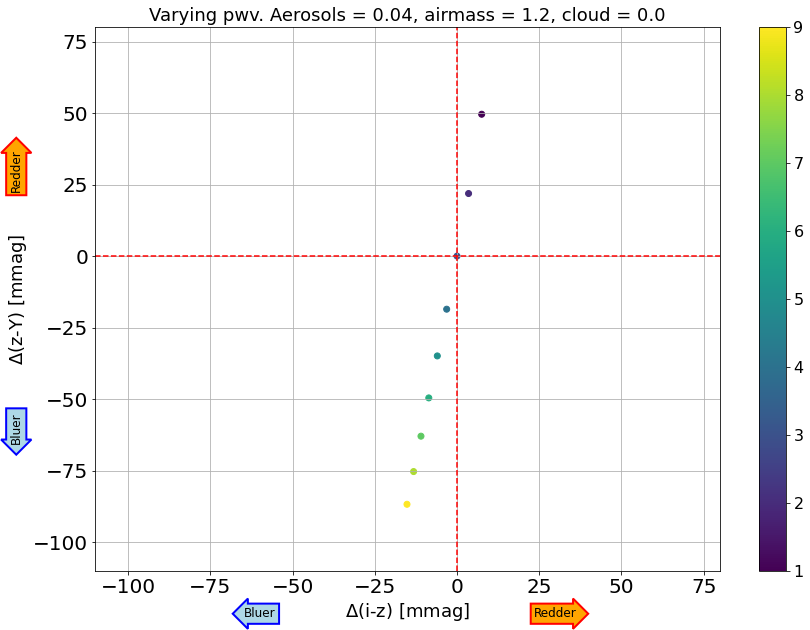

In [91]:
colorx = 'i-z'
colory = 'z-Y'
plt.figure(figsize=(14,10))
delta1 = (colour_dict[test_type][test_spec][colorx.lower()]-colour_dict_ref[test_type][test_spec][colorx.lower()])*1000.
delta2 = (colour_dict[test_type][test_spec][colory.lower()]-colour_dict_ref[test_type][test_spec][colory.lower()])*1000.
plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(-110,80)
plt.ylim(-110,80)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
plt.text(-134.,-60.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-134.,30.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-60.,-125.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(30.,-125,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, cloud = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=18)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_colour_colour_plot_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

Select Delta_color ranges 

In [92]:
rangex = (-110,80)
rangey = (-110,80)

Now we evaluate the colour - colour plot for all spectra of the example spectral type: 

In [93]:
save_plot = True

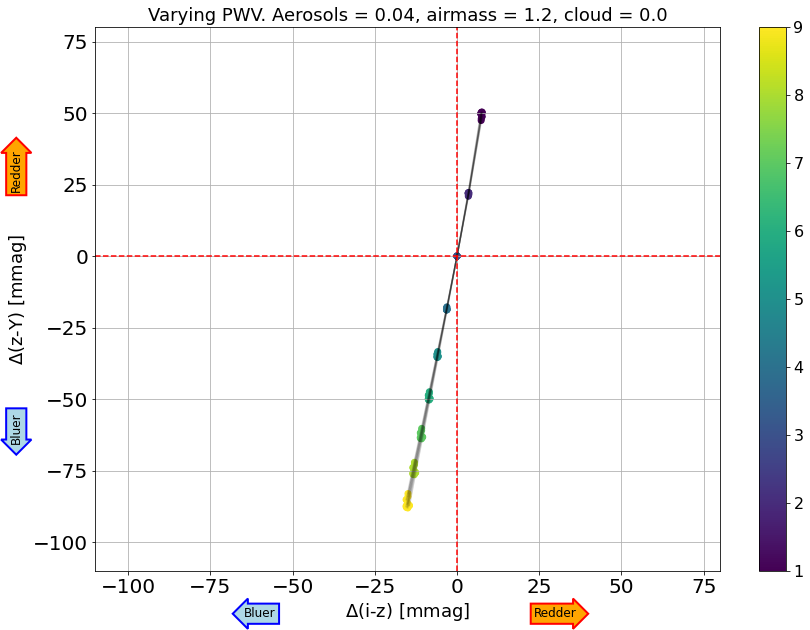

In [94]:
colorx = 'i-z'
colory = 'z-Y'
plt.figure(figsize=(14,10))
for si in colour_dict[test_type]:
    delta1 = (colour_dict[test_type][si][colorx.lower()]-colour_dict_ref[test_type][si][colorx.lower()])*1000.
    delta2 = (colour_dict[test_type][si][colory.lower()]-colour_dict_ref[test_type][si][colory.lower()])*1000.
    plt.plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
    plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(rangex)
plt.ylim(rangey)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)

plt.text(-134.,-60.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-134.,30.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-60.,-125.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(30.,-125,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))

if save_plot:
    if variable_param=='airmass' or variable_param=='cloud':
        plt.title('Varying {0}'.format(variable_param.upper()),fontsize=18)
    else:
        plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, cloud = {3}'.format(variable_param.upper(),aero0,am0,cloud0),fontsize=18)
    if variable_param=='airmass' or variable_param=='cloud':
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying{1}.png'.format(test_type,variable_param)))
    else:
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying_{1}_airmass_{2}_cloud_{3}.png'.format(test_type,variable_param,am0,cloud0)))


Let's evaluate the same colour - colour plot for the different spectral types: 

O
B
A
F
G
K
M


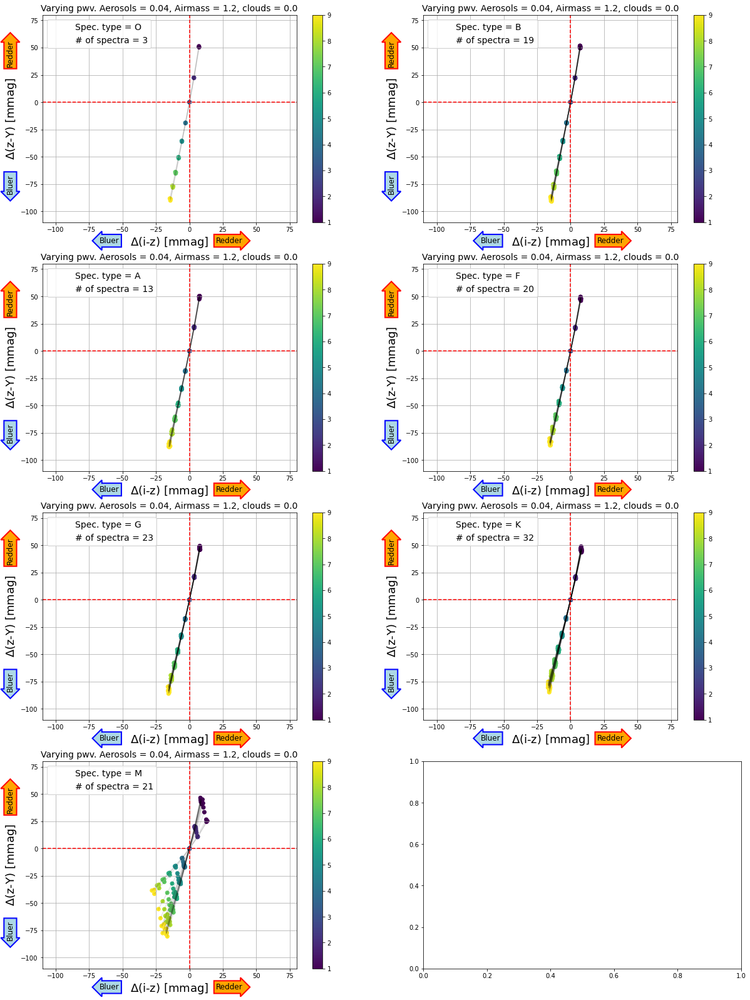

In [95]:
colorx = 'i-z'
colory = 'z-Y'

fig_rows = 4
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,28))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(spectral_types):
            spec_type = spectral_types[i]
            print(spec_type)
            
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(spec_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[spec_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Aerosols = {1}, Airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            
            axs[row,col].text(-134.,-75.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-134.,45.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-60.,-127.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(30.,-127,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1


Now we evaluate the different colour - colour plots for the example spectral type: 

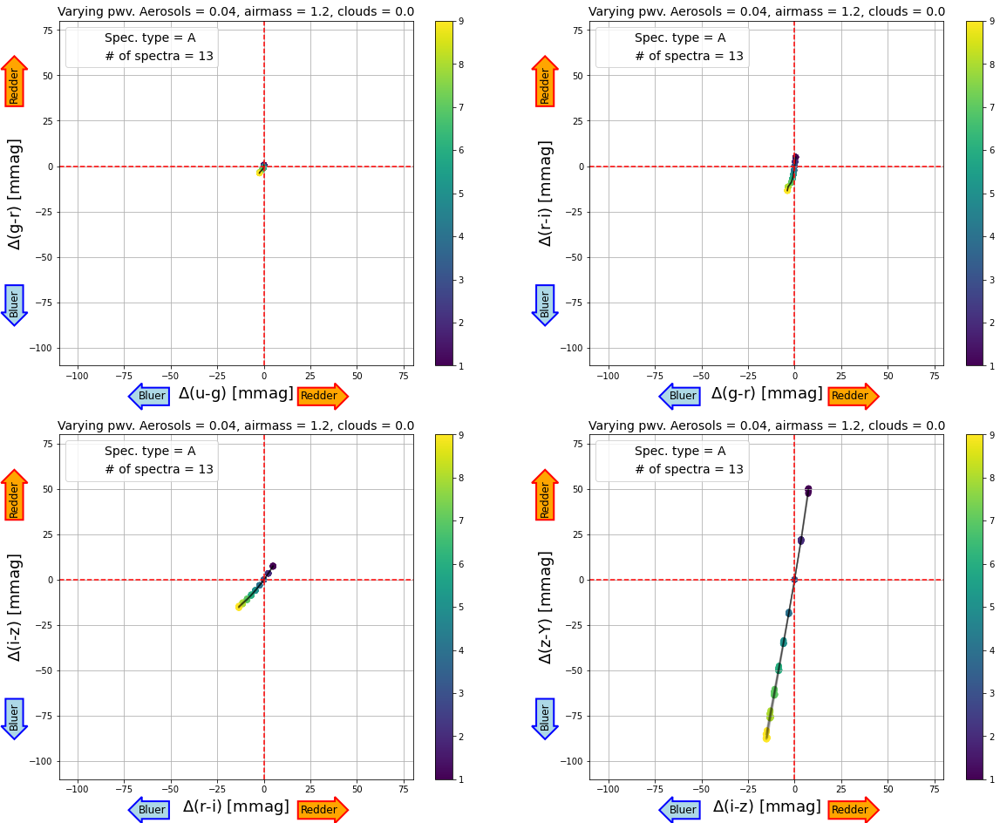

In [96]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for si in colour_dict[test_type]:
                delta1 = (colour_dict[test_type][si][cx.lower()]-colour_dict_ref[test_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[test_type][si][cy.lower()]-colour_dict_ref[test_type][si][cy.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            #axs[row,col].set_xlim(-0.012,0.021)
            #axs[row,col].set_ylim(-0.065,0.126)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(test_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[test_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            axs[row,col].text(-134.,-75.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-134.,45.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-60.,-127.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(30.,-127,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1

Let's have a look now at the colour-colour plots for all spectral types together 

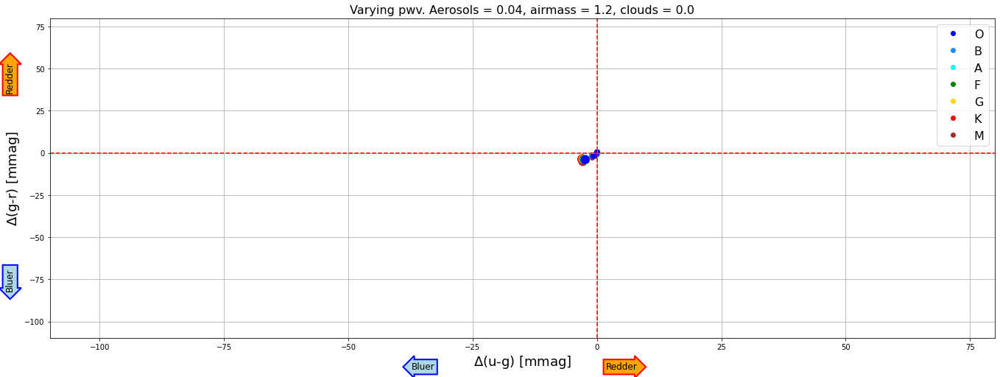

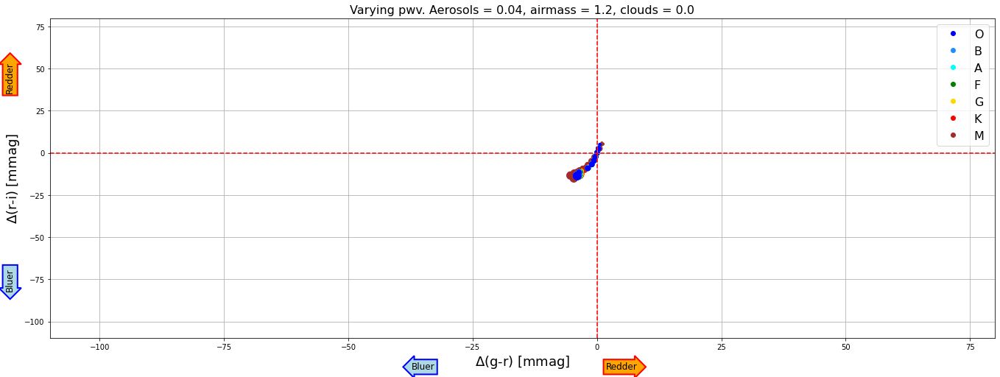

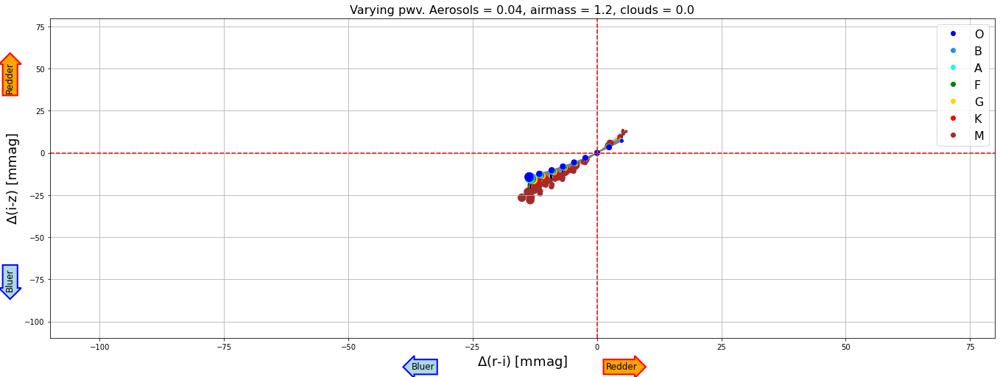

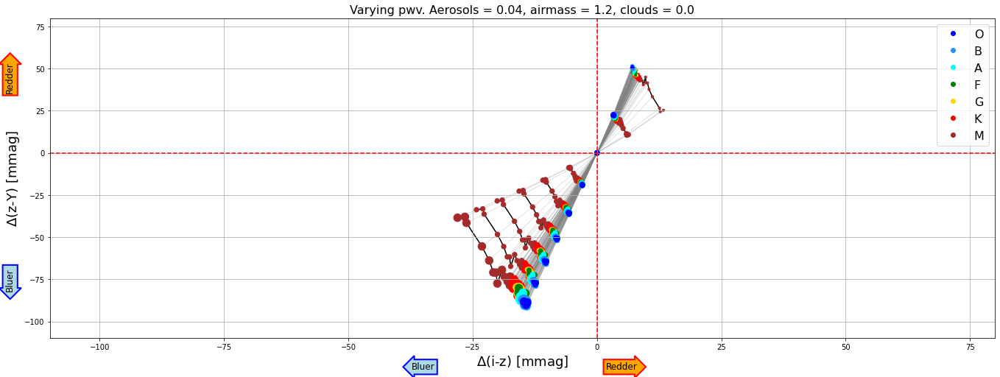

In [97]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(23,8))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex)
        #axs.set_xlim(-50,30)
        axs.set_ylim(rangey)
        #axs.set_ylim(-140,90)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=16)
        
        
        axs.text(-118.,-75.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-118.,45.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-35.,-127.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(5.,-127,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0,cx,cy)))

# Calculate colour evolution for SNe Ia spectra 

We use the SNe Ia spectra from https://github.com/rhiannonlynne/photometry_sample/tree/main/sn 

In [98]:
sne_path = 'data/SNIa_spectra/'
sn1_data = np.loadtxt(os.path.join(sne_path,'sn1a_10.0.dat'))
sn2_data = np.loadtxt(os.path.join(sne_path,'sn1a_15.0.dat'))
sn3_data = np.loadtxt(os.path.join(sne_path,'sn1a_20.0.dat'))

The wavelengths are in nm and the fluxes in erg/s/cm2/nm, so we need to change the units to angstrom and photlam = #photons/s/cm2/angstrom (pysynphot assumes that the input fluxes are in photlam). For this, we need to remember that the conversion between flam (erg/s/cm2/angstrom) and photlam is given by 

$$ photlam = \frac{\lambda}{h \cdot c} flam $$

In [99]:
sn1wave = sn1_data[:,0]*10.
sn2wave = sn2_data[:,0]*10.
sn3wave = sn3_data[:,0]*10.

sn1flux = sn1_data[:,1]*sn1wave/(h_planck*c_light)
sn2flux = sn2_data[:,1]*sn2wave/(h_planck*c_light)
sn3flux = sn3_data[:,1]*sn3wave/(h_planck*c_light)

In [100]:
sn1 = S.ArraySpectrum(sn1wave,sn1flux,name='sn1a_10.0')
sn2 = S.ArraySpectrum(sn2wave,sn2flux,name='sn1a_15.0')
sn3 = S.ArraySpectrum(sn3wave,sn3flux,name='sn1a_20.0')

In [101]:
sn1.waveunits, sn1.fluxunits

(<pysynphot.units.Angstrom at 0x7f80af661df0>,
 <pysynphot.units.Photlam at 0x7f80af661f10>)

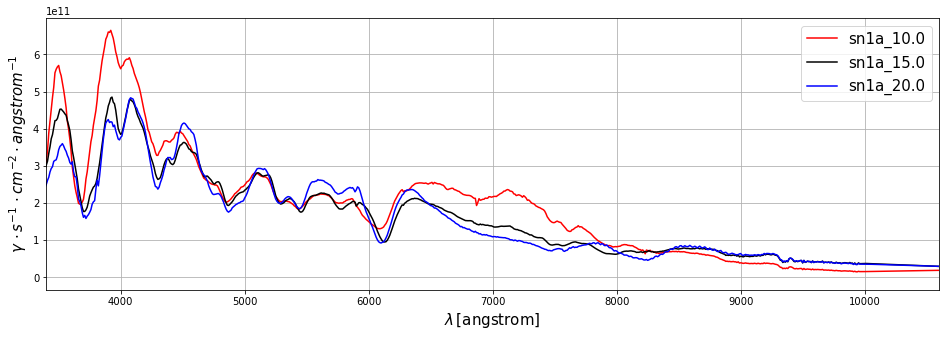

In [102]:
fig=plt.figure(figsize=(16,5))
plt.plot(sn1.wave,sn1.flux,color='r',label=sn1.name)
plt.plot(sn2.wave,sn2.flux,color='k',label=sn2.name)
plt.plot(sn3.wave,sn3.flux,color='b',label=sn3.name)
plt.xlim(WLMIN,WLMAX)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot s^{-1} \, \cdot cm^{-2} \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=15)

Now we pass the SNIa spectra through the total passbands, as with the calibration spectra 

In [103]:
sn_list = [sn1,sn2,sn3]

In [104]:
# SNe Ia through atm x throughput 
sn_obs_dict = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    sn_obs_dict[si] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [105]:
print(len(sn_obs_dict.keys()))
print(len(sn_obs_dict[0].keys()))
print(len(sn_obs_dict[0]['u']))

3
6
9


In [106]:
# SNe Ia only through throughput (as if telescope was in space) 
sn_obs_dict_t = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    sn_obs_dict_t[si] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [107]:
print(len(sn_obs_dict_t.keys()))
print(len(sn_obs_dict_t[0].keys()))
print(sn_obs_dict_t[0]['u'].flux)

3
6
[0. 0. 0. ... 0. 0. 0.]


Text(0.5, 1.0, 'Varying pwv. Aerosols = 0.04, airmass = 1.2, clouds = 0.0')

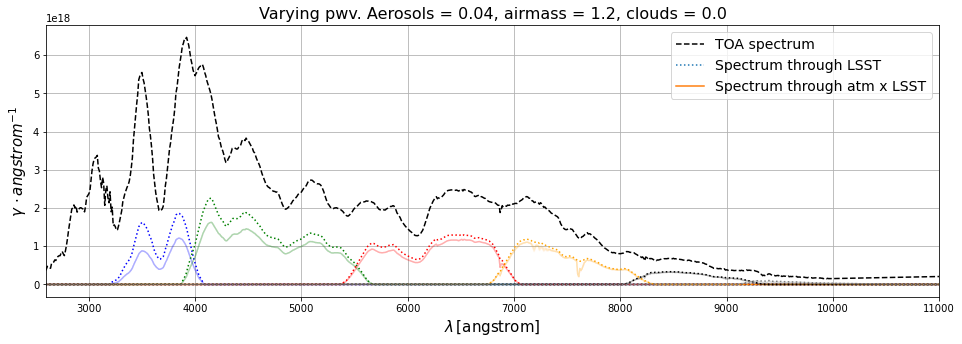

In [108]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)

We zoom in to see the effect of the different atmospheric transparencies 

Text(0.5, 1.0, 'Varying pwv. Aerosols = 0.04, airmass = 1.2, clouds = 0.0')

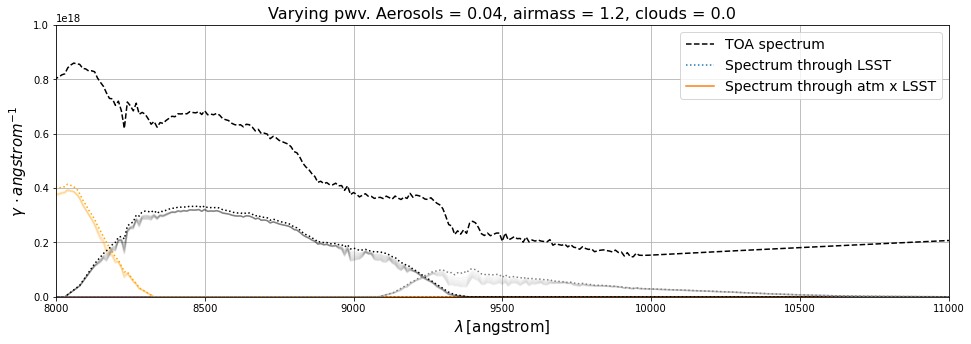

In [109]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.07)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(8000.,11000.)
plt.ylim(0,1e18)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)

We can now calculate the magnitudes and colours 

In [110]:
# Magnitudes of spectra passing through atm x throughput 
sn_mag_dict = {}
sn_mag_dict_ref = {}
sn_mag_err_dict = {}
sn_mag_err_dict_ref = {}
for si,obs_spec_ in enumerate(sn_list):
    mag_dict_ = {}
    mag_dict_ref_ = {}
    mag_err_dict_ = {}
    mag_err_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        mag_err_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            if calc_mag_err:
                mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                mag_err_dict_[filter].append(mag_err_ab_)
            else:
                mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        if calc_mag_err:
            mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
            mag_err_dict_ref_[filter] = mag_err_ab_
        else:
            mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    sn_mag_dict[si] = mag_dict_
    sn_mag_dict_ref[si] = mag_dict_ref_
    sn_mag_err_dict[si] = mag_err_dict_
    sn_mag_err_dict_ref[si] = mag_err_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 4.99e+20
Numerator = 4.99e+20
Variance of the numerator = 8.69e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.52112292199489
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 4.99e+20
Numerator = 4.99e+20
Variance of the numerator = 8.69e+19

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.30e+21
Numerator = 1.30e+21
Variance of the numerator = 5.59e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.813131327827442
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.30e+21
Numerator = 1.30e+21
Variance of the numerator = 5.59e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.81243490102

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.63e+20
Numerator = 2.63e+20
Variance of the numerator = 1.11e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.829193915811853
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.98e+19
Numerator = 5.98e+19
Variance of the numerator = 1.43e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -18.89955657360

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.59e+21
Numerator = 1.59e+21
Variance of the numerator = 5.77e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.71473431113978
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.59e+21
Numerator = 1.59e+21
Variance of the numerator = 5.77e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.714716840092

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.60e+20
Numerator = 5.60e+20
Variance of the numerator = 2.40e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.224481639601134
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.69e+20
Numerator = 5.69e+20
Variance of the numerator = 2.48e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.24234134683

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.40e+20
Numerator = 3.40e+20
Variance of the numerator = 5.77e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.102787873382898
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.40e+20
Numerator = 3.40e+20
Variance of the numerator = 5.77e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.10280056820

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.15e+21
Numerator = 1.15e+21
Variance of the numerator = 4.90e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.677303684152797
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.15e+21
Numerator = 1.15e+21
Variance of the numerator = 4.90e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.67691458241

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.11e+20
Numerator = 1.11e+20
Variance of the numerator = 2.54e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.573644735998663
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.08e+20
Numerator = 1.08e+20
Variance of the numerator = 2.39e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.54481368126

In [111]:
print(len(sn_mag_dict.keys()))
print(len(sn_mag_dict[0].keys()))
print(len(sn_mag_dict[0]['u']))

3
6
9


In [112]:
sn_colour_dict = {}
sn_colour_err_dict = {}
for sn in sn_mag_dict.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict[sn] = c_dict
    sn_colour_err_dict[sn] = c_err_dict


In [113]:
print(len(sn_mag_dict.keys()))
print(len(sn_colour_dict.keys()))
print(len(sn_colour_dict[0].keys()))
print(len(sn_colour_dict[0]['u-g']))

3
3
5
9


In [114]:
sn_colour_dict_ref = {}
sn_colour_err_dict_ref = {}
for sn in sn_mag_dict_ref.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict_ref[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict_ref[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict_ref[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict_ref[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict_ref[sn] = c_dict
    sn_colour_err_dict_ref[sn] = c_err_dict
    

In [115]:
print(len(sn_mag_dict_ref.keys()))
print(len(sn_colour_dict_ref.keys()))
print(len(sn_colour_dict_ref[0].keys()))
print(sn_colour_dict_ref[0]['u-g'])

3
3
5
0.273046167203578


In [116]:
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_dict)
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_dict_ref)
if calc_mag_err:
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict)
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict_ref)

In [117]:
rangex2 = (-40,25)
rangey2 = (-150,90)

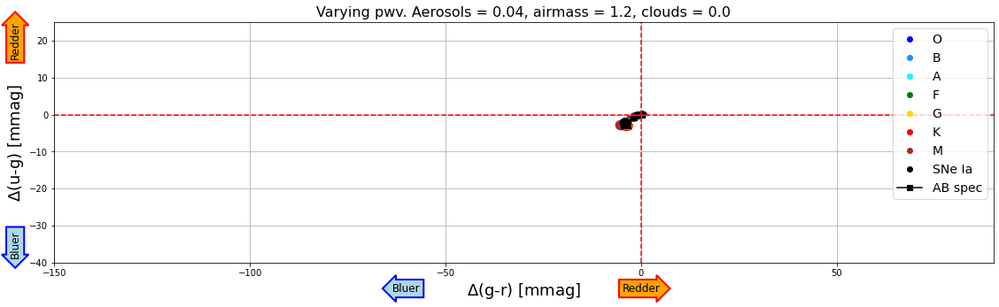

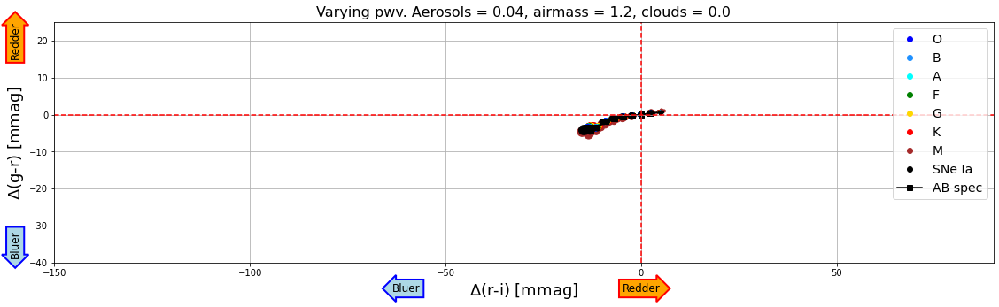

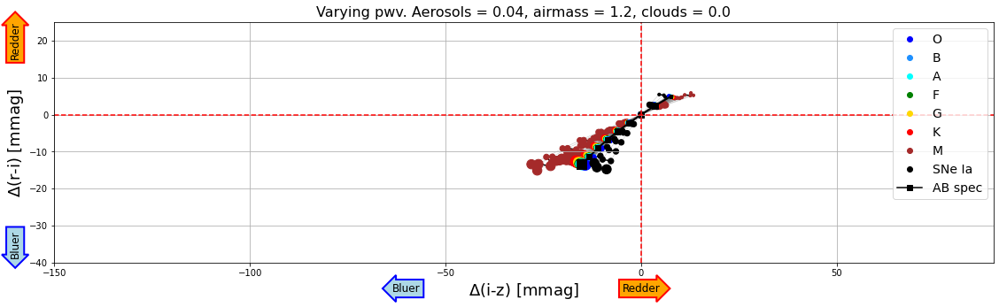

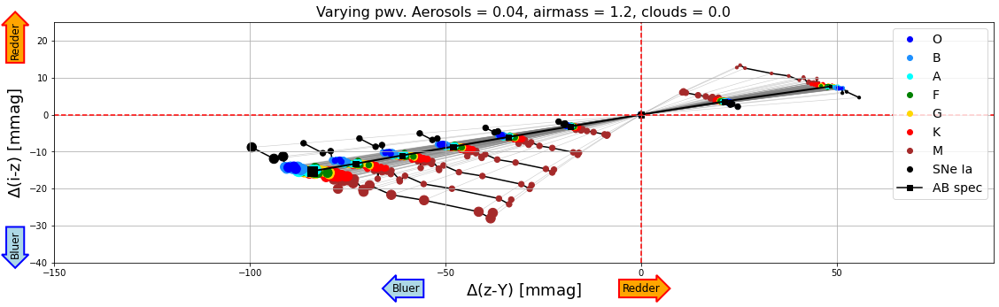

In [118]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        delta1_flat = (flat_colour_dict[cx.lower()]-flat_colour_dict_ref[cx.lower()])*1000.
        delta2_flat = (flat_colour_dict[cy.lower()]-flat_colour_dict_ref[cy.lower()])*1000.
        axs.scatter(delta1_flat,delta2_flat,c='k',marker='s',s=msize)
        axs.plot(delta1_flat,delta2_flat,ls='-',linewidth=2.0,marker='',color='k',alpha=1.0,zorder=1)
        axs.plot([],[],c='k',ls='-',marker='s',label='AB spec')
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-160.,-35.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-160.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-60.,-47.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(0.,-47.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn_flat_spectrum.png'.format(variable_param,am0,cloud0,cx,cy)))

# Redshift the SN Ia spectra 

In [119]:
redshifts = np.linspace(0.1,1.0,10)
print(redshifts)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


In [120]:
redshift_colors = {0.1:'b',0.2:'dodgerblue',0.3:'cyan',0.4:'g',0.5:'gold',0.6:'r',0.7:'brown',0.8:'grey',0.9:'darkgrey',1.0:'k'}

Apply redshift to the spectrum of one of the SN Ia

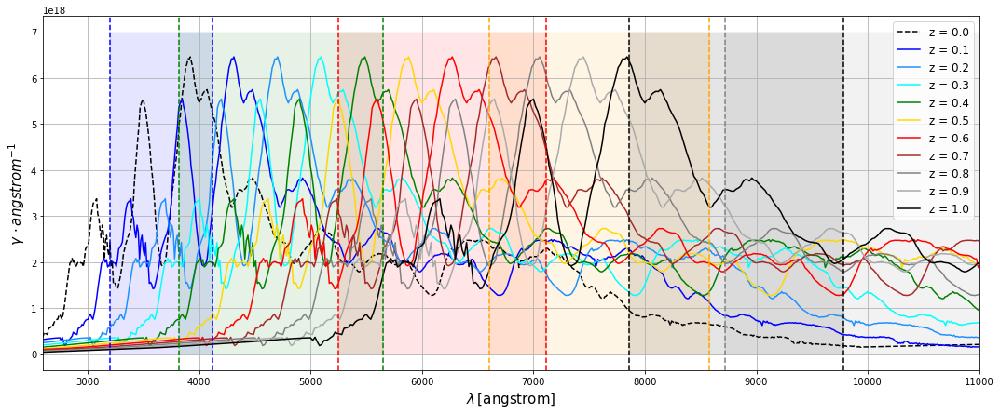

In [121]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
rs_dict = {}
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    rs_dict[round(redshift,1)] = sn1_z
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

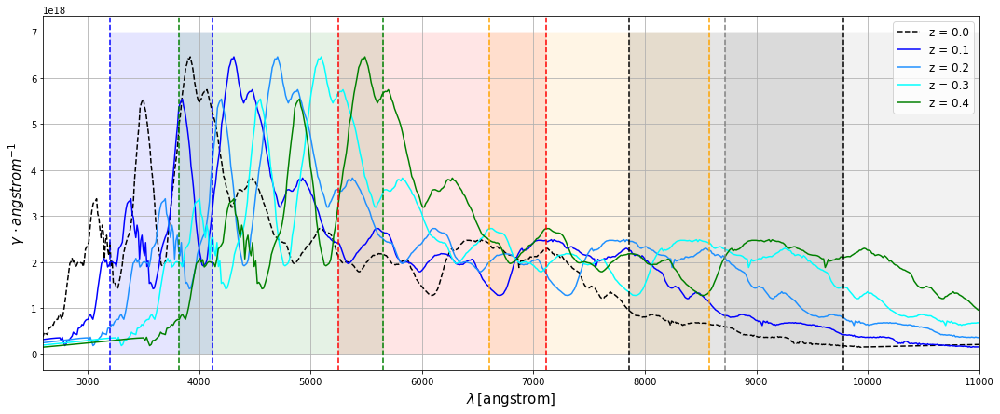

In [122]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[:4]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

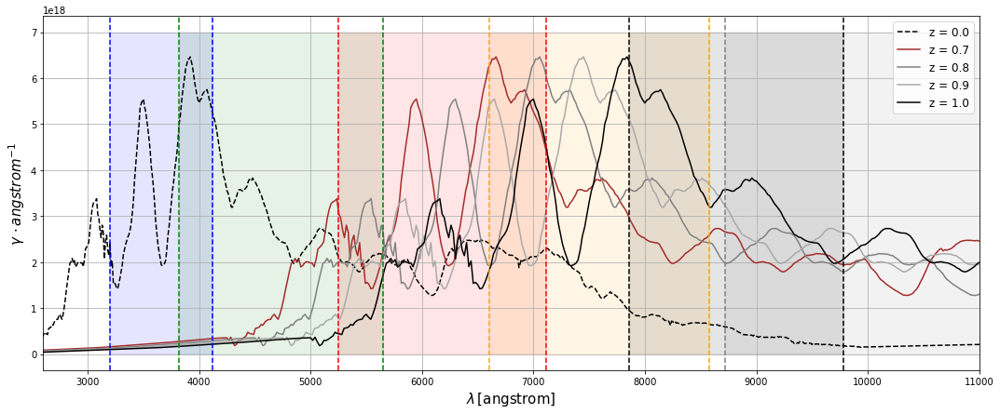

In [123]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[6:]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

Compute fluxes through atm x throughput 

In [124]:
# redshifted SN Ia through atm x throughput 
rs_sn_obs_dict = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    rs_sn_obs_dict[key] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [125]:
# redshifted SN Ia only through throughput (as if telescope was in space) 
rs_sn_obs_dict_t = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    rs_sn_obs_dict_t[key] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

Text(0.5, 1.0, 'Varying pwv. Aerosols = 0.04, airmass = 1.2, clouds = 0.0')

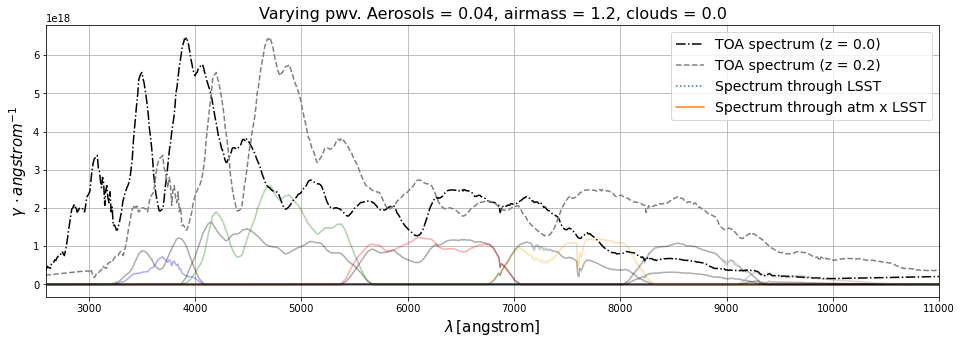

In [126]:
test_rs = 0.2
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='-.',color='k',label='TOA spectrum (z = 0.0)')
plt.plot(rs_dict[np.round(test_rs,1)].wave,rs_dict[np.round(test_rs,1)].flux*Seff*exptime,ls='--',color='grey',label='TOA spectrum (z = {0})'.format(test_rs))

for index,filter in enumerate(filters):
    #plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color='k')
    #plt.plot(rs_sn_obs_dict_t[test_rs][filter].wave,rs_sn_obs_dict_t[test_rs][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        obs_0 = sn_obs_dict[0][filter][i]
        obs_ = rs_sn_obs_dict[test_rs][filter][i]
        plt.plot(obs_0.wave,obs_0.flux*Seff*exptime,ls='-',color='k',alpha=0.04)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)

Now we calculate the magnitudes and colours 

In [127]:
# Magnitudes of spectra passing through atm x throughput 
rs_sn_mag_dict = {}
rs_sn_mag_dict_ref = {}
for key in rs_dict.keys():
    obs_spec_ = rs_dict[key]
    mag_dict_ = {}
    mag_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    rs_sn_mag_dict[key] = mag_dict_
    rs_sn_mag_dict_ref[key] = mag_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.88e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.247288759292708
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.88e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.247299413302528
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Ob

Numerator = 1.29e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.13091154970697
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.29e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.128353023230805
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.28e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 2.71e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.857420045989727
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.71e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.857530883794393
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.70e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 8.98e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.161536732565875
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.94e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.15633599317347
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.90e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 2.34e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -21.136315158672986
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.34e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -21.136328418939307
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.34e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.05e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.328528453029556
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.08e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.360208433687117
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.57e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 2.28e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.421226467639038
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.28e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.420920920577288
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.28e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 5.14e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.234788836953182
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.07e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.219283727364306
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.64e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.38e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.20273769557854
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.38e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.200265816137676
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.37e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.56e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.654199334041245
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.56e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.654382493612836
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.56e

Denominator = 4.55e+12
AB magnitude =  -21.40641295117004
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.66e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.40317733357289
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.65e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.399065281838
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wav

Numerator = 3.01e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.471790937497765
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.52e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.03900294604024
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.52e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.08e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.3607315002045
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.07e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.35587401478332
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.07e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3

Observation units =  fnu
Numerator = 6.12e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.67985209903032
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.02e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.287127831613578
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.02e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation u

Numerator = 5.05e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.214978760624348
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.62e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.332546077026223
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.13e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Denominator = 8.22e+12
AB magnitude =  -19.112503842951018
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.63e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.11295697560719
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.89e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.21556630620261
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the 

Numerator = 2.69e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.92901334094355
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.48e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.702598163804353
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.47e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Denominator = 1.65e+12
AB magnitude =  -21.421284739907254
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.9105288536537
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.910539581939453
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the 

Numerator = 1.49e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.955639628434554
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.49e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.95526838991052
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.48e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.84e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.940636815438296
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.83e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.934209859955402
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.82e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

In [128]:
rs_sn_colour_dict = {}
for rs in rs_sn_mag_dict.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict[rs] = c_dict

rs_sn_colour_dict_ref = {}
for rs in rs_sn_mag_dict_ref.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict_ref[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict_ref[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict_ref[rs] = c_dict
    

In [129]:
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict)
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict_ref)

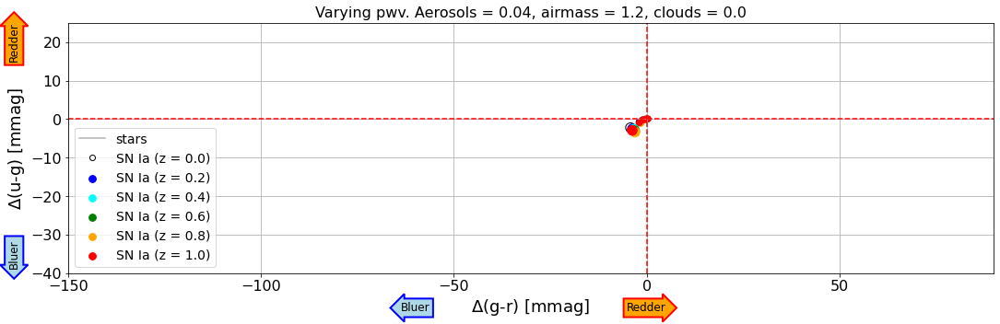

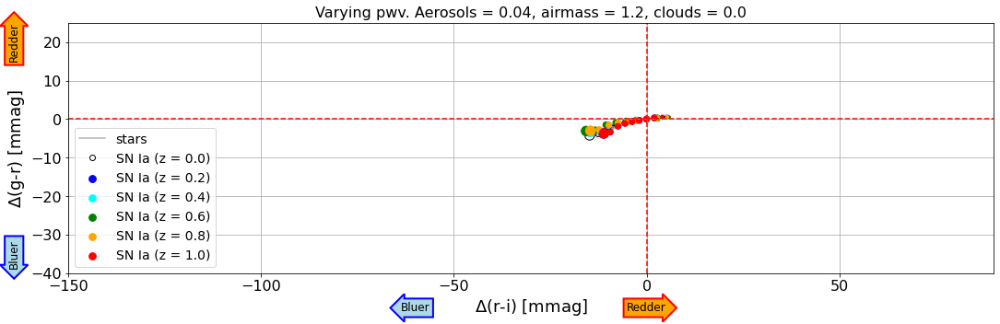

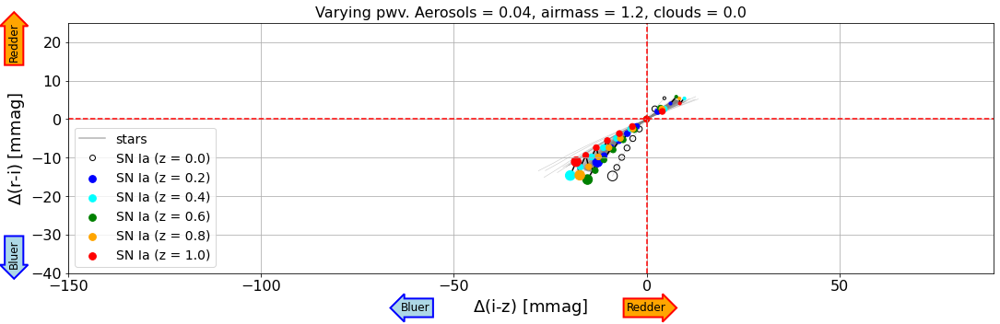

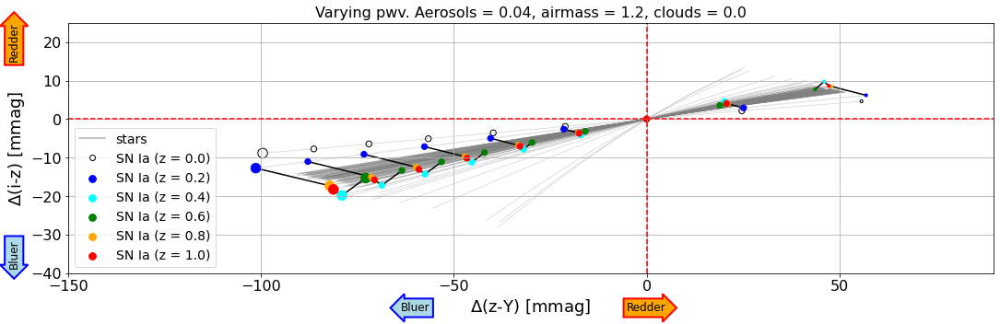

In [130]:
fig_rows = len(filters)-2

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'g',0.8:'orange',1.0:'r'}

i = 0
for row in range(fig_rows):
    if i<len(filters)-2:
        fig, axs = plt.subplots(1, 1, figsize=(18,8))
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1)
                #iso_vals2.append(delta2)
                    
                #axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        #for spec_type in spectral_types:
        #    axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1_sn)
                #iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=msize)
                    
            #else:
                #axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        
        #for rs in rs_sn_colour_dict.keys():
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=msize,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-164.,-35.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-164.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-60.,-49.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(0.,-49.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1

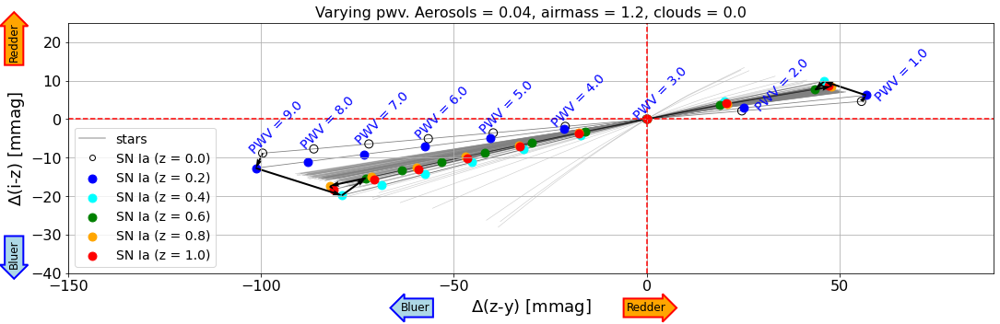

In [131]:
fig_rows = 1

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'g',0.8:'orange',1.0:'r'}

i = 0
if True:
    if True:
        fig, axs = plt.subplots(1, 1, figsize=(18,8))
        cy = 'i-z'
        cx = 'z-y'
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=80.)
                
                for i in range(len(delta1_sn)):
                    if i<=1:
                        xshift = 3.
                    else:
                        xshift = -4.
                    yshift = 0.01
                    axs.text(delta1_sn[i]+xshift,delta2_sn[i]+yshift,'PWV = {0}'.format(atm_vals[i]),color='b',rotation=45,size=14)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=80.,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        
        #axs.plot(iso_vals1[:,0],iso_vals2[:,0],ls='-',marker='',color='k',zorder=-1)
        #axs.plot(iso_vals1[:,-1],iso_vals2[:,-1],ls='-',marker='',color='k',zorder=-1)
        
        iso_vals1_min = iso_vals1[:,0]
        iso_vals1_max = iso_vals1[:,-1]
        iso_vals2_min = iso_vals2[:,0]
        iso_vals2_max = iso_vals2[:,-1]
        
        axs.quiver(iso_vals1_min[:-1],iso_vals2_min[:-1],iso_vals1_min[1:]-iso_vals1_min[:-1],iso_vals2_min[1:]-iso_vals2_min[:-1],scale_units='xy',angles='xy',scale=1,width=0.002)
        axs.quiver(iso_vals1_max[:-1],iso_vals2_max[:-1],iso_vals1_max[1:]-iso_vals1_max[:-1],iso_vals2_max[1:]-iso_vals2_max[:-1],scale_units='xy',angles='xy',scale=1,width=0.002)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Aerosols = {1}, airmass = {2}, clouds = {3}'.format(variable_param,aero0,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-164.,-35.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-164.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-60.,-49.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(0.,-49.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        i += 1